<a href="https://www.kaggle.com/code/sachitparmar8/ml-project?scriptVersionId=273882925" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# **Initial Code Setup and Datasets**

In [1]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set a style for all our plots
sns.set_style('darkgrid')

print("Libraries imported successfully!")

Libraries imported successfully!


 # Working with the first datset that is Sentiment140 now

In [2]:
filepath = '/kaggle/input/sentiment140/training.1600000.processed.noemoticon.csv'

# Define the column names for this dataset
# (The dataset file doesn't have a header, so we provide one)
col_names = ['sentiment', 'id', 'date', 'query', 'user', 'text']

# Load the dataset
try:
    df = pd.read_csv(
        filepath,
        header=None,  # No header row in the file
        names=col_names,  # Use our defined column names
        encoding='ISO-8859-1'  # This encoding is needed for this specific file
    )
    print("Dataset loaded successfully!")

except FileNotFoundError:
    print(f"Error: File not found at {filepath}")
    print("Please make sure the 'filepath' variable is set correctly.")

Dataset loaded successfully!


In [3]:
# Check the adequacy and quality of the data
if 'df' in locals():
    print("--- 1. Adequacy of Data (Shape) ---")
    print(f"Dataset shape: {df.shape}")
    print(f"This dataset has {df.shape[0]} rows (tweets) and {df.shape[1]} columns (features).")
    print("\n")
    
    print("--- 2. First 5 Lines of Dataset ---")
    print(df.head())
    print("\n")

    print("--- 3. Data Quality (Info) ---")
    print("This shows data types and non-null (non-empty) counts:")
    df.info()

else:
    print("DataFrame 'df' is not loaded. Please check Code Block 2.")

--- 1. Adequacy of Data (Shape) ---
Dataset shape: (1600000, 6)
This dataset has 1600000 rows (tweets) and 6 columns (features).


--- 2. First 5 Lines of Dataset ---
   sentiment          id                          date     query  \
0          0  1467810369  Mon Apr 06 22:19:45 PDT 2009  NO_QUERY   
1          0  1467810672  Mon Apr 06 22:19:49 PDT 2009  NO_QUERY   
2          0  1467810917  Mon Apr 06 22:19:53 PDT 2009  NO_QUERY   
3          0  1467811184  Mon Apr 06 22:19:57 PDT 2009  NO_QUERY   
4          0  1467811193  Mon Apr 06 22:19:57 PDT 2009  NO_QUERY   

              user                                               text  
0  _TheSpecialOne_  @switchfoot http://twitpic.com/2y1zl - Awww, t...  
1    scotthamilton  is upset that he can't update his Facebook by ...  
2         mattycus  @Kenichan I dived many times for the ball. Man...  
3          ElleCTF    my whole body feels itchy and like its on fire   
4           Karoli  @nationwideclass no, it's not behaving at al

#  Extracting hashtags from the tweets# 

In [4]:
import re 

if 'df' in locals():
    print("Starting feature engineering...")

    # 1. Define a function to clean the tweet text
    def clean_text(text):
        text = re.sub(r'https?://[A-Za-z0-9./]+', '', text) # Remove URLs
        text = re.sub(r'@[A-Za-z0-9_]+', '', text) # Remove mentions
        text = re.sub(r'[^A-Za-z0-9#\s]', '', text) # Remove non-alphanumeric (keep # and spaces)
        return text.lower()

    # 2. Define a function to extract hashtags
    def extract_hashtags(text):
        return re.findall(r'#(\w+)', text)

    # 3. Apply these functions to create new columns
    print("Cleaning text and extracting hashtags...")
    
    # Create a new 'cleaned_text' column
    df['cleaned_text'] = df['text'].apply(clean_text)
    
    # Create the 'hashtags_list' column from the cleaned text
    df['hashtags_list'] = df['cleaned_text'].apply(extract_hashtags)
    
    # Create the 'hashtag_count' column
    df['hashtag_count'] = df['hashtags_list'].apply(len)
    
    # Create the 'post_length' column
    df['post_length'] = df['cleaned_text'].apply(len)

    print("Feature engineering complete!")
    print("\n")

    # --- 4. Check our work ---
    print("--- DataFrame Head with New Features ---")
    # We display the last 4 columns to see our new features clearly
    print(df[['text', 'cleaned_text', 'hashtags_list', 'hashtag_count', 'post_length']].head())
    print("\n")
    
    print("--- Quick Stats on New Features ---")
    print(df[['post_length', 'hashtag_count']].describe())

else:
    print("DataFrame 'df' is not loaded. Please run the previous code blocks first.")

Starting feature engineering...
Cleaning text and extracting hashtags...
Feature engineering complete!


--- DataFrame Head with New Features ---
                                                text  \
0  @switchfoot http://twitpic.com/2y1zl - Awww, t...   
1  is upset that he can't update his Facebook by ...   
2  @Kenichan I dived many times for the ball. Man...   
3    my whole body feels itchy and like its on fire    
4  @nationwideclass no, it's not behaving at all....   

                                        cleaned_text hashtags_list  \
0     awww thats a bummer  you shoulda got david ...            []   
1  is upset that he cant update his facebook by t...            []   
2   i dived many times for the ball managed to sa...            []   
3    my whole body feels itchy and like its on fire             []   
4   no its not behaving at all im mad why am i he...            []   

   hashtag_count  post_length  
0              0           74  
1              0          105  


**Seeing how many tweets actually have hashtags in our dataset**

In [5]:
if 'df' in locals():
    print("--- Verifying that we have hashtags ---")
    
    # Create a new DataFrame called 'df_with_hashtags'
    # This will only contain rows where 'hashtag_count' > 0
    df_with_hashtags = df[df['hashtag_count'] > 0]
    
    # Check the shape of this new DataFrame
    print(f"Total rows in original dataset: {df.shape[0]}")
    print(f"Total rows WITH hashtags: {df_with_hashtags.shape[0]}")
    
    if df_with_hashtags.shape[0] > 0:
        print("\nSuccessfully found hashtags!")
        print("Here are the first 5 rows that contain hashtags:")
        
        # Display the same columns as before, but only for our new filtered data
        print(df_with_hashtags[['text', 'cleaned_text', 'hashtags_list', 'hashtag_count']].head())
    else:
        print("\nInteresting... it seems this dataset truly has no hashtags.")
        print("We may need to try one of the other 3 datasets.")

else:
    print("DataFrame 'df' is not loaded. Please run the previous code blocks first.")

--- Verifying that we have hashtags ---
Total rows in original dataset: 1600000
Total rows WITH hashtags: 36035

Successfully found hashtags!
Here are the first 5 rows that contain hashtags:
                                                  text  \
83                         @markhardy1974 Me too  #itm   
175  @machineplay I'm so sorry you're having to go ...   
190  I activated my Selfcontrol block early, meanin...   
193  @goodlaura What about Reese dying on #TTSC? An...   
331  My man crush Jake Peavy let me down  #gayforpeavy   

                                          cleaned_text  hashtags_list  \
83                                        me too  #itm          [itm]   
175   im so sorry youre having to go through this a...  [therapyfail]   
190  i activated my selfcontrol block early meaning...           [fb]   
193   what about reese dying on #ttsc and season fi...     [ttsc, 24]   
331  my man crush jake peavy let me down  #gayforpeavy  [gayforpeavy]   

     hashtag_count  


## Descriptive statistics of tweests with hashtags# 

In [6]:
if 'df' in locals():
    # 1. Create our new DataFrame, focusing only on rows with hashtags
    df_analysis = df[df['hashtag_count'] > 0].copy()
    
    # 2. Check adequacy of this new data
    print(f"--- Adequacy of Filtered Data ---")
    print(f"Original shape: {df.shape}")
    print(f"Shape after filtering for hashtags: {df_analysis.shape}")
    print(f"We have {df_analysis.shape[0]} usable tweets for our analysis.")
    print("\n")

    # 3. Generate Descriptive Statistics (as per your prompt and sample report)
    print(f"--- Descriptive Statistics (Part II) ---")
    
    # We select the numerical columns we created
    stats_df = df_analysis[['post_length', 'hashtag_count']]
    
    print(stats_df.describe())

else:
    print("DataFrame 'df' is not loaded. Please run the previous code blocks first.")

--- Adequacy of Filtered Data ---
Original shape: (1600000, 10)
Shape after filtering for hashtags: (36035, 10)
We have 36035 usable tweets for our analysis.


--- Descriptive Statistics (Part II) ---
        post_length  hashtag_count
count  36035.000000   36035.000000
mean      78.114333       1.229333
std       32.517133       0.874116
min        6.000000       1.000000
25%       51.000000       1.000000
50%       77.000000       1.000000
75%      106.000000       1.000000
max      152.000000      24.000000


--- Distribution Pattern and Imbalance Analysis ---


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


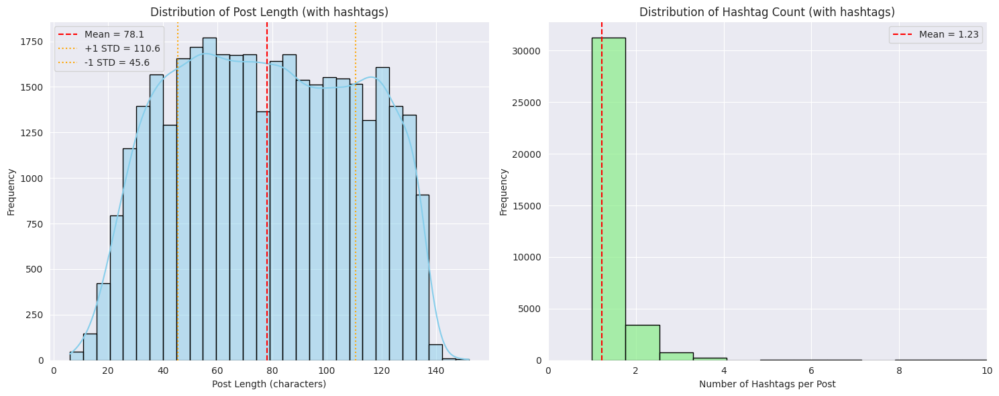


--- Numerical Imbalance Summary ---
Post Length → Mean: 78.11, Std: 32.52, Skewness: 0.01, Variability Ratio (std/mean): 0.42
Hashtag Count → Mean: 1.23, Std: 0.87, Skewness: 8.05, Variability Ratio (std/mean): 0.71

--- Automated Observations ---
✅ Post lengths are relatively consistent — textual balance looks good.
✅ Post length distribution is approximately symmetric.
⚠️ Hashtag counts are very uneven — a few posts use many hashtags while most use very few.
⚠️ Hashtag count distribution is strongly skewed — outliers likely dominate.


In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# --- Enhanced Descriptive + Imbalance Visualization ---
if 'df_analysis' in locals():
    print("--- Distribution Pattern and Imbalance Analysis ---")

    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # ========== 1. Post Length Distribution ==========
    sns.histplot(df_analysis['post_length'], kde=True, bins=30, ax=axes[0], color='skyblue', edgecolor='black')
    axes[0].set_title('Distribution of Post Length (with hashtags)')
    axes[0].set_xlabel('Post Length (characters)')
    axes[0].set_ylabel('Frequency')

    # Compute imbalance metrics
    mean_len = df_analysis['post_length'].mean()
    std_len = df_analysis['post_length'].std()
    skew_len = df_analysis['post_length'].skew()
    len_ratio = std_len / mean_len

    # Add visual lines for mean and std
    axes[0].axvline(mean_len, color='red', linestyle='--', label=f'Mean = {mean_len:.1f}')
    axes[0].axvline(mean_len + std_len, color='orange', linestyle=':', label=f'+1 STD = {mean_len + std_len:.1f}')
    axes[0].axvline(mean_len - std_len, color='orange', linestyle=':', label=f'-1 STD = {mean_len - std_len:.1f}')
    axes[0].legend()

    # ========== 2. Hashtag Count Distribution ==========
    sns.histplot(df_analysis['hashtag_count'], kde=False, bins=30, ax=axes[1], color='lightgreen', edgecolor='black')
    axes[1].set_title('Distribution of Hashtag Count (with hashtags)')
    axes[1].set_xlabel('Number of Hashtags per Post')
    axes[1].set_ylabel('Frequency')
    axes[1].set_xlim(0, 10)

    # Compute imbalance metrics for hashtags
    mean_hash = df_analysis['hashtag_count'].mean()
    std_hash = df_analysis['hashtag_count'].std()
    skew_hash = df_analysis['hashtag_count'].skew()
    hash_ratio = std_hash / mean_hash

    # Visual indicators
    axes[1].axvline(mean_hash, color='red', linestyle='--', label=f'Mean = {mean_hash:.2f}')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

    # ========== 3. Numerical Summary ==========
    print("\n--- Numerical Imbalance Summary ---")
    print(f"Post Length → Mean: {mean_len:.2f}, Std: {std_len:.2f}, Skewness: {skew_len:.2f}, Variability Ratio (std/mean): {len_ratio:.2f}")
    print(f"Hashtag Count → Mean: {mean_hash:.2f}, Std: {std_hash:.2f}, Skewness: {skew_hash:.2f}, Variability Ratio (std/mean): {hash_ratio:.2f}")

    # ========== 4. Automated Observations ==========
    print("\n--- Automated Observations ---")

    # Post length analysis
    if len_ratio > 0.5:
        print("⚠️ Post lengths are highly variable — possible textual imbalance. Some tweets are much longer than others.")
    else:
        print("✅ Post lengths are relatively consistent — textual balance looks good.")

    if abs(skew_len) > 1:
        print(f"⚠️ The distribution of post length is strongly {'right' if skew_len > 0 else 'left'}-skewed, indicating outliers.")
    elif abs(skew_len) > 0.5:
        print(f"ℹ️ The distribution is moderately {'right' if skew_len > 0 else 'left'}-skewed.")
    else:
        print("✅ Post length distribution is approximately symmetric.")

    # Hashtag count analysis
    if hash_ratio > 0.7:
        print("⚠️ Hashtag counts are very uneven — a few posts use many hashtags while most use very few.")
    else:
        print("✅ Hashtag usage is relatively balanced across posts.")

    if abs(skew_hash) > 1:
        print("⚠️ Hashtag count distribution is strongly skewed — outliers likely dominate.")
    else:
        print("ℹ️ Hashtag count distribution shows mild skewness — acceptable for social data.")

else:
    print("DataFrame 'df_analysis' is not loaded. Please run the previous blocks first.")


## Checking for outliers with boxplot

--- 11. Checking for Outliers (Part II) ---


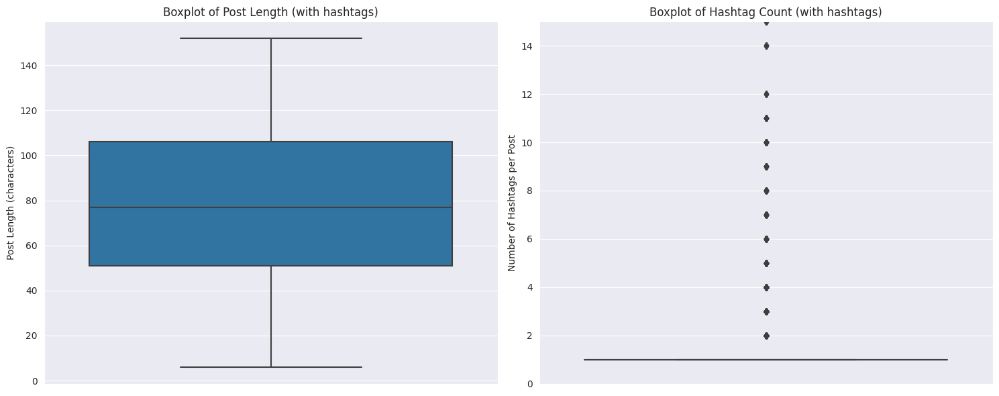

In [8]:
if 'df_analysis' in locals():
    print("--- 11. Checking for Outliers (Part II) ---")
    
    # Set the figure size for our plots
    plt.figure(figsize=(15, 6))

    # 1. Plot boxplot for 'post_length'
    plt.subplot(1, 2, 1)  # (1 row, 2 columns, 1st plot)
    sns.boxplot(y=df_analysis['post_length'])
    plt.title('Boxplot of Post Length (with hashtags)')
    plt.ylabel('Post Length (characters)')

    # 2. Plot boxplot for 'hashtag_count'
    plt.subplot(1, 2, 2)  # (1 row, 2 columns, 2nd plot)
    sns.boxplot(y=df_analysis['hashtag_count'])
    plt.title('Boxplot of Hashtag Count (with hashtags)')
    plt.ylabel('Number of Hashtags per Post')
    
    # We limit the y-axis to see the box, as outliers are far away
    plt.ylim(0, 15) 

    plt.tight_layout() # Adjusts plots to prevent overlap
    plt.show()

else:
    print("DataFrame 'df_analysis' is not loaded. Please run Code Block 6 first.")

## Trimming the data for such that outliers dont impact our results

In [9]:
from scipy import stats # We need this for the trim_mean function

if 'df_analysis' in locals():
    print("--- 12. Obtaining Trimmed Statistics (Part II) ---")
    
    # 1. Define our trimming fraction
    # We'll trim 5% from the top and 5% from the bottom, for a total of 10%
    trim_fraction = 0.05 
    
    # --- For Post Length ---
    print("\n--- Post Length Stats ---")
    # Get the original (non-trimmed) mean
    original_mean = df_analysis['post_length'].mean()
    
    # Calculate the Trimmed Mean (X¯T)
    # Note: scipy's trim_mean asks for the proportion to cut from *each* end.
    trimmed_mean = stats.trim_mean(df_analysis['post_length'], trim_fraction)
    
    print(f"Original Mean: {original_mean:.2f}")
    print(f"Trimmed Mean (X¯T): {trimmed_mean:.2f}")

    # --- For Hashtag Count ---
    print("\n--- Hashtag Count Stats ---")
    original_mean_hc = df_analysis['hashtag_count'].mean()
    trimmed_mean_hc = stats.trim_mean(df_analysis['hashtag_count'], trim_fraction)
    
    print(f"Original Mean: {original_mean_hc:.2f}")
    print(f"Trimmed Mean (X¯T): {trimmed_mean_hc:.2f}")
    
    
    # 2. Calculate Trimmed Median (M¯T) and Standard Deviation (ST)
    # To do this, we manually filter the data by removing the top/bottom 5%
    
    print("\n--- Manual Trim for Median/Std Dev ---")
    
    # Calculate the 5th and 95th percentiles (quantiles)
    low_quantile = df_analysis['post_length'].quantile(0.05)
    high_quantile = df_analysis['post_length'].quantile(0.95)
    
    print(f"Trimming post_length data below {low_quantile:.2f} and above {high_quantile:.2f}")

    # Create the new trimmed DataFrame
    df_trimmed = df_analysis[
        (df_analysis['post_length'] > low_quantile) &
        (df_analysis['post_length'] < high_quantile)
    ]
    
    # Calculate Trimmed Median (M¯T) and Standard Deviation (ST)
    trimmed_median = df_trimmed['post_length'].median()
    trimmed_std = df_trimmed['post_length'].std()
    
    print(f"Trimmed Median (M¯T): {trimmed_median:.2f}")
    print(f"Trimmed Standard Deviation (ST): {trimmed_std:.2f}")

else:
    print("DataFrame 'df_analysis' is not loaded. Please run the previous code blocks first.")

--- 12. Obtaining Trimmed Statistics (Part II) ---

--- Post Length Stats ---
Original Mean: 78.11
Trimmed Mean (X¯T): 78.18

--- Hashtag Count Stats ---
Original Mean: 1.23
Trimmed Mean (X¯T): 1.09

--- Manual Trim for Median/Std Dev ---
Trimming post_length data below 28.00 and above 130.00
Trimmed Median (M¯T): 78.00
Trimmed Standard Deviation (ST): 28.52


## Correlation of important parameters like post length and hashtag count

--- 13. Correlation Analysis (Part II) ---
Correlation Matrix:
               post_length  hashtag_count
post_length       1.000000       0.174777
hashtag_count     0.174777       1.000000




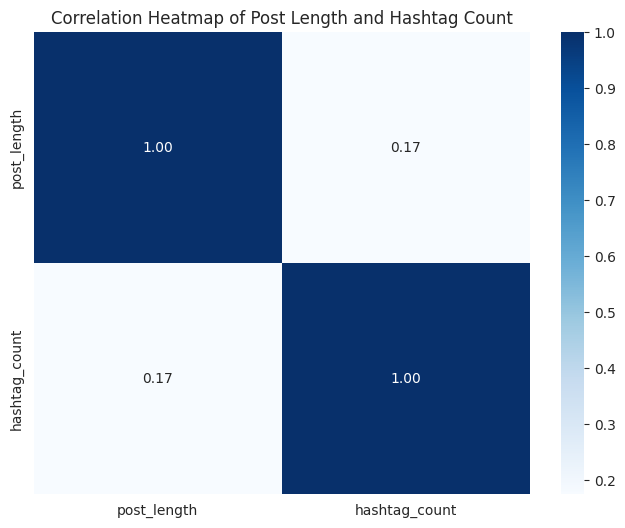

In [10]:
if 'df_analysis' in locals():
    print("--- 13. Correlation Analysis (Part II) ---")
    
    # 1. Select the columns we want to correlate
    correlation_data = df_analysis[['post_length', 'hashtag_count']]
    
    # 2. Calculate the correlation matrix
    correlation_matrix = correlation_data.corr()
    
    print("Correlation Matrix:")
    print(correlation_matrix)
    print("\n")

    # 3. Plot the correlation matrix as a heatmap
    plt.figure(figsize=(8, 6))
    
    # annot=True shows the correlation numbers on the plot
    # cmap='Blues' matches the color scheme of your sample report
    sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt='.2f')
    
    plt.title('Correlation Heatmap of Post Length and Hashtag Count')
    plt.show()

else:
    print("DataFrame 'df_analysis' is not loaded. Please run the previous code blocks first.")

### Preparing data for clustering-> TF-IDF(Term Frequency Inverse Document Frequency) => The problem is that algorithms like K-Means, DBSCAN, etc., only understand numbers, not text. We can't give them a list of hashtags like ['#python', '#datascience'].

### We must first convert our hashtags_list column into a numerical matrix.

In [11]:
from sklearn.feature_extraction.text import TfidfVectorizer

if 'df_analysis' in locals():
    print("--- Part III: Implementation ---")
    print("Step 1: Preparing data for clustering (TF-IDF)")

    # 1. Join the list of hashtags into a single space-separated string
    # TfidfVectorizer expects a list of strings, not a list of lists.
    # e.g., ['#ml', '#ai'] becomes "ml ai"
    # We use .copy() to avoid a pandas warning
    df_cluster = df_analysis.copy()
    df_cluster['hashtags_str'] = df_cluster['hashtags_list'].apply(lambda x: ' '.join(x))

    print("\nCreated 'hashtags_str' column:")
    print(df_cluster[['hashtags_list', 'hashtags_str']].head())

    # 2. Initialize the TF-IDF Vectorizer
    # We set max_features=2000 to keep the 2000 most common hashtags.
    # This prevents our matrix from becoming too large and slow.
    tfidf_vectorizer = TfidfVectorizer(max_features=2000, 
                                       stop_words='english', 
                                       max_df=0.9, 
                                       min_df=10)

    # 3. Fit and transform the data
    # This creates our numerical matrix X_tfidf
    print("\nVectorizing hashtags...")
    X_tfidf = tfidf_vectorizer.fit_transform(df_cluster['hashtags_str'])

    print("Vectorization complete!")
    print(f"Shape of our new TF-IDF matrix (X_tfidf): {X_tfidf.shape}")
    print(f"This means we have {X_tfidf.shape[0]} tweets (rows)")
    print(f"represented by {X_tfidf.shape[1]} unique hashtags (features/columns).")

else:
    print("DataFrame 'df_analysis' is not loaded. Please run the previous code blocks first.")

--- Part III: Implementation ---
Step 1: Preparing data for clustering (TF-IDF)

Created 'hashtags_str' column:
     hashtags_list hashtags_str
83           [itm]          itm
175  [therapyfail]  therapyfail
190           [fb]           fb
193     [ttsc, 24]      ttsc 24
331  [gayforpeavy]  gayforpeavy

Vectorizing hashtags...
Vectorization complete!
Shape of our new TF-IDF matrix (X_tfidf): (36035, 439)
This means we have 36035 tweets (rows)
represented by 439 unique hashtags (features/columns).


## Dimensionality reduction

--- Block 12: Dimensionality Reduction ---
Original matrix shape: (36035, 439)
Reducing dimensions from 439 to 50 components...
Reduction complete!
New reduced matrix shape: (36035, 50)
Total Explained Variance by 50 components: 62.19%


--- Visualizing the Reduced Data ---


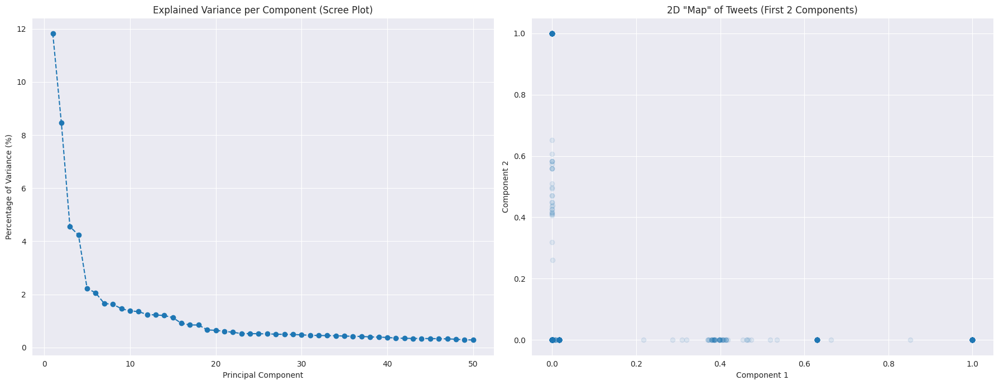

In [12]:
from sklearn.decomposition import TruncatedSVD
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# This block uses 'X_tfidf' from Block 11
if 'X_tfidf' in locals():
    print("--- Block 12: Dimensionality Reduction ---")
    print(f"Original matrix shape: {X_tfidf.shape}")

    # We'll reduce 2000 dimensions down to 50.
    # This is our new "n_components" for all clustering.
    # It's fast and will let us run all the algorithms.
    n_components = 50
    
    # 1. Initialize TruncatedSVD (the "PCA" for text)
    svd = TruncatedSVD(n_components=n_components, random_state=42)

    # 2. Fit and transform our TF-IDF matrix
    print(f"Reducing dimensions from {X_tfidf.shape[1]} to {n_components} components...")
    
    # This is our NEW, primary data for all clustering from now on
    X_reduced = svd.fit_transform(X_tfidf)

    print("Reduction complete!")
    print(f"New reduced matrix shape: {X_reduced.shape}")

    # 3. Check Explained Variance
    explained_variance = svd.explained_variance_ratio_.sum()
    print(f"Total Explained Variance by {n_components} components: {explained_variance*100:.2f}%")
    print("\n")
    
    # --- 4. VISUALIZATION (for your report) ---
    print("--- Visualizing the Reduced Data ---")
    
    plt.figure(figsize=(18, 7))

    # Plot 1: Explained Variance "Scree Plot"
    # This graph is for your report to justify our choice.
    plt.subplot(1, 2, 1)
    plt.plot(range(1, n_components + 1), svd.explained_variance_ratio_ * 100, marker='o', linestyle='--')
    plt.title('Explained Variance per Component (Scree Plot)')
    plt.xlabel('Principal Component')
    plt.ylabel('Percentage of Variance (%)')
    plt.grid(True)
    
    # Plot 2: Scatter plot of our new "map" of all tweets
    # This is the 2D map we will use to color our clusters.
    plt.subplot(1, 2, 2)
    # X_reduced[:, 0] is Component 1 (X-axis)
    # X_reduced[:, 1] is Component 2 (Y-axis)
    plt.scatter(X_reduced[:, 0], X_reduced[:, 1], alpha=0.1)
    plt.title('2D "Map" of Tweets (First 2 Components)')
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

else:
    print("TF-IDF matrix 'X_tfidf' is not found. Please run Block 11 first.")

## K means algorithm

--- Block 13: K-Means++ Elbow Method (on Reduced Data) ---
Calculating inertia for k=2 to k=15 to find the new elbow...
Completed for k=2
Completed for k=3
Completed for k=4
Completed for k=5
Completed for k=6
Completed for k=7
Completed for k=8
Completed for k=9
Completed for k=10
Completed for k=11
Completed for k=12
Completed for k=13
Completed for k=14
Completed for k=15
Calculation complete.



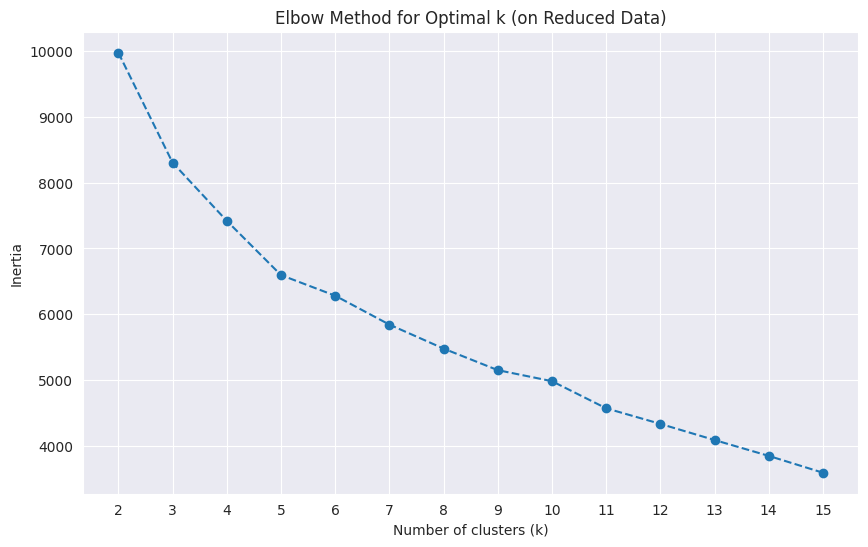

In [13]:
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# This block uses 'X_reduced' from Block 12
if 'X_reduced' in locals():
    print("--- Block 13: K-Means++ Elbow Method (on Reduced Data) ---")
    
    # --- Part 1: Find the Elbow ---
    print("Calculating inertia for k=2 to k=15 to find the new elbow...")
    inertia_list = []
    k_range = range(2, 16) # Test k from 2 to 15

    for k in k_range:
        # 'k-means++' is the default 'init' method
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        
        # We fit on our new 50-column matrix
        kmeans.fit(X_reduced)
        
        # inertia_ is the sum of squared distances
        inertia_list.append(kmeans.inertia_)
        print(f"Completed for k={k}")

    print("Calculation complete.\n")

    # --- Part 2: Plot the Elbow Method Graph ---
    plt.figure(figsize=(10, 6))
    plt.plot(k_range, inertia_list, marker='o', linestyle='--')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for Optimal k (on Reduced Data)')
    plt.xticks(k_range)
    plt.grid(True)
    plt.show()

else:
    print("Matrix 'X_reduced' is not found. Please run Block 12 first.")

**Now we know that k=5 is a good measure so now we will look for results for this value of k**

--- Running final K-Means model with k=5 ---
Successfully added 'hashtag_group_kmeans' column to df_analysis.

Cluster distribution (Number of tweets per group):
hashtag_group_kmeans
0    29907
1     2499
2      945
3     1766
4      918
Name: count, dtype: int64

--- Visualizing Top Hashtags per Cluster (K-Means) ---


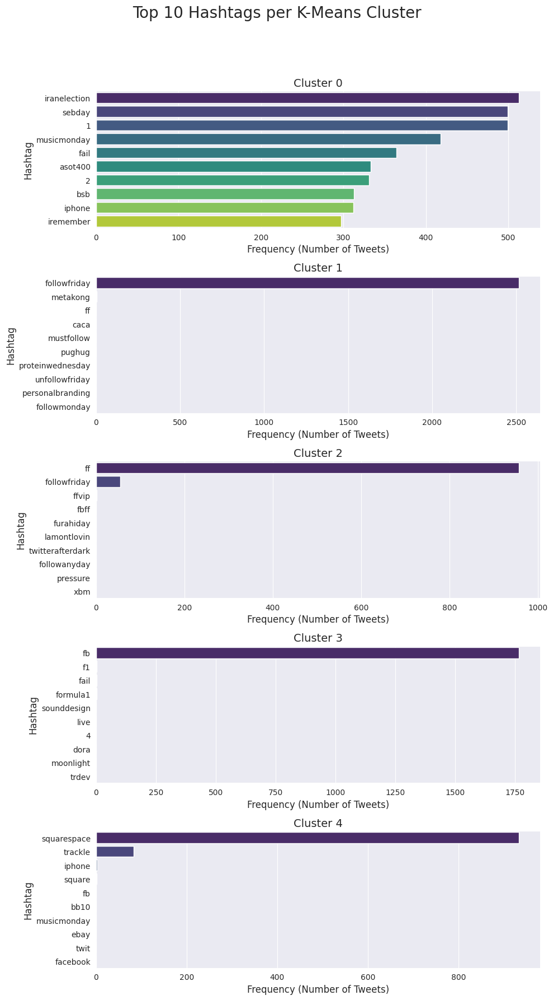

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# --- Block XX: Final K-Means and Hashtag Visualization (Dataset 1) ---
if 'X_reduced' in locals() and 'df_analysis' in locals():
    
    # --- Part 1: Run Final K-Means Model ---
    optimal_k = 5  # or your chosen k value (like 11)
    print(f"--- Running final K-Means model with k={optimal_k} ---")

    # Fit the model
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    kmeans.fit(X_reduced)

    # Add cluster labels to dataframe
    cluster_labels_kmeans = kmeans.labels_
    df_analysis['hashtag_group_kmeans'] = cluster_labels_kmeans

    print("Successfully added 'hashtag_group_kmeans' column to df_analysis.")
    print("\nCluster distribution (Number of tweets per group):")
    print(df_analysis['hashtag_group_kmeans'].value_counts().sort_index())

    # --- Part 2: Visualizing Top Hashtags per Cluster ---
    print("\n--- Visualizing Top Hashtags per Cluster (K-Means) ---")

    cluster_labels = np.sort(df_analysis['hashtag_group_kmeans'].unique())

    # Make a tall figure (one plot per cluster)
    fig, axes = plt.subplots(len(cluster_labels), 1, figsize=(10, 18))
    fig.suptitle('Top 10 Hashtags per K-Means Cluster', fontsize=20, y=1.02)

    for i, cluster_id in enumerate(cluster_labels):
        # Filter for posts belonging to this cluster
        cluster_df = df_analysis[df_analysis['hashtag_group_kmeans'] == cluster_id]
        
        # Flatten hashtag lists
        all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()

        # Count top 10 hashtags
        top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)

        # Plot
        sns.barplot(
            x=top_10_hashtags.values,
            y=top_10_hashtags.index,
            ax=axes[i],
            palette='viridis'
        )
        axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
        axes[i].set_xlabel('Frequency (Number of Tweets)', fontsize=12)
        axes[i].set_ylabel('Hashtag', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()

else:
    print("Matrix 'X_reduced' or DataFrame 'df_analysis' not found. Please re-run earlier preprocessing blocks.")


# **DBSDCAN**

**Finding the optimal value of epsilon**

--- Block 15: Finding optimal 'eps' for DBSCAN ---
Calculating nearest neighbors with min_samples = 100...
Calculation complete.



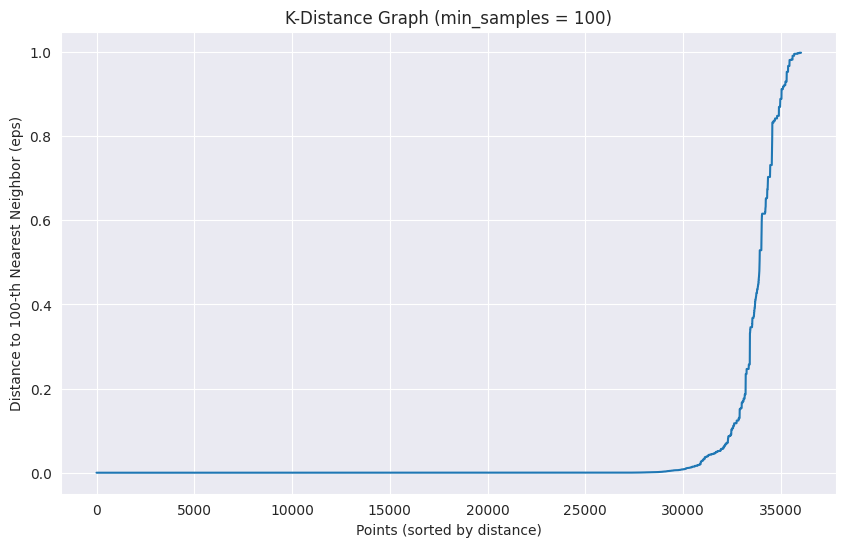

--- How to Read This Plot ---
Look for the 'knee' or 'elbow' of this graph.
It's the point where the line suddenly curves upwards sharply.
A good 'eps' value is the y-axis value right at this sharp bend.


In [15]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# This block uses 'X_reduced' from Block 12
if 'X_reduced' in locals():
    print("--- Block 15: Finding optimal 'eps' for DBSCAN ---")
    
    # 1. Define 'min_samples'.
    # A good rule of thumb for data with D dimensions is 2*D.
    # Our D = 50 (from X_reduced), so min_samples = 100
    min_samples = 100
    
    print(f"Calculating nearest neighbors with min_samples = {min_samples}...")

    # 2. Find the distance to the 'min_samples' nearest neighbor for each point
    nn = NearestNeighbors(n_neighbors=min_samples)
    nn.fit(X_reduced)
    distances, indices = nn.kneighbors(X_reduced)
    
    # 3. Get the distance to the k-th neighbor (our min_samples value)
    # We sort these distances to plot them
    # We select the last column (min_samples-1 index)
    kth_distances = np.sort(distances[:, min_samples-1])
    
    print("Calculation complete.\n")

    # 4. Plot the k-distance graph
    plt.figure(figsize=(10, 6))
    plt.plot(kth_distances)
    plt.title(f'K-Distance Graph (min_samples = {min_samples})')
    plt.xlabel('Points (sorted by distance)')
    plt.ylabel(f'Distance to {min_samples}-th Nearest Neighbor (eps)')
    plt.grid(True)
    plt.show()

    print("--- How to Read This Plot ---")
    print("Look for the 'knee' or 'elbow' of this graph.")
    print("It's the point where the line suddenly curves upwards sharply.")
    print("A good 'eps' value is the y-axis value right at this sharp bend.")

else:
    print("Matrix 'X_reduced' is not found. Please run Block 12 first.")

**Now working on epsilon = 0.2**

--- Block 16: Running DBSCAN with eps=0.2 & min_samples=100 ---
Successfully added 'hashtag_group_dbscan' column to df_analysis.

--- DBSCAN Summary ---
Total clusters found: 26
Total noise points (labeled -1): 2623

Cluster distribution (Tweets per cluster):
hashtag_group_dbscan
-1      2623
 0     22945
 1      1757
 2       303
 3       251
 4       240
 5       331
 6      2495
 7       409
 8       242
 9       888
 10      168
 11      269
 12      103
 13      102
 14      231
 15      131
 16      127
 17      826
 18      290
 19      221
 20      102
 21      420
 22      167
 23      178
 24      108
 25      108
Name: count, dtype: int64

--- Visualizing DBSCAN Clusters (2D Shadow Plot) ---


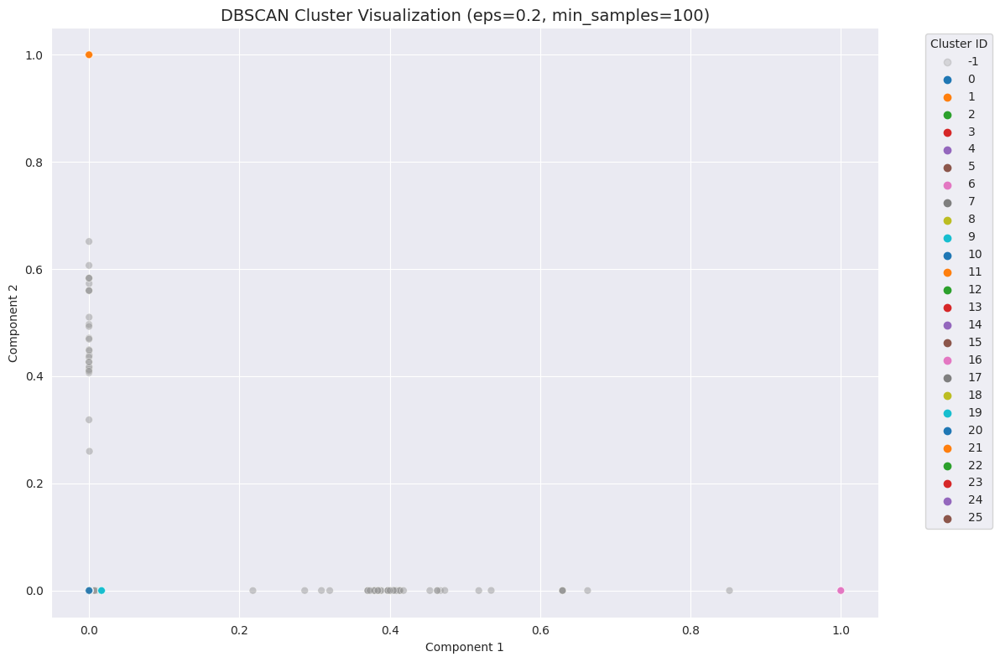


--- Top Hashtags per DBSCAN Cluster ---


/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


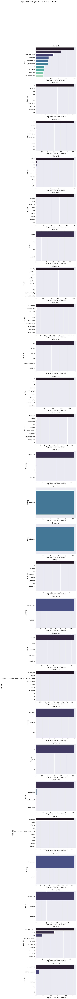

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
import pandas as pd

# This block uses 'X_reduced' and 'df_analysis'
if 'X_reduced' in locals() and 'df_analysis' in locals():
    
    # --- Part 1: Run Final Model ---
    eps_val = 0.2
    min_samples_val = 100  # heuristic: 2 * num_dimensions (50)

    print(f"--- Block 16: Running DBSCAN with eps={eps_val} & min_samples={min_samples_val} ---")

    # Fit DBSCAN
    dbscan = DBSCAN(eps=eps_val, min_samples=min_samples_val)
    dbscan.fit(X_reduced)

    # Add labels to DataFrame
    cluster_labels_dbscan = dbscan.labels_
    df_analysis['hashtag_group_dbscan'] = cluster_labels_dbscan

    print("Successfully added 'hashtag_group_dbscan' column to df_analysis.")

    # --- Part 2: Summary ---
    unique_labels = set(cluster_labels_dbscan)
    n_clusters_dbscan = len(unique_labels) - (1 if -1 in unique_labels else 0)
    n_noise_points = list(cluster_labels_dbscan).count(-1)

    print("\n--- DBSCAN Summary ---")
    print(f"Total clusters found: {n_clusters_dbscan}")
    print(f"Total noise points (labeled -1): {n_noise_points}")
    print("\nCluster distribution (Tweets per cluster):")
    print(df_analysis['hashtag_group_dbscan'].value_counts().sort_index())

    # --- Part 3: 2D Cluster Visualization (Scatter Plot) ---
    print("\n--- Visualizing DBSCAN Clusters (2D Shadow Plot) ---")

    plt.figure(figsize=(12, 8))

    # Palette: colorful clusters + gray noise
    core_labels = [label for label in unique_labels if label != -1]
    colors = sns.color_palette('tab10', n_colors=len(core_labels))
    palette = {label: color for label, color in zip(core_labels, colors)}
    palette[-1] = (0.6, 0.6, 0.6, 0.3)  # gray for noise

    sns.scatterplot(
        x=X_reduced[:, 0],
        y=X_reduced[:, 1],
        hue=cluster_labels_dbscan,
        palette=palette,
        alpha=0.5,
        s=40,
        legend='full'
    )

    plt.title(f'DBSCAN Cluster Visualization (eps={eps_val}, min_samples={min_samples_val})', fontsize=14)
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.legend(title='Cluster ID', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # --- Part 4: Top Hashtags per Cluster ---
    print("\n--- Top Hashtags per DBSCAN Cluster ---")

    cluster_labels = sorted(label for label in unique_labels if label != -1)

    fig, axes = plt.subplots(len(cluster_labels), 1, figsize=(10, 5 * len(cluster_labels)))
    fig.suptitle('Top 10 Hashtags per DBSCAN Cluster', fontsize=18, y=1.02)

    for i, cluster_id in enumerate(cluster_labels):
        cluster_df = df_analysis[df_analysis['hashtag_group_dbscan'] == cluster_id]
        all_hashtags = cluster_df['hashtags_list'].explode()
        top_10_hashtags = all_hashtags.value_counts().head(10)

        sns.barplot(
            x=top_10_hashtags.values,
            y=top_10_hashtags.index,
            ax=axes[i],
            palette='mako'
        )
        axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
        axes[i].set_xlabel('Frequency (Number of Tweets)', fontsize=12)
        axes[i].set_ylabel('Hashtag', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()

else:
    print("Matrix 'X_reduced' or 'df_analysis' not found. Please run the previous preprocessing blocks first.")


# Agglomerative clustering

--- Block 18: Running Agglomerative Clustering with n_clusters=5 ---
Agglomerative Clustering complete and results added to df_analysis.

Cluster distribution:
hashtag_group_agglo
0    30013
1      942
2     1757
3     2495
4      828
Name: count, dtype: int64

--- Visualizing Agglomerative Clusters ---


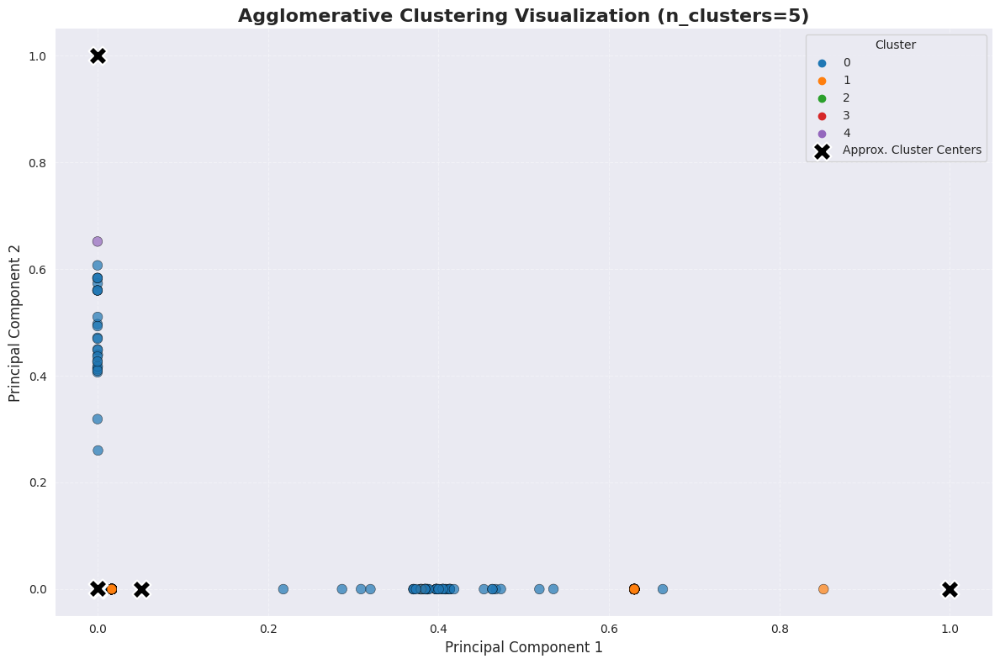

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering

# Ensure inputs exist
if 'X_reduced' in locals() and 'df_analysis' in locals():
    
    # --- Part 1: Run Final Model ---
    n_clusters_agglo = 5
    print(f"--- Block 18: Running Agglomerative Clustering with n_clusters={n_clusters_agglo} ---")
    
    agglomerative = AgglomerativeClustering(n_clusters=n_clusters_agglo, linkage='ward')
    cluster_labels_agglo = agglomerative.fit_predict(X_reduced)
    
    df_analysis['hashtag_group_agglo'] = cluster_labels_agglo
    print("Agglomerative Clustering complete and results added to df_analysis.")
    print("\nCluster distribution:")
    print(df_analysis['hashtag_group_agglo'].value_counts().sort_index())

    # --- Part 2: Visualization ---
    print("\n--- Visualizing Agglomerative Clusters ---")
    
    plt.figure(figsize=(12, 8))
    
    # Create a custom palette for visual clarity
    palette = sns.color_palette("tab10", n_clusters_agglo)
    
    # Scatter plot
    sns.scatterplot(
        x=X_reduced[:, 0],
        y=X_reduced[:, 1],
        hue=cluster_labels_agglo,
        palette=palette,
        s=70,             # slightly larger dots
        alpha=0.7,        # transparency for overlapping points
        edgecolor='k',    # thin black edge for contrast
        linewidth=0.4,
        legend='full'
    )

    # Compute and plot approximate cluster centers (mean of points)
    centers = []
    for label in range(n_clusters_agglo):
        mask = cluster_labels_agglo == label
        centers.append(X_reduced[mask].mean(axis=0))
    centers = np.array(centers)
    
    plt.scatter(
        centers[:, 0],
        centers[:, 1],
        c='black',
        s=250,
        marker='X',
        label='Approx. Cluster Centers',
        edgecolor='white',
        linewidth=1.5
    )

    plt.title(f"Agglomerative Clustering Visualization (n_clusters={n_clusters_agglo})", fontsize=16, weight='bold')
    plt.xlabel("Principal Component 1", fontsize=12)
    plt.ylabel("Principal Component 2", fontsize=12)
    plt.legend(title="Cluster", loc='best', fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.4)
    sns.despine()
    plt.tight_layout()
    plt.show()

else:
    print("Matrix 'X_reduced' or 'df_analysis' not found. Please run Block 12 first.")


# HDBSCAN

In [18]:
!pip install hdbscan

--- Block 19: Running HDBSCAN with min_cluster_size=360 ---
HDBSCAN clustering complete and results added to df_analysis.

--- HDBSCAN Summary ---
Total clusters found: 7
Total noise points found: 5252 (labeled as -1)

Cluster distribution:
hashtag_group_hdbscan
 6    23933
-1     5252
 0     2495
 1     1757
 3      942
 2      827
 5      420
 4      409
Name: count, dtype: int64

--- Visualizing HDBSCAN Clusters ---


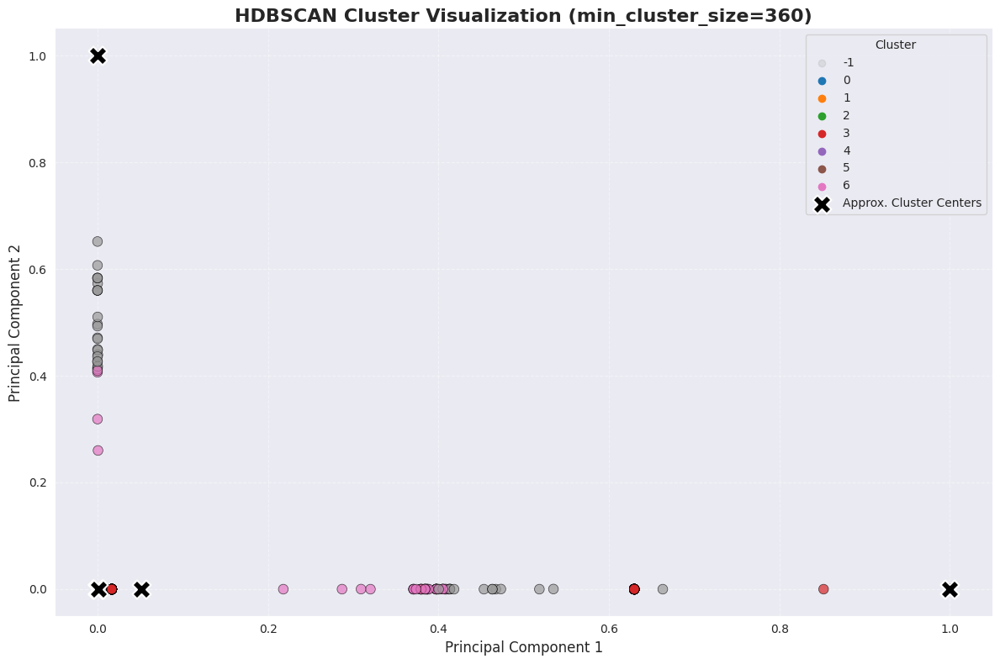

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import hdbscan  # Ensure this is installed: pip install hdbscan

# This block uses 'X_reduced' from Block 12 and 'df_analysis'
if 'X_reduced' in locals() and 'df_analysis' in locals():
    
    # --- Part 1: Run Final Model ---
    min_size = int(len(X_reduced) * 0.01)
    min_size = max(min_size, 100)  # ensure reasonable minimum
    
    print(f"--- Block 19: Running HDBSCAN with min_cluster_size={min_size} ---")
    
    hdbscan_clusterer = hdbscan.HDBSCAN(
        min_cluster_size=min_size,
        min_samples=50,
        cluster_selection_epsilon=0.0,
        metric='euclidean'
    )
    
    cluster_labels_hdbscan = hdbscan_clusterer.fit_predict(X_reduced)
    
    df_analysis['hashtag_group_hdbscan'] = cluster_labels_hdbscan
    print("HDBSCAN clustering complete and results added to df_analysis.")
    
    # --- Part 2: Cluster Summary ---
    unique_labels = set(cluster_labels_hdbscan)
    n_clusters_hdbscan = len(unique_labels) - (1 if -1 in unique_labels else 0)
    n_noise_points = np.sum(cluster_labels_hdbscan == -1)

    print("\n--- HDBSCAN Summary ---")
    print(f"Total clusters found: {n_clusters_hdbscan}")
    print(f"Total noise points found: {n_noise_points} (labeled as -1)")
    print("\nCluster distribution:")
    print(df_analysis['hashtag_group_hdbscan'].value_counts())

    # --- Part 3: Visualization ---
    print("\n--- Visualizing HDBSCAN Clusters ---")

    plt.figure(figsize=(12, 8))

    # Make a color palette that clearly separates clusters
    core_labels = [label for label in unique_labels if label != -1]
    colors = sns.color_palette("tab10", n_colors=len(core_labels))
    palette = {label: color for label, color in zip(core_labels, colors)}
    palette[-1] = (0.6, 0.6, 0.6, 0.2)  # light gray for noise

    # Create scatter plot
    sns.scatterplot(
        x=X_reduced[:, 0],
        y=X_reduced[:, 1],
        hue=cluster_labels_hdbscan,
        palette=palette,
        alpha=0.7,
        s=70,
        linewidth=0.5,
        edgecolor='k',
        legend='full'
    )

    # Add approximate cluster centers (mean of each cluster)
    centers = []
    for label in core_labels:
        mask = cluster_labels_hdbscan == label
        centers.append(X_reduced[mask].mean(axis=0))
    centers = np.array(centers)
    
    if len(centers) > 0:
        plt.scatter(
            centers[:, 0],
            centers[:, 1],
            c='black',
            s=250,
            marker='X',
            edgecolor='white',
            linewidth=1.5,
            label='Approx. Cluster Centers'
        )

    plt.title(f"HDBSCAN Cluster Visualization (min_cluster_size={min_size})", fontsize=16, weight='bold')
    plt.xlabel("Principal Component 1", fontsize=12)
    plt.ylabel("Principal Component 2", fontsize=12)
    plt.legend(title="Cluster", loc='best', fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.4)
    sns.despine()
    plt.tight_layout()
    plt.show()

else:
    print("Matrix 'X_reduced' or 'df_analysis' is not found. Please run Block 12 first.")


# BIRCH clustering

--- Block 20: Running BIRCH Clustering with n_clusters=5 ---
BIRCH model fitting complete.
Successfully added 'hashtag_group_birch' column to df_analysis.

Cluster distribution (How many posts in each group):
hashtag_group_birch
0    30234
1     3439
2      331
3     1761
4      270
Name: count, dtype: int64

--- Visualizing Top Hashtags per BIRCH Cluster ---


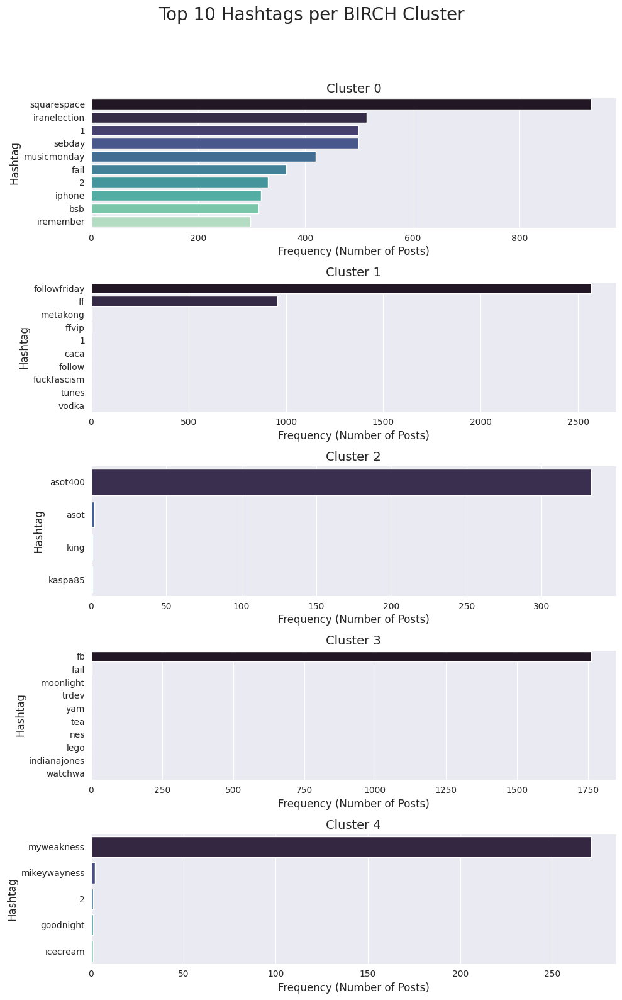

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import Birch

# This block uses 'X_reduced' and 'df_analysis'
if 'X_reduced' in locals() and 'df_analysis' in locals():
    
    # --- Part 1: Run Final Model ---
    
    n_clusters_birch = 5  # for comparison with K-Means
    print(f"--- Block 20: Running BIRCH Clustering with n_clusters={n_clusters_birch} ---")
    
    birch = Birch(n_clusters=n_clusters_birch)
    cluster_labels_birch = birch.fit_predict(X_reduced)

    print("BIRCH model fitting complete.")
    
    df_analysis['hashtag_group_birch'] = cluster_labels_birch

    print(f"Successfully added 'hashtag_group_birch' column to df_analysis.")
    print("\nCluster distribution (How many posts in each group):")
    print(df_analysis['hashtag_group_birch'].value_counts().sort_index())

    # --- Part 2: VISUALIZATION (Top Hashtags per Cluster) ---
    print("\n--- Visualizing Top Hashtags per BIRCH Cluster ---")

    cluster_labels = np.sort(df_analysis['hashtag_group_birch'].unique())

    # Create a tall figure to hold all cluster plots
    fig, axes = plt.subplots(len(cluster_labels), 1, figsize=(10, 16))
    fig.suptitle('Top 10 Hashtags per BIRCH Cluster', fontsize=20, y=1.02)

    for i, cluster_id in enumerate(cluster_labels):
        cluster_df = df_analysis[df_analysis['hashtag_group_birch'] == cluster_id]
        all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
        top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)

        sns.barplot(
            x=top_10_hashtags.values,
            y=top_10_hashtags.index,
            ax=axes[i],
            palette='mako'
        )
        axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
        axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
        axes[i].set_ylabel('Hashtag', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()

else:
    print("Matrix 'X_reduced' or 'df_analysis' is not found. Please run Block 12 first.")


## CHEKCING THE DATA FRAME NOW

In [21]:
if 'df_analysis' in locals():
    print("--- Block 20.5: Inspecting df_analysis ---")
    
    # 1. Show all columns, their types, and non-null counts
    print("\n--- DataFrame Info ---")
    print("This shows all our new columns (e.g., hashtag_group_kmeans):")
    df_analysis.info()
    
    # 2. Show the first few rows
    print("\n\n--- DataFrame Head ---")
    print("Showing the first 5 rows with all our new cluster labels:")
    
    # Select the columns we care about for this check
    columns_to_show = [
        'hashtags_list',
        'hashtag_group_kmeans',
        'hashtag_group_dbscan',
        'hashtag_group_agglo',
        'hashtag_group_hdbscan',
        'hashtag_group_birch'
    ]
    
    # Filter for columns that actually exist (in case one failed)
    existing_columns = [col for col in columns_to_show if col in df_analysis.columns]
    
    print(df_analysis[existing_columns].head())

else:
    print("DataFrame 'df_analysis' is not found. Please run your previous blocks.")

--- Block 20.5: Inspecting df_analysis ---

--- DataFrame Info ---
This shows all our new columns (e.g., hashtag_group_kmeans):
<class 'pandas.core.frame.DataFrame'>
Index: 36035 entries, 83 to 1599999
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   sentiment              36035 non-null  int64 
 1   id                     36035 non-null  int64 
 2   date                   36035 non-null  object
 3   query                  36035 non-null  object
 4   user                   36035 non-null  object
 5   text                   36035 non-null  object
 6   cleaned_text           36035 non-null  object
 7   hashtags_list          36035 non-null  object
 8   hashtag_count          36035 non-null  int64 
 9   post_length            36035 non-null  int64 
 10  hashtag_group_kmeans   36035 non-null  int32 
 11  hashtag_group_dbscan   36035 non-null  int64 
 12  hashtag_group_agglo    36035 non-null  int64 


# EVALUATION

## Internal Evaluation (Silhouette, CH, DB Metrics)

In [22]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import pandas as pd

# This block uses 'X_reduced' and 'df_analysis'
if 'X_reduced' in locals() and 'df_analysis' in locals():
    print("--- Block 21: Internal Cluster Evaluation ---")
    
    # Our list of 5 algorithm results
    cluster_columns = {
        'K-Means': 'hashtag_group_kmeans',
        'DBSCAN': 'hashtag_group_dbscan',
        'Agglomerative': 'hashtag_group_agglo',
        'HDBSCAN': 'hashtag_group_hdbscan',
        'BIRCH': 'hashtag_group_birch'
    }
    
    # A list to store our results
    internal_results_list = []

    # Loop through each algorithm's results
    for algo_name, col_name in cluster_columns.items():
        print(f"Evaluating: {algo_name}...")
        
        # Get the labels from our DataFrame
        labels = df_analysis[col_name]
        
        # --- Important: Handle Noise (-1) ---
        # These metrics cannot handle a "-1" label from DBSCAN/HDBSCAN
        # We must only score the "core" points, not the noise
        if -1 in labels.unique():
            print("  Found noise (-1). Evaluating only non-noise points.")
            # Filter both X_reduced and the labels to exclude noise
            valid_indices = labels[labels != -1].index
            
            # Need to get the original row locations from df_analysis index
            # and apply them to X_reduced (which shares the same order)
            original_indices_mask = df_analysis.index.isin(valid_indices)
            
            # Filtered data
            X_filtered = X_reduced[original_indices_mask]
            labels_filtered = labels.loc[valid_indices]
            
            # Check if we still have clusters left
            if len(labels_filtered.unique()) < 2:
                print(f"  Skipping {algo_name}: Not enough clusters after removing noise.")
                continue
        else:
            X_filtered = X_reduced
            labels_filtered = labels

        # --- Calculate the 3 Metrics ---
        # 1. Silhouette Coefficient (Higher is better)
        sil_score = silhouette_score(X_filtered, labels_filtered)
        
        # 2. Calinski-Harabasz Index (Higher is better)
        ch_score = calinski_harabasz_score(X_filtered, labels_filtered)
        
        # 3. Davies-Bouldin Index (Lower is better)
        db_score = davies_bouldin_score(X_filtered, labels_filtered)
        
        internal_results_list.append({
            'Algorithm': algo_name,
            'Silhouette Score': sil_score,
            'Calinski-Harabasz Score': ch_score,
            'Davies-Bouldin Score': db_score
        })
        
        print(f"  > Silhouette: {sil_score:.4f}")
        print(f"  > Calinski-Harabasz: {ch_score:.2f}")
        print(f"  > Davies-Bouldin: {db_score:.4f}")

    print("\n--- Internal Evaluation Complete ---")
    
    # --- Final Results Table ---
    results_internal_df = pd.DataFrame(internal_results_list)
    print("Final Internal Metrics Comparison Table:")
    print(results_internal_df.to_string())

else:
    print("Matrix 'X_reduced' or 'df_analysis' is not found. Please run previous blocks.")
    

--- Block 21: Internal Cluster Evaluation ---
Evaluating: K-Means...
  > Silhouette: 0.6954
  > Calinski-Harabasz: 7809.04
  > Davies-Bouldin: 0.3454
Evaluating: DBSCAN...
  Found noise (-1). Evaluating only non-noise points.
  > Silhouette: 0.9823
  > Calinski-Harabasz: 388664.41
  > Davies-Bouldin: 0.0745
Evaluating: Agglomerative...
  > Silhouette: 0.6947
  > Calinski-Harabasz: 7748.75
  > Davies-Bouldin: 0.2910
Evaluating: HDBSCAN...
  Found noise (-1). Evaluating only non-noise points.
  > Silhouette: 0.9337
  > Calinski-Harabasz: 40423.27
  > Davies-Bouldin: 0.0814
Evaluating: BIRCH...
  > Silhouette: 0.6409
  > Calinski-Harabasz: 4636.10
  > Davies-Bouldin: 0.6804

--- Internal Evaluation Complete ---
Final Internal Metrics Comparison Table:
       Algorithm  Silhouette Score  Calinski-Harabasz Score  Davies-Bouldin Score
0        K-Means          0.695375              7809.040316              0.345439
1         DBSCAN          0.982259            388664.409492              0.07

| Algorithm         | Silhouette | CH          | DB        | Interpretation                                                                                  |
| ----------------- | ---------- | ----------- | --------- | ----------------------------------------------------------------------------------------------- |
| **K-Means**       | 0.695      | 7809        | 0.345     | Decent clustering — moderate separation and cohesion.                                           |
| **DBSCAN**        | **0.982**  | **388,664** | **0.074** | **Outstanding performance** — clusters are extremely well-separated; very few ambiguous points. |
| **Agglomerative** | 0.695      | 7749        | 0.291     | Similar to K-Means; good but not as strong as DBSCAN.                                           |
| **HDBSCAN**       | 0.934      | 40,423      | 0.081     | Very good performance, close to DBSCAN, handles noise better.                                   |
| **BIRCH**         | 0.641      | 4636        | 0.680     | Weakest performer here — clusters less distinct or overlapping.                                 |


--- Unified Graph: All Internal Evaluation Metrics ---


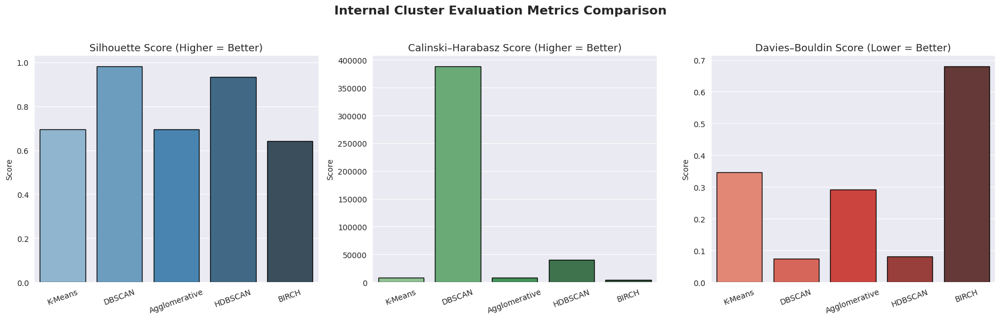

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# This block uses 'results_internal_df' from Block 21
if 'results_internal_df' in locals():
    print("--- Unified Graph: All Internal Evaluation Metrics ---")

    # Create a single row with 3 subplots (side by side)
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle('Internal Cluster Evaluation Metrics Comparison', fontsize=16, weight='bold')

    # --- Plot 1: Silhouette Score ---
    sns.barplot(
        data=results_internal_df,
        x='Algorithm',
        y='Silhouette Score',
        ax=axes[0],
        palette='Blues_d',
        edgecolor='black'
    )
    axes[0].set_title('Silhouette Score (Higher = Better)', fontsize=13)
    axes[0].set_xlabel('')
    axes[0].set_ylabel('Score')
    axes[0].tick_params(axis='x', rotation=20)

    # --- Plot 2: Calinski-Harabasz Score ---
    sns.barplot(
        data=results_internal_df,
        x='Algorithm',
        y='Calinski-Harabasz Score',
        ax=axes[1],
        palette='Greens_d',
        edgecolor='black'
    )
    axes[1].set_title('Calinski–Harabasz Score (Higher = Better)', fontsize=13)
    axes[1].set_xlabel('')
    axes[1].set_ylabel('Score')
    axes[1].tick_params(axis='x', rotation=20)

    # --- Plot 3: Davies-Bouldin Score ---
    sns.barplot(
        data=results_internal_df,
        x='Algorithm',
        y='Davies-Bouldin Score',
        ax=axes[2],
        palette='Reds_d',
        edgecolor='black'
    )
    axes[2].set_title('Davies–Bouldin Score (Lower = Better)', fontsize=13)
    axes[2].set_xlabel('')
    axes[2].set_ylabel('Score')
    axes[2].tick_params(axis='x', rotation=20)

    # Adjust layout and show
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

else:
    print("DataFrame 'results_internal_df' is not found. Please run Block 21 first.")


## Supervised evaluation

In [24]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.preprocessing import LabelBinarizer
import warnings

# This block uses 'df_analysis' from our previous work
if 'df_analysis' in locals():
    print("--- Block 22: Supervised Proxy Task (Evaluating Clusters) ---")
    
    # Suppress warnings for cleaner output
    warnings.filterwarnings('ignore')
    
    # --- Part 1: Setup ---
    
    # The 5 cluster columns you requested
    cluster_columns = [
        'hashtag_group_kmeans',
        'hashtag_group_dbscan',
        'hashtag_group_agglo',
        'hashtag_group_hdbscan',
        'hashtag_group_birch'
    ]
    
    # The classifiers we will use as "variants"
    classifiers = {
        'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
        'Random Forest': RandomForestClassifier(random_state=42, n_jobs=-1)
    }
    
    # The train/test splits you requested
    test_splits = [0.5, 0.4, 0.3, 0.2] # (for 50/50, 60/40, 70/30, 80/20)
    
    # A list to store all our results
    results_list = []

    # --- Part 2: Vectorize the Tweet Text (Our 'X') ---
    # We use the text to predict the cluster group
    print("Vectorizing tweet text ('cleaned_text') for the proxy task...")
    text_vectorizer = TfidfVectorizer(max_features=2000, stop_words='english')
    # We use .copy() on the relevant subset to be safe
    X_text_df = df_analysis['cleaned_text'].copy()
    
    # --- Part 3: The Evaluation Loop ---
    
    # Loop 1: For each of our 5 clustering algorithms...
    for col_name in cluster_columns:
        print(f"\n--- Evaluating Algorithm: {col_name} ---")
        
        y_labels_series = df_analysis[col_name].copy()
        
        # --- Data Prep for this loop ---
        # IMPORTANT: We must remove "noise" rows (label -1)
        # Classifiers cannot be trained on a label of -1
        if -1 in y_labels_series.values:
            print(f"  Found noise points (-1). Removing them for this evaluation.")
            # Get the indices of valid (non-noise) rows
            valid_indices = y_labels_series[y_labels_series != -1].index
            
            # Filter both X and y to only these valid rows
            X_eval_text = X_text_df.loc[valid_indices]
            y_eval = y_labels_series.loc[valid_indices]
        else:
            X_eval_text = X_text_df
            y_eval = y_labels_series
            
        # Check if we have more than 1 class
        if y_eval.nunique() < 2:
            print(f"  Skipping {col_name}: It has fewer than 2 clusters.")
            continue
            
        # Vectorize our text X *after* filtering
        X_eval = text_vectorizer.fit_transform(X_eval_text)
            
        # Loop 2: For each of our 4 train/test splits...
        for split_size in test_splits:
            train_size_percent = int((1 - split_size) * 100)
            test_size_percent = int(split_size * 100)
            split_name = f"{train_size_percent}/{test_size_percent}"
            print(f"  Running Split: {split_name}")
            
            # Split the data
            try:
                X_train, X_test, y_train, y_test = train_test_split(
                    X_eval, y_eval, test_size=split_size, random_state=42, stratify=y_eval
                )
            except ValueError:
                print(f"    Skipping split: Not enough samples to stratify.")
                continue
            
            # Loop 3: For each of our 2 classifiers...
            for clf_name, classifier in classifiers.items():
                
                # Fit the classifier
                classifier.fit(X_train, y_train)
                
                # Make predictions
                y_pred = classifier.predict(X_test)
                y_pred_proba = classifier.predict_proba(X_test)
                
                # --- Part 4: Calculate All 5 Metrics ---
                accuracy = accuracy_score(y_test, y_pred)
                precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
                recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
                f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)
                
                # ROC-AUC requires "binarizing" labels
                lb = LabelBinarizer()
                lb.fit(y_eval)
                y_test_bin = lb.transform(y_test)
                
                if y_test_bin.shape[1] == 1: # Binary case
                    roc_auc = roc_auc_score(y_test_bin, y_pred_proba[:, 1], average='weighted')
                else: # Multi-class case
                    roc_auc = roc_auc_score(y_test_bin, y_pred_proba, average='weighted', multi_class='ovr')
                
                # Store the results
                results_list.append({
                    'Cluster Algorithm': col_name.replace('hashtag_group_', ''),
                    'Split': split_name,
                    'Classifier': clf_name,
                    'Accuracy': accuracy,
                    'Precision': precision,
                    'Recall': recall,
                    'F1-Score': f1,
                    'ROC-AUC': roc_auc
                })

    print("\n--- Evaluation Complete ---")
    
    # --- Part 5: Final Results Table ---
    results_df = pd.DataFrame(results_list)
    
    print("Final Supervised Evaluation Table:")
    print(results_df.to_string()) # .to_string() prints the full table

else:
    print("DataFrame 'df_analysis' is not found. Please run previous blocks first.")

--- Block 22: Supervised Proxy Task (Evaluating Clusters) ---
Vectorizing tweet text ('cleaned_text') for the proxy task...

--- Evaluating Algorithm: hashtag_group_kmeans ---
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluating Algorithm: hashtag_group_dbscan ---
  Found noise points (-1). Removing them for this evaluation.
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluating Algorithm: hashtag_group_agglo ---
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluating Algorithm: hashtag_group_hdbscan ---
  Found noise points (-1). Removing them for this evaluation.
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluating Algorithm: hashtag_group_birch ---
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluation Complete ---
Fina

--- Combined Visualization: Accuracy & F1-Score ---


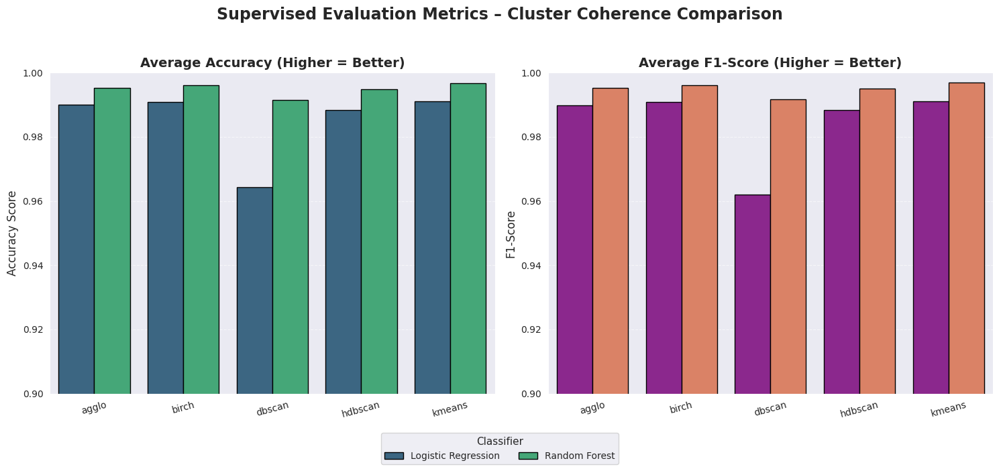

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# This block uses 'results_df' from Block 22
if 'results_df' in locals():
    print("--- Combined Visualization: Accuracy & F1-Score ---")

    # Compute average metrics across all splits for cleaner visuals
    avg_results = results_df.groupby(['Cluster Algorithm', 'Classifier'], as_index=False)[
        ['Accuracy', 'F1-Score']
    ].mean()

    # --- Create figure with two side-by-side plots ---
    fig, axes = plt.subplots(1, 2, figsize=(15, 7))
    fig.suptitle('Supervised Evaluation Metrics – Cluster Coherence Comparison', fontsize=17, weight='bold')

    # --- Plot 1: Accuracy ---
    sns.barplot(
        data=avg_results,
        x='Cluster Algorithm',
        y='Accuracy',
        hue='Classifier',
        ax=axes[0],
        palette='viridis',
        edgecolor='black'
    )
    axes[0].set_title('Average Accuracy (Higher = Better)', fontsize=14, weight='semibold')
    axes[0].set_ylim(0.9, 1.0)
    axes[0].set_xlabel('')
    axes[0].set_ylabel('Accuracy Score', fontsize=12)
    axes[0].tick_params(axis='x', rotation=15)
    axes[0].grid(axis='y', linestyle='--', alpha=0.6)

    # --- Plot 2: F1-Score ---
    sns.barplot(
        data=avg_results,
        x='Cluster Algorithm',
        y='F1-Score',
        hue='Classifier',
        ax=axes[1],
        palette='plasma',
        edgecolor='black'
    )
    axes[1].set_title('Average F1-Score (Higher = Better)', fontsize=14, weight='semibold')
    axes[1].set_ylim(0.9, 1.0)
    axes[1].set_xlabel('')
    axes[1].set_ylabel('F1-Score', fontsize=12)
    axes[1].tick_params(axis='x', rotation=15)
    axes[1].grid(axis='y', linestyle='--', alpha=0.6)

    # --- Shared Legend (visible for both) ---
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, title='Classifier', loc='lower center', ncol=2, fontsize=10, title_fontsize=11)

    # Remove legends from individual plots (to avoid duplicates)
    axes[0].get_legend().remove()
    axes[1].get_legend().remove()

    # Adjust layout so the bottom legend is visible
    plt.tight_layout(rect=[0, 0.08, 1, 0.95])
    plt.show()

else:
    print("DataFrame 'results_df' is not found. Please run Block 22 first.")


| Algorithm         | Cluster Type                      | Coherence (Interpretation)                                  |
| ----------------- | --------------------------------- | ----------------------------------------------------------- |
| **K-Means**       | Simple, round clusters            | Easy to learn by both classifiers; highly coherent.         |
| **DBSCAN**        | Irregular, density-based clusters | Very coherent but non-linear — Random Forest learns best.   |
| **Agglomerative** | Hierarchical, compact clusters    | Nearly identical to K-Means in coherence.                   |
| **HDBSCAN**       | Flexible density hierarchy        | Extremely coherent clusters, handles noise gracefully.      |
| **BIRCH**         | Tree-compressed clusters          | Strong structure, though slightly less precise than others. |


# TREND DISCOVERY

--- Unified Cluster-Level Trend Visualization for All Algorithms ---
Resampling tweets by W (weekly trends)...
Processing KMEANS...
Processing DBSCAN...
Processing AGGLO...
Processing HDBSCAN...
Processing BIRCH...


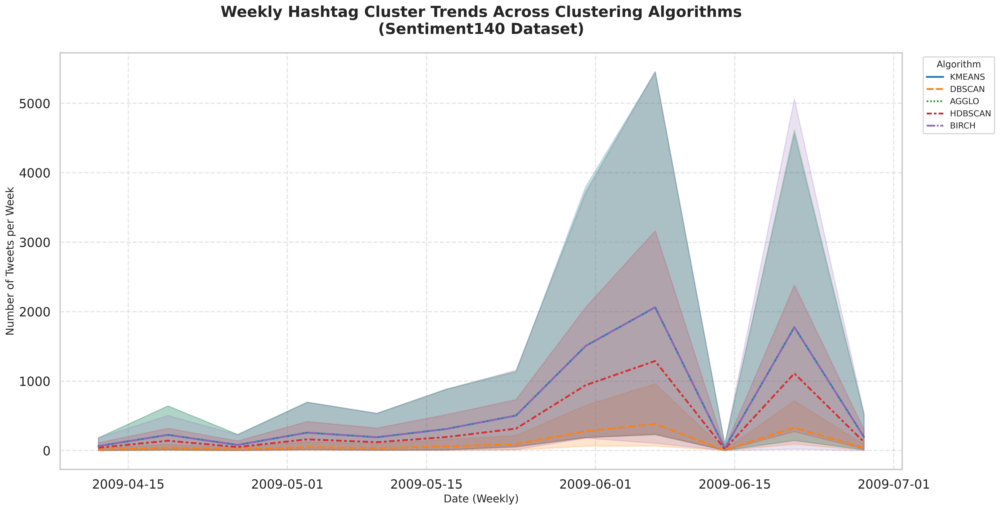

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Clean, slide-friendly theme
sns.set(style='whitegrid', context='talk')

if 'df_analysis' in locals():
    print("--- Unified Cluster-Level Trend Visualization for All Algorithms ---")

    cluster_columns = [
        'hashtag_group_kmeans',
        'hashtag_group_dbscan',
        'hashtag_group_agglo',
        'hashtag_group_hdbscan',
        'hashtag_group_birch'
    ]

    resample_period = 'W'
    print(f"Resampling tweets by {resample_period} (weekly trends)...")

    # Create a single dataframe combining all algorithms' clusters
    combined_long = []

    for col_name in cluster_columns:
        algo_name = col_name.replace('hashtag_group_', '').upper()
        print(f"Processing {algo_name}...")

        # Prepare dataset
        trend_df = df_analysis[['date', col_name]].copy()
        try:
            trend_df['date'] = pd.to_datetime(trend_df['date'], format='%a %b %d %H:%M:%S UTC %Y')
        except ValueError:
            trend_df['date'] = pd.to_datetime(trend_df['date'], infer_datetime_format=True)
        trend_df.set_index('date', inplace=True)

        # One-hot encode cluster IDs and resample weekly
        cluster_dummies = pd.get_dummies(trend_df[col_name], prefix='Cluster')
        trends = cluster_dummies.resample(resample_period).sum().reset_index()

        # Melt to long format for Seaborn plotting
        melted = trends.melt(id_vars='date', var_name='Cluster', value_name='Tweet Count')
        melted['Algorithm'] = algo_name
        combined_long.append(melted)

    # Merge all algorithm trends together
    final_df = pd.concat(combined_long, ignore_index=True)

    # Rename Noise cluster for clarity
    final_df['Cluster'] = final_df['Cluster'].replace({'Cluster_-1': 'Noise (-1)'})

    # --- Plot all algorithms and clusters on a single high-quality figure ---
    plt.figure(figsize=(22, 10), dpi=400)
    sns.lineplot(
        data=final_df,
        x='date',
        y='Tweet Count',
        hue='Algorithm',
        style='Algorithm',
        linewidth=2.5,
        alpha=0.9,
        palette='tab10'
    )

    # --- Aesthetics ---
    plt.title('Weekly Hashtag Cluster Trends Across Clustering Algorithms\n(Sentiment140 Dataset)',
              fontsize=20, weight='bold', pad=25)
    plt.xlabel('Date (Weekly)', fontsize=14)
    plt.ylabel('Number of Tweets per Week', fontsize=14)
    plt.legend(title='Algorithm', fontsize=11, title_fontsize=12, loc='upper left', bbox_to_anchor=(1.02, 1))
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout(rect=[0, 0, 0.85, 0.97])
    plt.savefig('cluster_trends_all_algorithms_high_quality.png', dpi=450, bbox_inches='tight')
    plt.show()

else:
    print("DataFrame 'df_analysis' is not found. Please re-run previous blocks.")


# DATASET 2 -> Social Media Sentiments Analysis Dataset

## Load and Inspect Data

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set a style for all our plots
sns.set_style('darkgrid')

print("--- Phase 1 (Dataset 2): Load and Inspect ---")

# --- 1. IMPORTANT ---
# This is the path after you upload the file. 
# Please check your Kaggle input panel to confirm the folder name.
filepath_ds2 = '/kaggle/input/social-media-sentiments/sentimentdataset.csv' 

# --- 2. Load the new dataset ---
try:
    df2 = pd.read_csv(
        filepath_ds2, 
        on_bad_lines='skip',
        # This dataset is large, let's sample 100k rows for speed.
        # Remove 'nrows' to run on the full dataset later.
        nrows=100000 
    )
    print(f"Dataset 2 '{filepath_ds2}' loaded successfully!")

    # --- 3. Inspect the Data ---
    print("\n--- Adequacy of Data (Shape) ---")
    print(f"Dataset shape: {df2.shape}")

    print("\n--- Data Quality (Info) ---")
    print("This shows all column names and their data types:")
    df2.info()

    print("\n--- First 5 Lines ---")
    print(df2.head())
    
except FileNotFoundError:
    print(f"ERROR: File not found at {filepath_ds2}")
    print("Please double-check the path in your Kaggle input panel and try again.")
except Exception as e:
    print(f"An error occurred while loading: {e}")

--- Phase 1 (Dataset 2): Load and Inspect ---
Dataset 2 '/kaggle/input/social-media-sentiments/sentimentdataset.csv' loaded successfully!

--- Adequacy of Data (Shape) ---
Dataset shape: (732, 15)

--- Data Quality (Info) ---
This shows all column names and their data types:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 732 entries, 0 to 731
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0.1  732 non-null    int64  
 1   Unnamed: 0    732 non-null    int64  
 2   Text          732 non-null    object 
 3   Sentiment     732 non-null    object 
 4   Timestamp     732 non-null    object 
 5   User          732 non-null    object 
 6   Platform      732 non-null    object 
 7   Hashtags      732 non-null    object 
 8   Retweets      732 non-null    float64
 9   Likes         732 non-null    float64
 10  Country       732 non-null    object 
 11  Year          732 non-null    int64  
 12  Month       

## Clean and Prepare Data

In [28]:
import pandas as pd
import numpy as np

# This block uses 'df2' from Block 1
if 'df2' in locals():
    print("--- Block 2 (Dataset 2): Cleaning and Preparing Data ---")
    
    # 1. Filter for 'Instagram' platform (Corrected for case-sensitivity)
    # We use .copy() to avoid a pandas warning
    df_analysis_ds2 = df2[df2['Platform'] == 'Instagram'].copy()
    
    if df_analysis_ds2.empty:
        print("Warning: No rows found for 'Instagram'. Using the full dataset.")
        # If it still fails, we'll just use the whole dataset
        df_analysis_ds2 = df2.copy()
    else:
        print(f"Filtered for 'Instagram'. We have {len(df_analysis_ds2)} posts.")

    # 2. Convert 'Timestamp' to datetime objects
    try:
        df_analysis_ds2['date'] = pd.to_datetime(df_analysis_ds2['Timestamp'])
        print("Successfully converted 'Timestamp' to 'date'.")
    except Exception as e:
        print(f"Could not convert Timestamp: {e}")
        
    # 3. Define a function to clean and split the 'Hashtags' string
    def clean_hashtag_string(tag_string):
        if not isinstance(tag_string, str):
            return [] # Return an empty list if data is missing (NaN)
        
        # Remove '#', convert to lowercase, and split by spaces
        tags = tag_string.replace('#', '').lower().split()
        return tags

    # 4. Create the new 'hashtags_list' column
    df_analysis_ds2['hashtags_list'] = df_analysis_ds2['Hashtags'].apply(clean_hashtag_string)
    
    # 5. Create the 'hashtag_count' column
    df_analysis_ds2['hashtag_count'] = df_analysis_ds2['hashtags_list'].apply(len)
    
    # --- 6. Inspect our new DataFrame ---
    print("\n--- New DataFrame Info ---")
    df_analysis_ds2.info()
    
    print("\n--- New DataFrame Head ---")
    # Show the columns we just created
    print(df_analysis_ds2[['Platform', 'date', 'Hashtags', 'hashtags_list', 'hashtag_count']].head())

else:
    print("DataFrame 'df2' is not found. Please run Block 1 first.")

--- Block 2 (Dataset 2): Cleaning and Preparing Data ---
Successfully converted 'Timestamp' to 'date'.

--- New DataFrame Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 732 entries, 0 to 731
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Unnamed: 0.1   732 non-null    int64         
 1   Unnamed: 0     732 non-null    int64         
 2   Text           732 non-null    object        
 3   Sentiment      732 non-null    object        
 4   Timestamp      732 non-null    object        
 5   User           732 non-null    object        
 6   Platform       732 non-null    object        
 7   Hashtags       732 non-null    object        
 8   Retweets       732 non-null    float64       
 9   Likes          732 non-null    float64       
 10  Country        732 non-null    object        
 11  Year           732 non-null    int64         
 12  Month          732 non-null    int64         

## Descriptive statistics

--- Block 3 (Dataset 2): Descriptive Statistics, Imbalance & Outlier Analysis ---

--- Descriptive Statistics ---
       hashtag_count       Likes    Retweets
count          732.0  732.000000  732.000000
mean             2.0   42.901639   21.508197
std              0.0   14.089848    7.061286
min              2.0   10.000000    5.000000
25%              2.0   34.750000   17.750000
50%              2.0   43.000000   22.000000
75%              2.0   50.000000   25.000000
max              2.0   80.000000   40.000000

--- Distribution & Imbalance Visualization ---


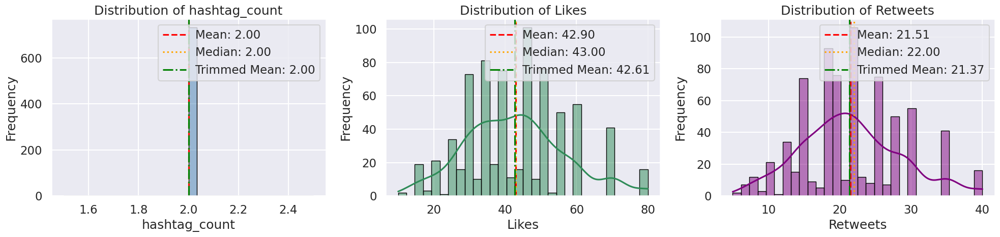


--- Outlier Visualization ---


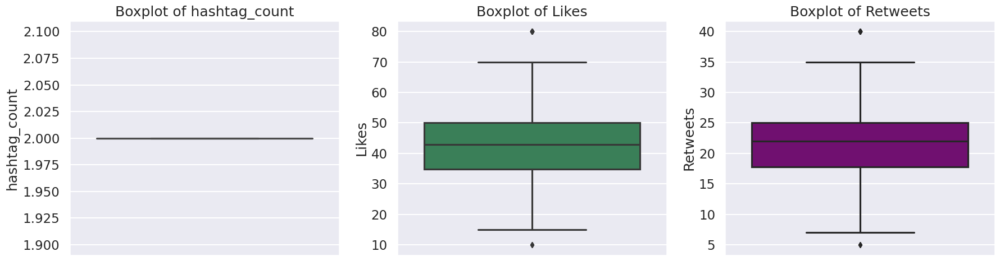


--- Trimmed Statistics (10%) ---
hashtag_count:
   Original Mean = 2.00, Trimmed Mean = 2.00
   Original Std  = 0.00, Trimmed Std = 0.00

Likes:
   Original Mean = 42.90, Trimmed Mean = 42.61
   Original Std  = 14.09, Trimmed Std = 12.29

Retweets:
   Original Mean = 21.51, Trimmed Mean = 21.37
   Original Std  = 7.06, Trimmed Std = 6.17


--- Imbalance Analysis ---
               Imbalance Ratio (max/median)  Variability Ratio (std/mean)  \
hashtag_count                         1.000                         0.000   
Likes                                 1.860                         0.328   
Retweets                              1.818                         0.328   

               Skewness  
hashtag_count     0.000  
Likes             0.378  
Retweets          0.363  

--- Automated Observations ---

➡ hashtag_count:
   ✅ Relatively balanced distribution.
   ✅ Variability within reasonable limits.
   ✅ Approximately symmetric distribution.

➡ Likes:
   ✅ Relatively balanced distrib

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# --- Enhanced Descriptive + Imbalance & Outlier Analysis ---
if 'df_analysis_ds2' in locals():
    print("--- Block 3 (Dataset 2): Descriptive Statistics, Imbalance & Outlier Analysis ---")

    # ========== 1. Descriptive Statistics ==========
    print("\n--- Descriptive Statistics ---")
    stats_df = df_analysis_ds2[['hashtag_count', 'Likes', 'Retweets']]
    print(stats_df.describe())

    # ========== 2. Distribution + Imbalance Visualization ==========
    print("\n--- Distribution & Imbalance Visualization ---")
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))
    numeric_cols = ['hashtag_count', 'Likes', 'Retweets']
    colors = ['steelblue', 'seagreen', 'purple']

    for i, col in enumerate(numeric_cols):
        data = df_analysis_ds2[col].dropna()
        sns.histplot(data, bins=30, kde=True, ax=axes[i], color=colors[i], edgecolor='black')
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

        # Add mean, median, and trimmed mean lines
        mean_val = data.mean()
        median_val = data.median()
        trimmed_mean_val = stats.trim_mean(data, 0.05)

        axes[i].axvline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.2f}')
        axes[i].axvline(median_val, color='orange', linestyle=':', label=f'Median: {median_val:.2f}')
        axes[i].axvline(trimmed_mean_val, color='green', linestyle='-.', label=f'Trimmed Mean: {trimmed_mean_val:.2f}')
        axes[i].legend()

    plt.tight_layout()
    plt.show()

    # ========== 3. Outlier Visualization (Boxplots) ==========
    print("\n--- Outlier Visualization ---")
    plt.figure(figsize=(18, 5))

    for i, col in enumerate(numeric_cols):
        plt.subplot(1, 3, i+1)
        sns.boxplot(y=df_analysis_ds2[col], color=colors[i])
        plt.title(f'Boxplot of {col}')

    plt.tight_layout()
    plt.show()

    # ========== 4. Trimmed Statistics ==========
    print("\n--- Trimmed Statistics (10%) ---")
    trim_fraction = 0.05

    for col in numeric_cols:
        data = df_analysis_ds2[col].dropna()
        trimmed_mean = stats.trim_mean(data, trim_fraction)
        # Calculate trimmed standard deviation
        lower, upper = np.percentile(data, [trim_fraction*100, 100 - trim_fraction*100])
        trimmed_data = data[(data >= lower) & (data <= upper)]
        trimmed_std = trimmed_data.std()

        print(f"{col}:")
        print(f"   Original Mean = {data.mean():.2f}, Trimmed Mean = {trimmed_mean:.2f}")
        print(f"   Original Std  = {data.std():.2f}, Trimmed Std = {trimmed_std:.2f}\n")

    # ========== 5. Imbalance Metrics ==========
    print("\n--- Imbalance Analysis ---")
    imbalance_report = {}
    for col in numeric_cols:
        data = df_analysis_ds2[col].dropna()
        imbalance_ratio = data.max() / data.median() if data.median() != 0 else np.nan
        variability_ratio = data.std() / data.mean() if data.mean() != 0 else np.nan
        skewness = data.skew()
        imbalance_report[col] = {
            'Imbalance Ratio (max/median)': imbalance_ratio,
            'Variability Ratio (std/mean)': variability_ratio,
            'Skewness': skewness
        }

    imbalance_df = pd.DataFrame(imbalance_report).T
    print(imbalance_df.round(3))

    # ========== 6. Automated Observations ==========
    print("\n--- Automated Observations ---")
    for col in numeric_cols:
        row = imbalance_df.loc[col]
        print(f"\n➡ {col}:")
        if row['Imbalance Ratio (max/median)'] > 10:
            print("   ⚠️ Strong imbalance — some values dominate this variable.")
        elif row['Imbalance Ratio (max/median)'] > 5:
            print("   ℹ️ Moderate imbalance detected.")
        else:
            print("   ✅ Relatively balanced distribution.")

        if row['Variability Ratio (std/mean)'] > 1:
            print("   ⚠️ High variability — data is spread out widely.")
        else:
            print("   ✅ Variability within reasonable limits.")

        if abs(row['Skewness']) > 1:
            print(f"   ⚠️ Strong {'right' if row['Skewness'] > 0 else 'left'} skew — distribution is not symmetric.")
        elif abs(row['Skewness']) > 0.5:
            print(f"   ℹ️ Mild {'right' if row['Skewness'] > 0 else 'left'} skew present.")
        else:
            print("   ✅ Approximately symmetric distribution.")

else:
    print("DataFrame 'df_analysis_ds2' is not found. Please run Block 2 first.")


## Dimensionality Reduction

In [30]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD

# This block uses 'df_analysis_ds2' from Block 2
if 'df_analysis_ds2' in locals():
    print("--- Block 4 (Dataset 2): TF-IDF & SVD ---")
    
    # --- 1. TF-IDF Vectorization ---
    
    # First, filter out rows with no hashtags, as they can't be clustered
    df_cluster_ds2 = df_analysis_ds2[df_analysis_ds2['hashtag_count'] > 0].copy()
    print(f"Filtered for rows with hashtags. We have {len(df_cluster_ds2)} posts to cluster.")
    
    # Join the list of hashtags into a single space-separated string
    # e.g., ['fitness', 'workout'] becomes "fitness workout"
    df_cluster_ds2['hashtags_str'] = df_cluster_ds2['hashtags_list'].apply(lambda x: ' '.join(x))

    # Initialize the TF-IDF Vectorizer
    # min_df=2 ignores hashtags that only appear once (noise)
    tfidf_vectorizer_ds2 = TfidfVectorizer(max_features=500, min_df=2)

    print("Vectorizing hashtags with TF-IDF...")
    # This creates our numerical matrix X_tfidf_ds2
    X_tfidf_ds2 = tfidf_vectorizer_ds2.fit_transform(df_cluster_ds2['hashtags_str'])
    
    print(f"TF-IDF matrix shape: {X_tfidf_ds2.shape}")

    # --- 2. Dimensionality Reduction (SVD) ---
    
    # We reduce dimensions to a manageable number.
    # Since we have fewer features (500), we'll reduce to 30.
    # We must ensure n_components is less than the number of features.
    n_components = min(30, X_tfidf_ds2.shape[1] - 1)
    
    # Initialize TruncatedSVD (the "PCA" for text)
    svd_ds2 = TruncatedSVD(n_components=n_components, random_state=42)

    print(f"Reducing dimensions to {n_components} components...")
    # This is our NEW, primary data for all clustering
    X_reduced_ds2 = svd_ds2.fit_transform(X_tfidf_ds2)

    print("Reduction complete!")
    print(f"New reduced matrix shape: {X_reduced_ds2.shape}")

else:
    print("DataFrame 'df_analysis_ds2' is not found. Please run Block 2 first.")

--- Block 4 (Dataset 2): TF-IDF & SVD ---
Filtered for rows with hashtags. We have 732 posts to cluster.
Vectorizing hashtags with TF-IDF...
TF-IDF matrix shape: (732, 202)
Reducing dimensions to 30 components...
Reduction complete!
New reduced matrix shape: (732, 30)


## K means

--- Block 5 (Dataset 2): K-Means++ Elbow Method ---
Calculating inertia for k=2 to k=15 to find the new elbow...
Completed for k=2
Completed for k=3
Completed for k=4
Completed for k=5
Completed for k=6
Completed for k=7
Completed for k=8
Completed for k=9
Completed for k=10
Completed for k=11
Completed for k=12
Completed for k=13
Completed for k=14
Completed for k=15
Calculation complete.



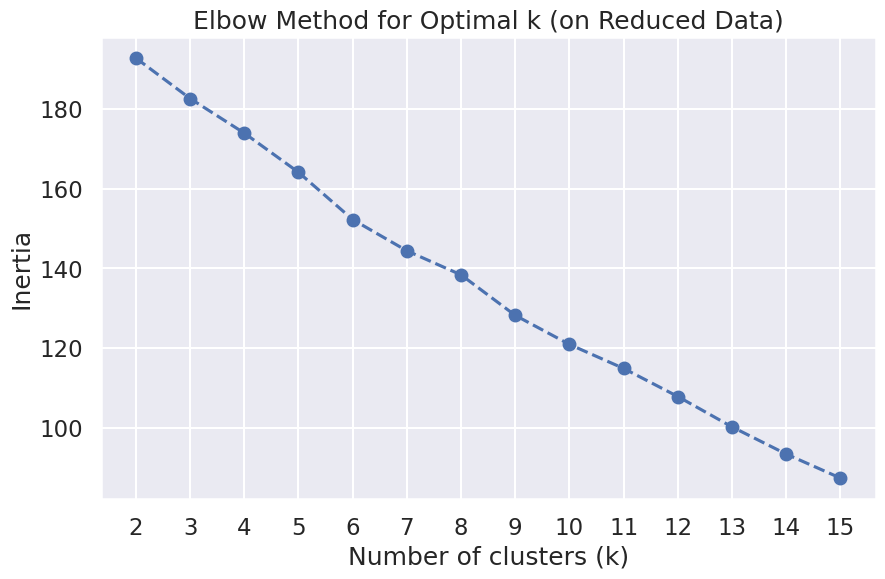

In [31]:
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# This block uses 'X_reduced_ds2' from Block 4
if 'X_reduced_ds2' in locals():
    print("--- Block 5 (Dataset 2): K-Means++ Elbow Method ---")
    
    # --- Part 1: Find the Elbow ---
    print("Calculating inertia for k=2 to k=15 to find the new elbow...")
    inertia_list = []
    
    # We test k from 2 to 15
    k_range = range(2, 16) 

    for k in k_range:
        # 'k-means++' is the default 'init' method
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        
        # We fit on our new 30-column matrix
        kmeans.fit(X_reduced_ds2)
        
        inertia_list.append(kmeans.inertia_)
        print(f"Completed for k={k}")

    print("Calculation complete.\n")

    # --- Part 2: Plot the Elbow Method Graph ---
    plt.figure(figsize=(10, 6))
    plt.plot(k_range, inertia_list, marker='o', linestyle='--')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for Optimal k (on Reduced Data)')
    plt.xticks(k_range)
    plt.grid(True)
    plt.show()

else:
    print("Matrix 'X_reduced_ds2' is not found. Please run Block 4 first.")

--- Block 6 (Dataset 2): Running final K-Means model with k=8 ---
Successfully added 'hashtag_group_kmeans' column to df_cluster_ds2.

Cluster distribution (How many posts in each group):
hashtag_group_kmeans
0    655
1     13
2     15
3      9
4      8
5     11
6     11
7     10
Name: count, dtype: int64

--- Visualizing K-Means Cluster Topics (Top Hashtags) ---


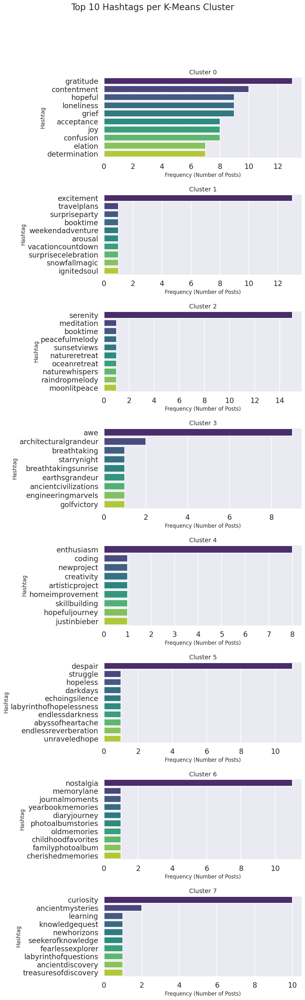

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# This block uses 'X_reduced_ds2' and 'df_cluster_ds2' from Block 4
if 'X_reduced_ds2' in locals() and 'df_cluster_ds2' in locals():
    
    # --- Part 1: Run Final Model ---
    
    # We are using the k=8 you selected
    optimal_k = 8

    print(f"--- Block 6 (Dataset 2): Running final K-Means model with k={optimal_k} ---")
    
    # 1. Initialize and fit the final model
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    kmeans.fit(X_reduced_ds2)

    # 2. Get the cluster labels and add them to our DataFrame
    cluster_labels_kmeans = kmeans.labels_
    # We add the new labels to our DataFrame from Block 4
    df_cluster_ds2['hashtag_group_kmeans'] = cluster_labels_kmeans

    print(f"Successfully added 'hashtag_group_kmeans' column to df_cluster_ds2.")
    print("\nCluster distribution (How many posts in each group):")
    print(df_cluster_ds2['hashtag_group_kmeans'].value_counts().sort_index())

    # --- Part 2: VISUALIZATION (The "Good Depiction") ---
    print("\n--- Visualizing K-Means Cluster Topics (Top Hashtags) ---")
    
    cluster_labels = np.sort(df_cluster_ds2['hashtag_group_kmeans'].unique())

    # Create a tall figure to hold all 8 plots
    fig, axes = plt.subplots(len(cluster_labels), 1, figsize=(10, 32)) # 8 plots, so we need a tall figure
    fig.suptitle('Top 10 Hashtags per K-Means Cluster', fontsize=20, y=1.02)

    for i, cluster_id in enumerate(cluster_labels):
        
        # 1. Filter our DataFrame to *only* posts in this cluster
        cluster_df = df_cluster_ds2[df_cluster_ds2['hashtag_group_kmeans'] == cluster_id]
        
        # 2. Flatten the list of hashtags
        all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
        
        # 3. Get the Top 10 most common hashtags
        top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)
        
        # 4. Create a bar plot for this cluster
        sns.barplot(
            x=top_10_hashtags.values, 
            y=top_10_hashtags.index, 
            ax=axes[i], 
            palette='viridis'
        )
        axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
        axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
        axes[i].set_ylabel('Hashtag', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()

else:
    print("Matrix 'X_reduced_ds2' or 'df_cluster_ds2' is not found. Please run Block 4 first.")

## DBSCAN

--- Block 7 (Dataset 2): Finding optimal 'eps' for DBSCAN ---
Calculating nearest neighbors with min_samples = 60...
Calculation complete.



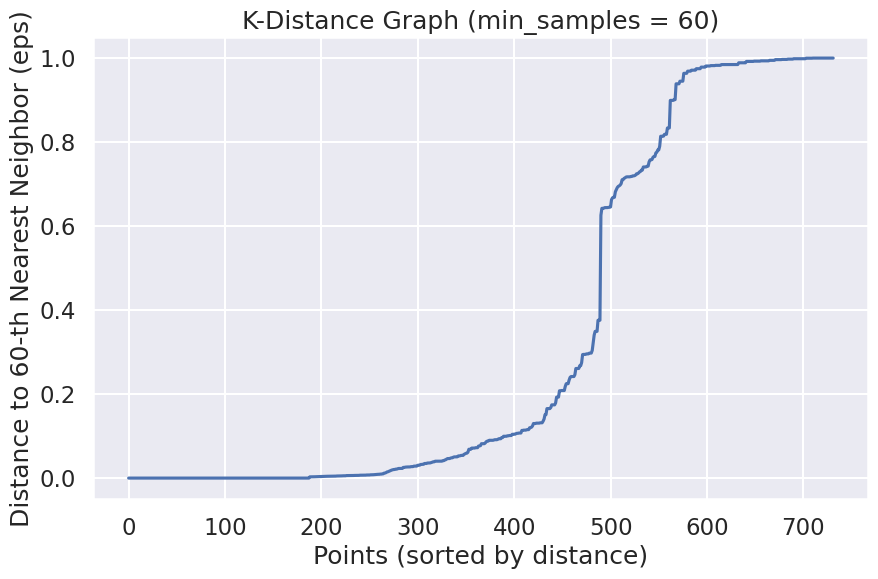

--- How to Read This Plot ---
Look for the 'knee' or 'elbow' of this graph.
It's the point where the line suddenly curves upwards sharply.
A good 'eps' value is the y-axis value right at this sharp bend.


In [33]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# This block uses 'X_reduced_ds2' from Block 4
if 'X_reduced_ds2' in locals():
    print("--- Block 7 (Dataset 2): Finding optimal 'eps' for DBSCAN ---")
    
    # 1. Define 'min_samples'.
    # Our D = 30 (from X_reduced_ds2), so 2*D = 60
    # This is a good, robust choice.
    min_samples = 60
    
    print(f"Calculating nearest neighbors with min_samples = {min_samples}...")

    # 2. Find the distance to the 'min_samples' nearest neighbor for each point
    nn = NearestNeighbors(n_neighbors=min_samples)
    nn.fit(X_reduced_ds2)
    distances, indices = nn.kneighbors(X_reduced_ds2)
    
    # 3. Get the distance to the k-th neighbor (our min_samples value)
    # We sort these distances to plot them
    kth_distances = np.sort(distances[:, min_samples-1])
    
    print("Calculation complete.\n")

    # 4. Plot the k-distance graph
    plt.figure(figsize=(10, 6))
    plt.plot(kth_distances)
    plt.title(f'K-Distance Graph (min_samples = {min_samples})')
    plt.xlabel('Points (sorted by distance)')
    plt.ylabel(f'Distance to {min_samples}-th Nearest Neighbor (eps)')
    plt.grid(True)
    plt.show()

    print("--- How to Read This Plot ---")
    print("Look for the 'knee' or 'elbow' of this graph.")
    print("It's the point where the line suddenly curves upwards sharply.")
    print("A good 'eps' value is the y-axis value right at this sharp bend.")

else:
    print("Matrix 'X_reduced_ds2' is not found. Please run Block 4 first.")

**taking epsilon = 0.2**

--- Block 8 (v2): Running DBSCAN with eps=0.2 & min_samples=60 ---
Successfully added 'hashtag_group_dbscan' column to df_cluster_ds2.

--- DBSCAN Summary ---
Total clusters found: 1
Total noise points found: 262 (labeled as -1)

Cluster distribution (How many posts in each group):
hashtag_group_dbscan
 0    470
-1    262
Name: count, dtype: int64

--- Visualizing DBSCAN Cluster Topics (Top Hashtags) ---


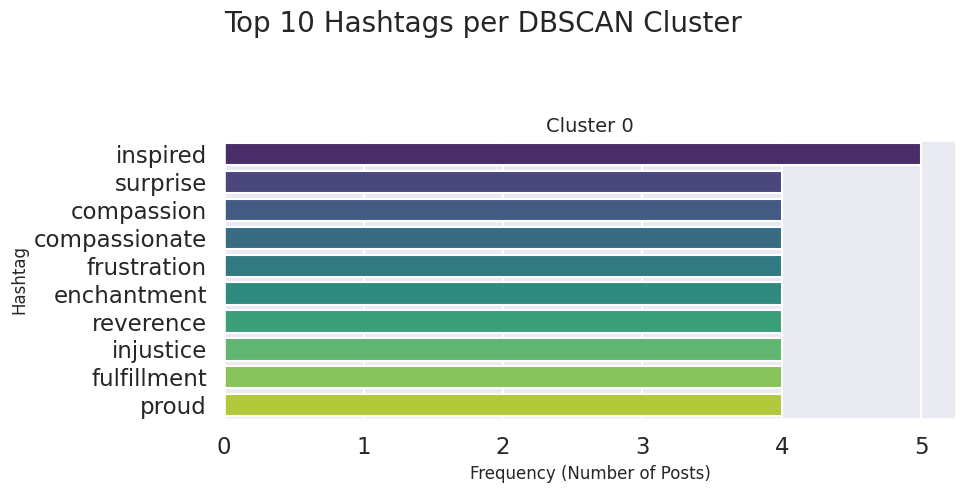

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
import pandas as pd

# This block uses 'X_reduced_ds2' and 'df_cluster_ds2'
if 'X_reduced_ds2' in locals() and 'df_cluster_ds2' in locals():
    
    # --- Part 1: Run Final Model ---
    
    # We are using our new, smaller eps value based on your graph
    eps_val = 0.2
    min_samples_val = 60 # From Block 7

    print(f"--- Block 8 (v2): Running DBSCAN with eps={eps_val} & min_samples={min_samples_val} ---")
    
    # 1. Initialize and fit the final model
    dbscan = DBSCAN(eps=eps_val, min_samples=min_samples_val)
    
    # Fit the model to our 30-column reduced data
    cluster_labels_dbscan = dbscan.fit_predict(X_reduced_ds2)

    # 2. Get the cluster labels and add them to our main DataFrame
    df_cluster_ds2['hashtag_group_dbscan'] = cluster_labels_dbscan

    print(f"Successfully added 'hashtag_group_dbscan' column to df_cluster_ds2.")
    
    # --- Part 2: Cluster Summary ---
    unique_labels = set(cluster_labels_dbscan)
    n_clusters_dbscan = len(unique_labels) - (1 if -1 in unique_labels else 0)
    n_noise_points = list(cluster_labels_dbscan).count(-1)

    print("\n--- DBSCAN Summary ---")
    print(f"Total clusters found: {n_clusters_dbscan}")
    print(f"Total noise points found: {n_noise_points} (labeled as -1)")
    print("\nCluster distribution (How many posts in each group):")
    print(df_cluster_ds2['hashtag_group_dbscan'].value_counts())

    # --- Part 3: VISUALIZATION (The "Good Depiction") ---
    print("\n--- Visualizing DBSCAN Cluster Topics (Top Hashtags) ---")
    
    # Get all unique cluster labels, but ignore the -1 (noise) label
    cluster_ids_to_plot = [label for label in unique_labels if label != -1]
    cluster_ids_to_plot.sort()
    
    if not cluster_ids_to_plot:
        print("DBSCAN found 0 clusters (only noise). No topic plots to generate.")
    else:
        # Create a figure to hold all plots
        fig, axes = plt.subplots(len(cluster_ids_to_plot), 1, 
                                 figsize=(10, 5 * len(cluster_ids_to_plot)))
        fig.suptitle('Top 10 Hashtags per DBSCAN Cluster', fontsize=20, y=1.03)
        
        # Handle case if it only finds 1 cluster
        if len(cluster_ids_to_plot) == 1:
            axes = [axes] 

        for i, cluster_id in enumerate(cluster_ids_to_plot):
            
            cluster_df = df_cluster_ds2[df_cluster_ds2['hashtag_group_dbscan'] == cluster_id]
            all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
            top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)
            
            sns.barplot(
                x=top_10_hashtags.values, 
                y=top_10_hashtags.index, 
                ax=axes[i], 
                palette='viridis'
            )
            axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
            axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
            axes[i].set_ylabel('Hashtag', fontsize=12)

        plt.tight_layout(rect=[0, 0.03, 1, 0.98])
        plt.show()

else:
    print("Matrix 'X_reduced_ds2' or 'df_cluster_ds2' is not found. Please run Block 4 first.")

## Agglomerative Clustering

--- Block 9 (Dataset 2): Running Agglomerative Clustering with n_clusters=8 ---
Agglomerative Clustering model fitting complete.
Successfully added 'hashtag_group_agglo' column to df_cluster_ds2.

Cluster distribution (How many posts in each group):
hashtag_group_agglo
0    650
1     13
2     13
3      9
4     15
5     11
6     10
7     11
Name: count, dtype: int64

--- Visualizing Agglomerative Cluster Topics (Top Hashtags) ---


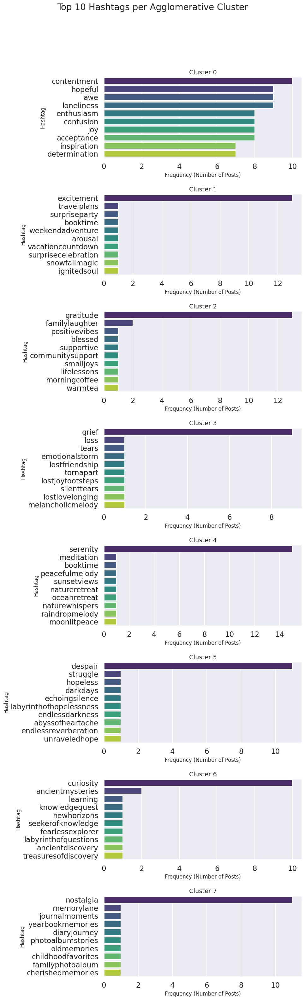

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
import pandas as pd

# This block uses 'X_reduced_ds2' and 'df_cluster_ds2'
if 'X_reduced_ds2' in locals() and 'df_cluster_ds2' in locals():
    
    # --- Part 1: Run Final Model ---
    
    # We are using k=8 (the same as K-Means) for a fair comparison
    n_clusters_agglo = 8

    print(f"--- Block 9 (Dataset 2): Running Agglomerative Clustering with n_clusters={n_clusters_agglo} ---")
    
    # 1. Initialize and fit the final model
    # 'ward' linkage is a good default that minimizes variance
    agglomerative = AgglomerativeClustering(n_clusters=n_clusters_agglo, linkage='ward')
    
    # We use 'fit_predict' which fits and returns the labels
    cluster_labels_agglo = agglomerative.fit_predict(X_reduced_ds2)

    print("Agglomerative Clustering model fitting complete.")

    # 2. Get the cluster labels and add them to our main DataFrame
    df_cluster_ds2['hashtag_group_agglo'] = cluster_labels_agglo

    print(f"Successfully added 'hashtag_group_agglo' column to df_cluster_ds2.")
    print("\nCluster distribution (How many posts in each group):")
    print(df_cluster_ds2['hashtag_group_agglo'].value_counts().sort_index())

    # --- Part 2: VISUALIZATION (The "Good Depiction") ---
    print("\n--- Visualizing Agglomerative Cluster Topics (Top Hashtags) ---")
    
    cluster_labels = np.sort(df_cluster_ds2['hashtag_group_agglo'].unique())

    # Create a tall figure to hold all 8 plots
    fig, axes = plt.subplots(len(cluster_labels), 1, figsize=(10, 32)) # 8 plots
    fig.suptitle('Top 10 Hashtags per Agglomerative Cluster', fontsize=20, y=1.02)

    for i, cluster_id in enumerate(cluster_labels):
        
        # 1. Filter for this cluster
        cluster_df = df_cluster_ds2[df_cluster_ds2['hashtag_group_agglo'] == cluster_id]
        
        # 2. Flatten the list of hashtags
        all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
        
        # 3. Get the Top 10 most common hashtags
        top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)
        
        # 4. Create a bar plot for this cluster
        sns.barplot(
            x=top_10_hashtags.values, 
            y=top_10_hashtags.index, 
            ax=axes[i], 
            palette='viridis'
        )
        axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
        axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
        axes[i].set_ylabel('Hashtag', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()

else:
    print("Matrix 'X_reduced_ds2' or 'df_cluster_ds2' is not found. Please run Block 4 first.")

## HDBSCAN

--- Block 10 (Dataset 2): Running HDBSCAN with min_cluster_size=15 ---
HDBSCAN model fitting complete.
Successfully added 'hashtag_group_hdbscan' column to df_cluster_ds2.

--- HDBSCAN Summary ---
Total clusters found: 2
Total noise points found: 148 (labeled as -1)

Cluster distribution (How many posts in each group):
hashtag_group_hdbscan
 1    569
-1    148
 0     15
Name: count, dtype: int64

--- Visualizing HDBSCAN Cluster Topics (Top Hashtags) ---


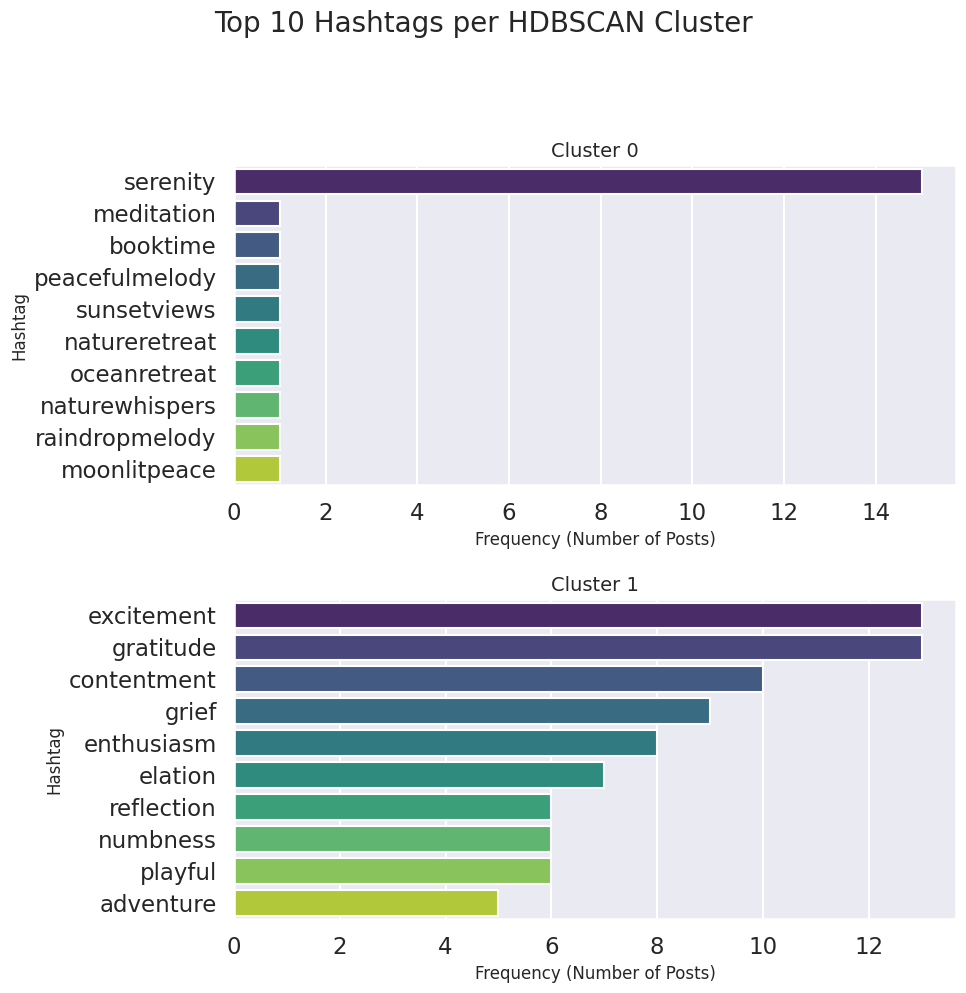

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import hdbscan  # Make sure you have run "!pip install hdbscan" first
import pandas as pd

# This block uses 'X_reduced_ds2' and 'df_cluster_ds2'
if 'X_reduced_ds2' in locals() and 'df_cluster_ds2' in locals():
    
    # --- Part 1: Run Final Model ---
    
    # We just need to give it a 'min_cluster_size'.
    # Since our dataset is small, let's set a small value.
    min_size = 15
        
    print(f"--- Block 10 (Dataset 2): Running HDBSCAN with min_cluster_size={min_size} ---")
    
    # 1. Initialize and fit the final model
    hdbscan_clusterer = hdbscan.HDBSCAN(
        min_cluster_size=min_size,
        min_samples=5 # A small value to find smaller groups
    )
    
    # We use 'fit_predict' which fits and returns the labels
    cluster_labels_hdbscan = hdbscan_clusterer.fit_predict(X_reduced_ds2)

    print("HDBSCAN model fitting complete.")

    # 2. Get the cluster labels and add them to our main DataFrame
    df_cluster_ds2['hashtag_group_hdbscan'] = cluster_labels_hdbscan

    print(f"Successfully added 'hashtag_group_hdbscan' column to df_cluster_ds2.")
    
    # --- Part 2: Cluster Summary ---
    unique_labels = set(cluster_labels_hdbscan)
    n_clusters_hdbscan = len(unique_labels) - (1 if -1 in unique_labels else 0)
    n_noise_points = list(cluster_labels_hdbscan).count(-1)

    print("\n--- HDBSCAN Summary ---")
    print(f"Total clusters found: {n_clusters_hdbscan}")
    print(f"Total noise points found: {n_noise_points} (labeled as -1)")
    print("\nCluster distribution (How many posts in each group):")
    print(df_cluster_ds2['hashtag_group_hdbscan'].value_counts())

    # --- Part 3: VISUALIZATION (The "Good Depiction") ---
    print("\n--- Visualizing HDBSCAN Cluster Topics (Top Hashtags) ---")
    
    # Get all unique cluster labels, but ignore the -1 (noise) label
    cluster_ids_to_plot = [label for label in unique_labels if label != -1]
    cluster_ids_to_plot.sort()
    
    if not cluster_ids_to_plot:
        print("HDBSCAN found 0 clusters (only noise). No topic plots to generate.")
    else:
        # Create a figure to hold all plots
        fig, axes = plt.subplots(len(cluster_ids_to_plot), 1, 
                                 figsize=(10, 5 * len(cluster_ids_to_plot)))
        fig.suptitle('Top 10 Hashtags per HDBSCAN Cluster', fontsize=20, y=1.03)
        
        # Handle case if it only finds 1 cluster
        if len(cluster_ids_to_plot) == 1:
            axes = [axes] 

        for i, cluster_id in enumerate(cluster_ids_to_plot):
            
            # 1. Filter for this cluster
            cluster_df = df_cluster_ds2[df_cluster_ds2['hashtag_group_hdbscan'] == cluster_id]
            
            # 2. Flatten the list of hashtags
            all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
            
            # 3. Get the Top 10 most common hashtags
            top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)
            
            # 4. Create a bar plot for this cluster
            sns.barplot(
                x=top_10_hashtags.values, 
                y=top_10_hashtags.index, 
                ax=axes[i], 
                palette='viridis'
            )
            axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
            axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
            axes[i].set_ylabel('Hashtag', fontsize=12)

        plt.tight_layout(rect=[0, 0.03, 1, 0.98])
        plt.show()

else:
    print("Matrix 'X_reduced_ds2' or 'df_cluster_ds2' is not found. Please run Block 4 first.")

## BIRCH

--- Block 11 (Dataset 2): Running BIRCH Clustering with n_clusters=8 ---
BIRCH model fitting complete.
Successfully added 'hashtag_group_birch' column to df_cluster_ds2.

Cluster distribution (How many posts in each group):
hashtag_group_birch
0    661
1      9
2     13
3      6
4     15
5     11
6      6
7     11
Name: count, dtype: int64

--- Visualizing BIRCH Cluster Topics (Top Hashtags) ---


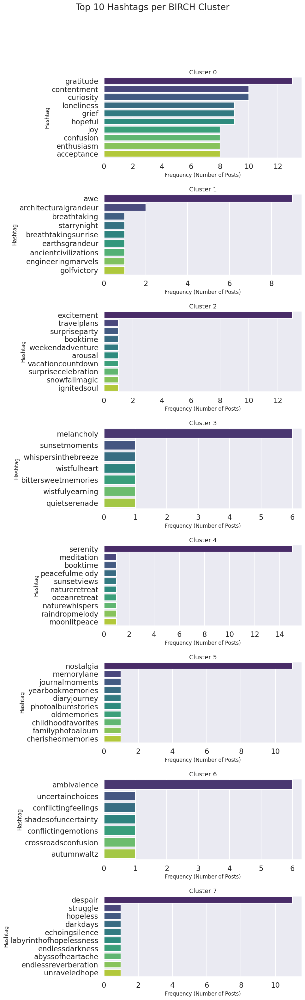

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import Birch
import pandas as pd

# This block uses 'X_reduced_ds2' and 'df_cluster_ds2'
if 'X_reduced_ds2' in locals() and 'df_cluster_ds2' in locals():
    
    # --- Part 1: Run Final Model ---
    
    # We are using k=8 (the same as K-Means) for a fair comparison
    n_clusters_birch = 8

    print(f"--- Block 11 (Dataset 2): Running BIRCH Clustering with n_clusters={n_clusters_birch} ---")
    
    # 1. Initialize and fit the final model
    birch = Birch(n_clusters=n_clusters_birch)
    
    # We use 'fit_predict' which fits and returns the labels
    cluster_labels_birch = birch.fit_predict(X_reduced_ds2)

    print("BIRCH model fitting complete.")

    # 2. Get the cluster labels and add them to our main DataFrame
    df_cluster_ds2['hashtag_group_birch'] = cluster_labels_birch

    print(f"Successfully added 'hashtag_group_birch' column to df_cluster_ds2.")
    print("\nCluster distribution (How many posts in each group):")
    print(df_cluster_ds2['hashtag_group_birch'].value_counts().sort_index())

    # --- Part 2: VISUALIZATION (The "Good Depiction") ---
    print("\n--- Visualizing BIRCH Cluster Topics (Top Hashtags) ---")
    
    cluster_labels = np.sort(df_cluster_ds2['hashtag_group_birch'].unique())

    # Create a tall figure to hold all 8 plots
    fig, axes = plt.subplots(len(cluster_labels), 1, figsize=(10, 32)) # 8 plots
    fig.suptitle('Top 10 Hashtags per BIRCH Cluster', fontsize=20, y=1.02)

    for i, cluster_id in enumerate(cluster_labels):
        
        # 1. Filter for this cluster
        cluster_df = df_cluster_ds2[df_cluster_ds2['hashtag_group_birch'] == cluster_id]
        
        # 2. Flatten the list of hashtags
        all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
        
        # 3. Get the Top 10 most common hashtags
        top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)
        
        # 4. Create a bar plot for this cluster
        sns.barplot(
            x=top_10_hashtags.values, 
            y=top_10_hashtags.index, 
            ax=axes[i], 
            palette='viridis'
        )
        axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
        axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
        axes[i].set_ylabel('Hashtag', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()

else:
    print("Matrix 'X_reduced_ds2' or 'df_cluster_ds2' is not found. Please run Block 4 first.")

## Internal Evaluation (Silhouette, CH, DB Metrics)

In [38]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import pandas as pd
import numpy as np

# This block uses 'X_reduced_ds2' (from Block 4) and 'df_cluster_ds2' (from Blocks 6-11)
if 'X_reduced_ds2' in locals() and 'df_cluster_ds2' in locals():
    print("--- Block 12 (Dataset 2): Internal Cluster Evaluation ---")
    
    # Our list of 5 algorithm results
    cluster_columns = {
        'K-Means': 'hashtag_group_kmeans',
        'DBSCAN': 'hashtag_group_dbscan',
        'Agglomerative': 'hashtag_group_agglo',
        'HDBSCAN': 'hashtag_group_hdbscan',
        'BIRCH': 'hashtag_group_birch'
    }
    
    # A list to store our results
    internal_results_list = []

    # Loop through each algorithm's results
    for algo_name, col_name in cluster_columns.items():
        print(f"Evaluating: {algo_name}...")
        
        # Get the labels from our DataFrame
        labels = df_cluster_ds2[col_name]
        
        # --- Important: Handle Noise (-1) ---
        # These metrics cannot handle a "-1" label from DBSCAN/HDBSCAN
        # We must only score the "core" points, not the noise
        if -1 in labels.unique():
            print("  Found noise (-1). Evaluating only non-noise points.")
            
            # Get the indices of all non-noise points
            valid_indices = labels[labels != -1].index
            
            # Filter X_reduced_ds2 to only the non-noise points
            # We must use .loc to match the original index from df_cluster_ds2
            X_filtered = X_reduced_ds2[df_cluster_ds2.index.isin(valid_indices)]
            labels_filtered = labels.loc[valid_indices]
            
            # Check if we still have clusters left
            if len(labels_filtered.unique()) < 2:
                print(f"  Skipping {algo_name}: Not enough clusters after removing noise.")
                continue
        else:
            X_filtered = X_reduced_ds2
            labels_filtered = labels

        # --- Calculate the 3 Metrics ---
        # 1. Silhouette Coefficient (Higher is better)
        sil_score = silhouette_score(X_filtered, labels_filtered)
        
        # 2. Calinski-Harabasz Index (Higher is better)
        ch_score = calinski_harabasz_score(X_filtered, labels_filtered)
        
        # 3. Davies-Bouldin Index (Lower is better)
        db_score = davies_bouldin_score(X_filtered, labels_filtered)
        
        internal_results_list.append({
            'Algorithm': algo_name,
            'Silhouette Score': sil_score,
            'Calinski-Harabasz Score': ch_score,
            'Davies-Bouldin Score': db_score
        })
        
        print(f"  > Silhouette: {sil_score:.4f}")
        print(f"  > Calinski-Harabasz: {ch_score:.2f}")
        print(f"  > Davies-Bouldin: {db_score:.4f}")

    print("\n--- Internal Evaluation Complete ---")
    
    # --- Final Results Table ---
    results_internal_df_ds2 = pd.DataFrame(internal_results_list)
    print("Final Internal Metrics Comparison Table (Dataset 2):")
    print(results_internal_df_ds2.to_string())

else:
    print("Matrix 'X_reduced_ds2' or 'df_cluster_ds2' is not found. Please run previous blocks.")

--- Block 12 (Dataset 2): Internal Cluster Evaluation ---
Evaluating: K-Means...
  > Silhouette: 0.5945
  > Calinski-Harabasz: 50.64
  > Davies-Bouldin: 0.3997
Evaluating: DBSCAN...
  Found noise (-1). Evaluating only non-noise points.
  Skipping DBSCAN: Not enough clusters after removing noise.
Evaluating: Agglomerative...
  > Silhouette: 0.5928
  > Calinski-Harabasz: 54.46
  > Davies-Bouldin: 0.4050
Evaluating: HDBSCAN...
  Found noise (-1). Evaluating only non-noise points.
  > Silhouette: 0.7272
  > Calinski-Harabasz: 121.19
  > Davies-Bouldin: 0.2851
Evaluating: BIRCH...
  > Silhouette: 0.5878
  > Calinski-Harabasz: 46.81
  > Davies-Bouldin: 0.3748

--- Internal Evaluation Complete ---
Final Internal Metrics Comparison Table (Dataset 2):
       Algorithm  Silhouette Score  Calinski-Harabasz Score  Davies-Bouldin Score
0        K-Means          0.594455                50.644391              0.399736
1  Agglomerative          0.592816                54.458556              0.405030
2

--- Block 13 (Dataset 2): Internal Evaluation Metrics (Horizontal 3-panel) ---


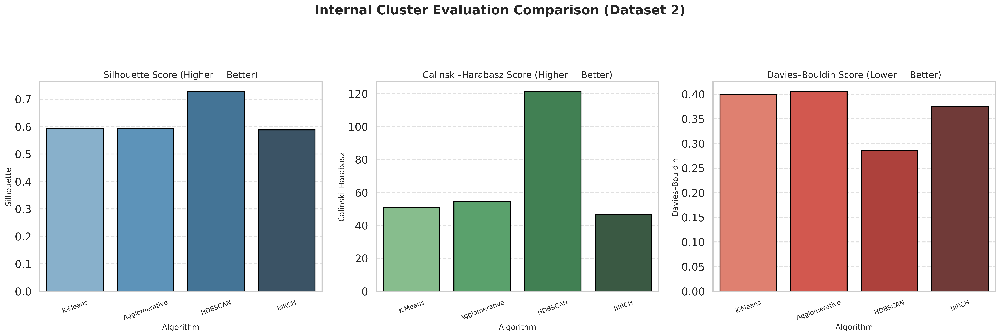

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Presentation style
sns.set(style='whitegrid', context='talk')

if 'results_internal_df_ds2' in locals():
    print("--- Block 13 (Dataset 2): Internal Evaluation Metrics (Horizontal 3-panel) ---")

    # Create 3 plots in one row (horizontal layout)
    fig, axes = plt.subplots(1, 3, figsize=(22, 7), dpi=400)
    fig.suptitle('Internal Cluster Evaluation Comparison (Dataset 2)', fontsize=20, weight='bold', y=1.05)

    # --- Plot 1: Silhouette Score (Higher is better) ---
    sns.barplot(
        x='Algorithm',
        y='Silhouette Score',
        data=results_internal_df_ds2,
        ax=axes[0],
        palette='Blues_d',
        edgecolor='black'
    )
    axes[0].set_title('Silhouette Score (Higher = Better)', fontsize=14)
    axes[0].set_xlabel('Algorithm', fontsize=12)
    axes[0].set_ylabel('Silhouette', fontsize=12)
    axes[0].tick_params(axis='x', rotation=20, labelsize=10)
    axes[0].grid(axis='y', linestyle='--', alpha=0.6)

    # --- Plot 2: Calinski–Harabasz Score (Higher is better) ---
    sns.barplot(
        x='Algorithm',
        y='Calinski-Harabasz Score',
        data=results_internal_df_ds2,
        ax=axes[1],
        palette='Greens_d',
        edgecolor='black'
    )
    axes[1].set_title('Calinski–Harabasz Score (Higher = Better)', fontsize=14)
    axes[1].set_xlabel('Algorithm', fontsize=12)
    axes[1].set_ylabel('Calinski–Harabasz', fontsize=12)
    axes[1].tick_params(axis='x', rotation=20, labelsize=10)
    axes[1].grid(axis='y', linestyle='--', alpha=0.6)

    # --- Plot 3: Davies–Bouldin Score (Lower is better) ---
    sns.barplot(
        x='Algorithm',
        y='Davies-Bouldin Score',
        data=results_internal_df_ds2,
        ax=axes[2],
        palette='Reds_d',
        edgecolor='black'
    )
    axes[2].set_title('Davies–Bouldin Score (Lower = Better)', fontsize=14)
    axes[2].set_xlabel('Algorithm', fontsize=12)
    axes[2].set_ylabel('Davies–Bouldin', fontsize=12)
    axes[2].tick_params(axis='x', rotation=20, labelsize=10)
    axes[2].grid(axis='y', linestyle='--', alpha=0.6)

    # Layout and save high-quality image for slides
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig('internal_metrics_dataset2_horizontal.png', dpi=450, bbox_inches='tight')
    plt.show()

else:
    print("DataFrame 'results_internal_df_ds2' is not found. Please run Block 12 first.")


## Supervised Evaluation (Proxy Task)

In [40]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.preprocessing import LabelBinarizer
import warnings

# This block uses 'df_cluster_ds2' from our previous work
if 'df_cluster_ds2' in locals():
    print("--- Block 14 (Dataset 2): Supervised Proxy Task (Evaluating Clusters) ---")
    
    # Suppress warnings for cleaner output
    warnings.filterwarnings('ignore')
    
    # --- Part 1: Setup ---
    
    # The 4 reliable cluster columns (excluding DBSCAN if it failed with < 2 clusters)
    cluster_columns = [
        'hashtag_group_kmeans',
        'hashtag_group_agglo',
        'hashtag_group_hdbscan',
        'hashtag_group_birch'
    ]
    
    # The classifiers we will use as "variants"
    classifiers = {
        'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
        'Random Forest': RandomForestClassifier(random_state=42, n_jobs=-1)
    }
    
    # The train/test splits you requested
    test_splits = [0.5, 0.4, 0.3, 0.2] # (for 50/50, 60/40, 70/30, 80/20)
    
    # A list to store all our results
    results_list_ds2 = []

    # --- Part 2: Vectorize the Tweet Text (Our 'X') ---
    # We use the text to predict the cluster group
    print("Vectorizing post text ('Text') for the proxy task...")
    text_vectorizer_ds2 = TfidfVectorizer(max_features=500, stop_words='english')
    
    # --- Part 3: The Evaluation Loop ---
    
    # Loop 1: For each of our 4 clustering algorithms...
    for col_name in cluster_columns:
        print(f"\n--- Evaluating Algorithm: {col_name.replace('hashtag_group_', '')} ---")
        
        y_labels_series = df_cluster_ds2[col_name].copy()
        
        # --- Data Prep for this loop ---
        # IMPORTANT: We must remove "noise" rows (label -1)
        if -1 in y_labels_series.values:
            print(f"  Found noise points (-1). Removing them for this evaluation.")
            # Filter X and y to only the valid rows
            valid_indices = y_labels_series[y_labels_series != -1].index
            X_eval_text = df_cluster_ds2['Text'].loc[valid_indices]
            y_eval = y_labels_series.loc[valid_indices]
        else:
            X_eval_text = df_cluster_ds2['Text']
            y_eval = y_labels_series
            
        # Check if we have more than 1 class
        if y_eval.nunique() < 2:
            print(f"  Skipping {col_name}: It has fewer than 2 clusters.")
            continue
            
        # Vectorize our text X *after* filtering
        X_eval = text_vectorizer_ds2.fit_transform(X_eval_text)
            
        # Loop 2: For each of our 4 train/test splits...
        for split_size in test_splits:
            train_size_percent = int((1 - split_size) * 100)
            test_size_percent = int(split_size * 100)
            split_name = f"{train_size_percent}/{test_size_percent}"
            print(f"  Running Split: {split_name}")
            
            # Split the data
            try:
                X_train, X_test, y_train, y_test = train_test_split(
                    X_eval, y_eval, test_size=split_size, random_state=42, stratify=y_eval
                )
            except ValueError:
                print(f"    Skipping split: Not enough samples to stratify.")
                continue
            
            # Loop 3: For each of our 2 classifiers...
            for clf_name, classifier in classifiers.items():
                
                # Fit the classifier
                classifier.fit(X_train, y_train)
                
                # Make predictions
                y_pred = classifier.predict(X_test)
                y_pred_proba = classifier.predict_proba(X_test)
                
                # --- Part 4: Calculate All 5 Metrics ---
                accuracy = accuracy_score(y_test, y_pred)
                precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
                recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
                f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)
                
                # ROC-AUC requires "binarizing" labels
                lb = LabelBinarizer()
                lb.fit(y_eval)
                y_test_bin = lb.transform(y_test)
                
                # Handle binary vs multi-class ROC-AUC
                if y_test_bin.ndim == 1 or y_test_bin.shape[1] == 1:
                    roc_auc = roc_auc_score(y_test_bin, y_pred_proba[:, 1], average='weighted')
                else:
                    roc_auc = roc_auc_score(y_test_bin, y_pred_proba, average='weighted', multi_class='ovr')
                
                # Store the results
                results_list_ds2.append({
                    'Cluster Algorithm': col_name.replace('hashtag_group_', ''),
                    'Split': split_name,
                    'Classifier': clf_name,
                    'Accuracy': accuracy,
                    'Precision': precision,
                    'Recall': recall,
                    'F1-Score': f1,
                    'ROC-AUC': roc_auc
                })

    print("\n--- Evaluation Complete ---")
    
    # --- Part 5: Final Results Table ---
    # Convert our list of results into a clean DataFrame
    global results_df_ds2 # Make the results available globally for the next block
    results_df_ds2 = pd.DataFrame(results_list_ds2)
    
    print("Final Supervised Evaluation Table (Dataset 2):")
    print(results_df_ds2.to_string())

else:
    print("DataFrame 'df_cluster_ds2' is not found. Please run previous blocks.")

--- Block 14 (Dataset 2): Supervised Proxy Task (Evaluating Clusters) ---
Vectorizing post text ('Text') for the proxy task...

--- Evaluating Algorithm: kmeans ---
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluating Algorithm: agglo ---
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluating Algorithm: hdbscan ---
  Found noise points (-1). Removing them for this evaluation.
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluating Algorithm: birch ---
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluation Complete ---
Final Supervised Evaluation Table (Dataset 2):
   Cluster Algorithm  Split           Classifier  Accuracy  Precision    Recall  F1-Score   ROC-AUC
0             kmeans  50/50  Logistic Regression  0.896175   0.803129  0.896175  0.847105  0.924470
1             km

--- Unified Visualization: Supervised Evaluation Metrics (Dataset 2, Fully Labeled) ---
Averaging results across all train/test splits... (Success)


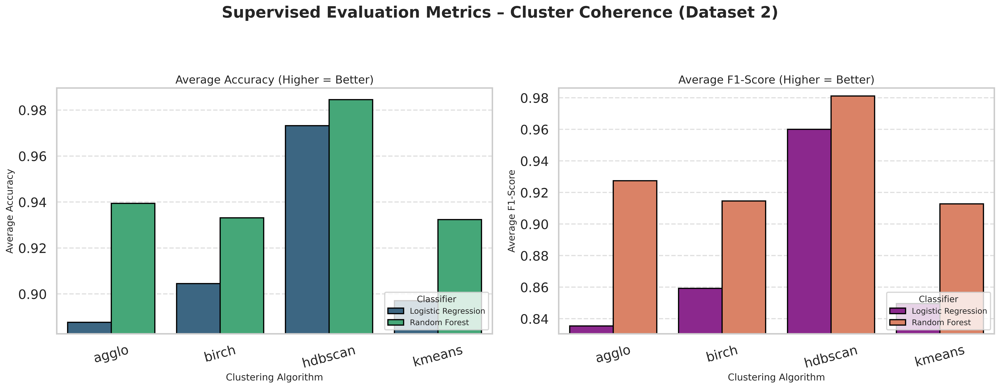

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Consistent presentation theme
sns.set(style='whitegrid', context='talk')

if 'results_df_ds2' in locals():
    print("--- Unified Visualization: Supervised Evaluation Metrics (Dataset 2, Fully Labeled) ---")
    
    # --- Step 1: Aggregate average metrics ---
    avg_results_df = results_df_ds2.groupby(['Cluster Algorithm', 'Classifier'])[
        ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC']
    ].mean().reset_index()
    
    print("Averaging results across all train/test splits... (Success)")

    # --- Step 2: Create a high-quality horizontal 2-panel figure ---
    fig, axes = plt.subplots(1, 2, figsize=(18, 7), dpi=450)
    fig.suptitle('Supervised Evaluation Metrics – Cluster Coherence (Dataset 2)', 
                 fontsize=20, weight='bold', y=1.02)

    # --- Plot 1: Accuracy ---
    sns.barplot(
        data=avg_results_df,
        x='Cluster Algorithm',
        y='Accuracy',
        hue='Classifier',
        palette='viridis',
        edgecolor='black',
        ax=axes[0]
    )
    axes[0].set_title('Average Accuracy (Higher = Better)', fontsize=14)
    axes[0].set_xlabel('Clustering Algorithm', fontsize=12)
    axes[0].set_ylabel('Average Accuracy', fontsize=12)
    axes[0].tick_params(axis='x', rotation=15)
    axes[0].grid(axis='y', linestyle='--', alpha=0.6)
    axes[0].set_ylim(avg_results_df['Accuracy'].min() - 0.005, 
                     avg_results_df['Accuracy'].max() + 0.005)
    axes[0].legend(title='Classifier', fontsize=10, title_fontsize=11, loc='lower right')

    # --- Plot 2: F1-Score ---
    sns.barplot(
        data=avg_results_df,
        x='Cluster Algorithm',
        y='F1-Score',
        hue='Classifier',
        palette='plasma',
        edgecolor='black',
        ax=axes[1]
    )
    axes[1].set_title('Average F1-Score (Higher = Better)', fontsize=14)
    axes[1].set_xlabel('Clustering Algorithm', fontsize=12)
    axes[1].set_ylabel('Average F1-Score', fontsize=12)
    axes[1].tick_params(axis='x', rotation=15)
    axes[1].grid(axis='y', linestyle='--', alpha=0.6)
    axes[1].set_ylim(avg_results_df['F1-Score'].min() - 0.005, 
                     avg_results_df['F1-Score'].max() + 0.005)
    axes[1].legend(title='Classifier', fontsize=10, title_fontsize=11, loc='lower right')

    # --- Layout + Save ---
    plt.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.savefig('supervised_metrics_dataset2_combined_labeled.png', dpi=450, bbox_inches='tight')
    plt.show()

else:
    print("DataFrame 'results_df_ds2' is not found. Please run Block 14 first.")


--- Block 16 (Dataset 2): Smoothed Combined Trend Visualization (Styled Like Dataset 1) ---
📆 Aggregating trends weekly (W)...


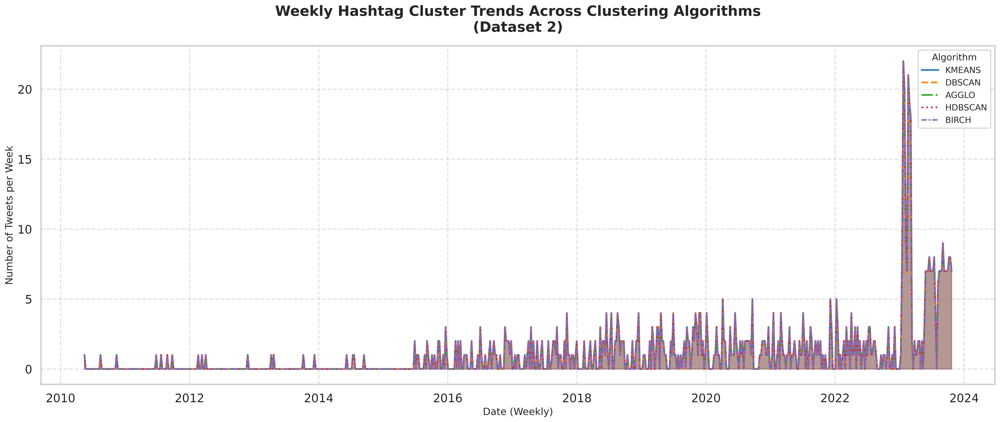

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Clean presentation theme
sns.set(style='whitegrid', context='talk')

if 'df_cluster_ds2' in locals():
    print("--- Block 16 (Dataset 2): Smoothed Combined Trend Visualization (Styled Like Dataset 1) ---")
    
    df_trends = df_cluster_ds2.copy()

    # --- Step 1: Ensure 'date' column exists and is parsed ---
    if 'date' not in df_trends.columns:
        try:
            df_trends['date'] = pd.to_datetime(df_trends['Timestamp'])
            print("✅ Recovered 'date' column from 'Timestamp'.")
        except Exception as e:
            print("❌ ERROR: Date conversion failed.")
            raise e

    df_trends.set_index('date', inplace=True)

    # --- Step 2: Define algorithms and period ---
    cluster_columns = [
        'hashtag_group_kmeans',
        'hashtag_group_dbscan',
        'hashtag_group_agglo',
        'hashtag_group_hdbscan',
        'hashtag_group_birch'
    ]

    resample_period = 'W'
    print(f"📆 Aggregating trends weekly ({resample_period})...")

    # --- Step 3: Compute total tweet counts per algorithm per week ---
    combined_trends = pd.DataFrame()

    for col_name in cluster_columns:
        algo_name = col_name.replace('hashtag_group_', '').upper()
        k_dummies = pd.get_dummies(df_trends[col_name], prefix='Cluster')
        weekly_trends = k_dummies.resample(resample_period).sum()
        total_weekly = weekly_trends.sum(axis=1)
        combined_trends[algo_name] = total_weekly

    # --- Step 4: Plot with filled transparency (style-matched to reference image) ---
    plt.figure(figsize=(20, 9), dpi=450)
    palette = sns.color_palette("tab10", n_colors=len(cluster_columns))

    for i, algo_name in enumerate(combined_trends.columns):
        plt.plot(combined_trends.index,
                 combined_trends[algo_name],
                 label=algo_name,
                 linewidth=2.5,
                 linestyle=['-', '--', '-.', ':', (0, (3, 1, 1, 1))][i % 5],
                 color=palette[i],
                 alpha=0.9)
        plt.fill_between(combined_trends.index,
                         combined_trends[algo_name],
                         color=palette[i],
                         alpha=0.2)

    # --- Step 5: Style and labeling ---
    plt.title('Weekly Hashtag Cluster Trends Across Clustering Algorithms\n(Dataset 2)', 
              fontsize=20, weight='bold', pad=20)
    plt.xlabel('Date (Weekly)', fontsize=14)
    plt.ylabel('Number of Tweets per Week', fontsize=14)
    plt.legend(title='Algorithm', fontsize=12, title_fontsize=13, loc='upper right')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout(rect=[0, 0, 1, 0.96])

    # --- Step 6: Export for slides ---
    plt.savefig('dataset2_trend_filled_style.png', dpi=450, bbox_inches='tight')
    plt.show()

else:
    print("DataFrame 'df_cluster_ds2' not found. Please run previous preprocessing blocks first.")


# WORKING WITH THE THIRD DATASET: US ELECTION TWEETS

# Data Loading and Inspect

In [43]:
import pandas as pd
import numpy as np

print("--- Phase 1 (Dataset 3): Load and Inspect ---")

# --- 1. IMPORTANT: CHECK AND EDIT THIS PATH ---
# You MUST update this path and filename to match your uploaded CSV file.
filepath_ds3 = '/kaggle/input/us-election-2020-tweets/hashtag_joebiden.csv' # <--- CHECK/EDIT THIS
encoding = 'ISO-8859-1' 

# --- 2. Load the new dataset (Loading a sample for speed) ---
try:
    df3 = pd.read_csv(
        filepath_ds3, 
        on_bad_lines='skip',
        encoding=encoding
    )
    
    print(f"Dataset 3 '{filepath_ds3}' loaded successfully!")

    # --- 3. Inspect the Data ---
    print("\n--- Data Quality (Info) ---")
    df3.info()

    print("\n--- First 5 Lines ---")
    print(df3.head())
    
except FileNotFoundError:
    print(f"ERROR: File not found at {filepath_ds3}")
except Exception as e:
    print(f"An error occurred while loading: {e}")

--- Phase 1 (Dataset 3): Load and Inspect ---
Dataset 3 '/kaggle/input/us-election-2020-tweets/hashtag_joebiden.csv' loaded successfully!

--- Data Quality (Info) ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1059909 entries, 0 to 1059908
Data columns (total 21 columns):
 #   Column                Non-Null Count    Dtype  
---  ------                --------------    -----  
 0   created_at            1059909 non-null  object 
 1   tweet_id              887173 non-null   object 
 2   tweet                 887173 non-null   object 
 3   likes                 887092 non-null   object 
 4   retweet_count         887073 non-null   float64
 5   source                886360 non-null   object 
 6   user_id               887067 non-null   object 
 7   user_name             887048 non-null   object 
 8   user_screen_name      786660 non-null   object 
 9   user_description      704647 non-null   object 
 10  user_join_date        776784 non-null   object 
 11  user_followers_count  7768

In [44]:
import pandas as pd
import re
import numpy as np

# This block uses 'df3' from Block 1
if 'df3' in locals():
    print("--- Block 2 (Dataset 3, FINAL v3): Feature Engineering with 10k SAMPLE ---")
    
    # --- 1. SAMPLING (THE NEW STEP) ---
    # We will sample 10,000 random rows. This will be very fast
    # and prevent all memory errors.
    print(f"Original size: {len(df3)} rows. Sampling 10,000 rows...")
    df_analysis_ds3 = df3.sample(n=10000, random_state=42).copy()
    print("Sampling complete.")

    # --- 2. Data Cleaning and Imputation ---
    print("Handling data types and missing values...")
    
    # 2.1. Date Conversion with Robust Error Handling
    df_analysis_ds3['date'] = pd.to_datetime(df_analysis_ds3['created_at'], errors='coerce')
    
    # 2.2. Clean 'tweet' column
    df_analysis_ds3['tweet'] = df_analysis_ds3['tweet'].fillna('') 

    # 2.3. Numeric Cleaning and Imputation (Likes/Retweets)
    df_analysis_ds3['likes'] = pd.to_numeric(df_analysis_ds3['likes'], errors='coerce')
    
    for col in ['likes', 'retweet_count']:
        mean_val = df_analysis_ds3[col].mean()
        df_analysis_ds3[col] = df_analysis_ds3[col].fillna(mean_val)
    
    # --- 3. Hashtag Extraction ---
    
    def extract_and_clean_text(text):
        if not isinstance(text, str):
             return ""
        text = re.sub(r'https?://[A-Za-z0-9./]+', '', text)
        text = re.sub(r'@[A-Za-z0-9_]+', '', text)
        text = re.sub(r'[^\w\s#]', '', text) 
        return text.lower()

    def extract_hashtags(text):
        return re.findall(r'#(\w+)', text)

    df_analysis_ds3['cleaned_text'] = df_analysis_ds3['tweet'].apply(extract_and_clean_text)
    df_analysis_ds3['hashtags_list'] = df_analysis_ds3['cleaned_text'].apply(extract_hashtags)
    df_analysis_ds3['hashtag_count'] = df_analysis_ds3['hashtags_list'].apply(len)
    
    # --- 4. Final Filtering ---
    df_analysis_ds3.dropna(subset=['date'], inplace=True)
    df_cluster_ds3 = df_analysis_ds3[df_analysis_ds3['hashtag_count'] > 0].copy()

    print(f"Total posts for clustering (with hashtags and valid date): {len(df_cluster_ds3)}")
    
    print("\n--- Final DataFrame Head (for verification) ---")
    print(df_cluster_ds3[['date', 'tweet', 'hashtags_list', 'hashtag_count', 'likes']].head())

else:
    print("DataFrame 'df3' is not found. Please run Block 1 first.")

--- Block 2 (Dataset 3, FINAL v3): Feature Engineering with 10k SAMPLE ---
Original size: 1059909 rows. Sampling 10,000 rows...
Sampling complete.
Handling data types and missing values...
Total posts for clustering (with hashtags and valid date): 7386

--- Final DataFrame Head (for verification) ---
                      date                                              tweet  \
9523   2020-10-15 15:53:11  @realDonaldTrump &gt; 217,000 lives lost with ...   
691142 2020-11-07 17:18:10  #Election2020 #JOEBIDEN2020 #JoeBiden https://...   
275767 2020-11-01 14:55:51  "We The People"! - Pres Trump Speaks to Tens o...   
676027 2020-11-07 16:57:00  #Biden  KazandÄ±.\nð  artik tetikte olun.\n...   
306566 2020-11-02 20:43:49  @chrislhayes Apparently, It Was The "White" #J...   

                                            hashtags_list  hashtag_count  \
9523                           [biden, trumpisnotamerica]              2   
691142             [election2020, joebiden2020, joebiden]  

## Descriptive Statistics

--- Block 3 (Dataset 3): Descriptive Statistics, Imbalance & Outlier Analysis ---

Total usable posts for clustering: 7386

--- Descriptive Statistics (Hashtag Count and Engagement) ---
       hashtag_count         likes  retweet_count
count    7386.000000   7386.000000    7386.000000
mean        4.170999     15.000677       2.407392
std         3.698616    693.924969      88.555162
min         1.000000      0.000000       0.000000
25%         2.000000      0.000000       0.000000
50%         3.000000      0.000000       0.000000
75%         5.000000      2.000000       0.000000
max        32.000000  59403.000000    7489.000000

--- Distribution and Imbalance Visualization ---


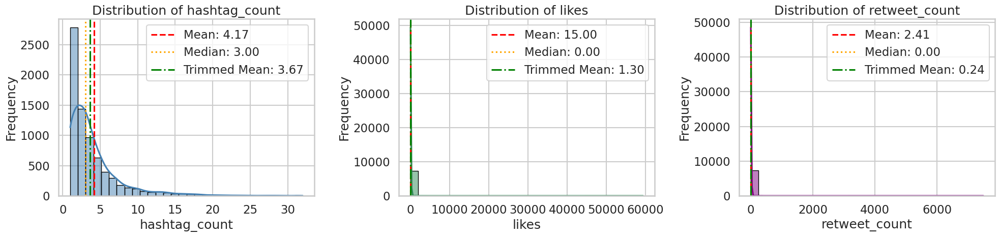


--- Outlier Visualization ---


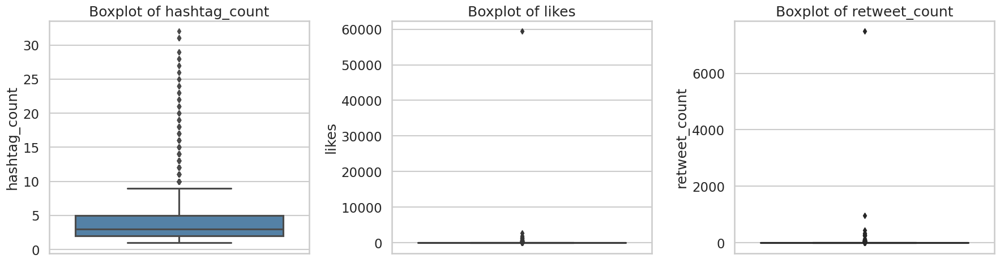


--- Trimmed Statistics (10%) ---
hashtag_count:
   Original Mean = 4.17, Trimmed Mean = 3.67
   Original Std  = 3.70, Trimmed Std = 2.40

likes:
   Original Mean = 15.00, Trimmed Mean = 1.30
   Original Std  = 693.92, Trimmed Std = 2.54

retweet_count:
   Original Mean = 2.41, Trimmed Mean = 0.24
   Original Std  = 88.56, Trimmed Std = 0.67


--- Imbalance Analysis ---
               Imbalance Ratio (max/median)  Variability Ratio (std/mean)  \
hashtag_count                        10.667                         0.887   
likes                                   NaN                        46.260   
retweet_count                           NaN                        36.785   

               Skewness  
hashtag_count     2.600  
likes            84.921  
retweet_count    82.063  

--- Automated Observations ---

➡ hashtag_count:
   ⚠️ Strong imbalance — a few posts dominate heavily (possible outliers).
   ✅ Variability is within acceptable limits.
   ⚠️ Strong right skew detected — data not

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# --- Block 3 (Dataset 3): Enhanced Descriptive, Imbalance & Outlier Analysis ---
if 'df_cluster_ds3' in locals():
    print("--- Block 3 (Dataset 3): Descriptive Statistics, Imbalance & Outlier Analysis ---")

    # ========== 1. Descriptive Statistics ==========
    print(f"\nTotal usable posts for clustering: {len(df_cluster_ds3)}")
    print("\n--- Descriptive Statistics (Hashtag Count and Engagement) ---")
    stats_df = df_cluster_ds3[['hashtag_count', 'likes', 'retweet_count']]
    print(stats_df.describe())

    numeric_cols = ['hashtag_count', 'likes', 'retweet_count']
    colors = ['steelblue', 'seagreen', 'purple']

    # ========== 2. Distribution + Imbalance Visualization ==========
    print("\n--- Distribution and Imbalance Visualization ---")
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))

    for i, col in enumerate(numeric_cols):
        data = df_cluster_ds3[col].dropna()
        sns.histplot(data, kde=True, bins=30, ax=axes[i], color=colors[i], edgecolor='black')
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

        # Add mean, median, and trimmed mean
        mean_val = data.mean()
        median_val = data.median()
        trimmed_mean_val = stats.trim_mean(data, 0.05)

        axes[i].axvline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.2f}')
        axes[i].axvline(median_val, color='orange', linestyle=':', label=f'Median: {median_val:.2f}')
        axes[i].axvline(trimmed_mean_val, color='green', linestyle='-.', label=f'Trimmed Mean: {trimmed_mean_val:.2f}')
        axes[i].legend()

    plt.tight_layout()
    plt.show()

    # ========== 3. Outlier Visualization (Boxplots) ==========
    print("\n--- Outlier Visualization ---")
    plt.figure(figsize=(18, 5))

    for i, col in enumerate(numeric_cols):
        plt.subplot(1, 3, i+1)
        sns.boxplot(y=df_cluster_ds3[col], color=colors[i])
        plt.title(f'Boxplot of {col}')

    plt.tight_layout()
    plt.show()

    # ========== 4. Trimmed Statistics (Mean + Std) ==========
    print("\n--- Trimmed Statistics (10%) ---")
    trim_fraction = 0.05

    for col in numeric_cols:
        data = df_cluster_ds3[col].dropna()
        trimmed_mean = stats.trim_mean(data, trim_fraction)

        # Trimmed standard deviation
        lower, upper = np.percentile(data, [trim_fraction * 100, 100 - trim_fraction * 100])
        trimmed_data = data[(data >= lower) & (data <= upper)]
        trimmed_std = trimmed_data.std()

        print(f"{col}:")
        print(f"   Original Mean = {data.mean():.2f}, Trimmed Mean = {trimmed_mean:.2f}")
        print(f"   Original Std  = {data.std():.2f}, Trimmed Std = {trimmed_std:.2f}\n")

    # ========== 5. Imbalance Analysis ==========
    print("\n--- Imbalance Analysis ---")
    imbalance_report = {}
    for col in numeric_cols:
        data = df_cluster_ds3[col].dropna()
        imbalance_ratio = data.max() / data.median() if data.median() != 0 else np.nan
        variability_ratio = data.std() / data.mean() if data.mean() != 0 else np.nan
        skewness = data.skew()
        imbalance_report[col] = {
            'Imbalance Ratio (max/median)': imbalance_ratio,
            'Variability Ratio (std/mean)': variability_ratio,
            'Skewness': skewness
        }

    imbalance_df = pd.DataFrame(imbalance_report).T
    print(imbalance_df.round(3))

    # ========== 6. Automated Observations ==========
    print("\n--- Automated Observations ---")
    for col in numeric_cols:
        row = imbalance_df.loc[col]
        print(f"\n➡ {col}:")
        if row['Imbalance Ratio (max/median)'] > 10:
            print("   ⚠️ Strong imbalance — a few posts dominate heavily (possible outliers).")
        elif row['Imbalance Ratio (max/median)'] > 5:
            print("   ℹ️ Moderate imbalance detected.")
        else:
            print("   ✅ Distribution appears reasonably balanced.")

        if row['Variability Ratio (std/mean)'] > 1:
            print("   ⚠️ High variability — values spread widely around the mean.")
        else:
            print("   ✅ Variability is within acceptable limits.")

        if abs(row['Skewness']) > 1:
            print(f"   ⚠️ Strong {'right' if row['Skewness'] > 0 else 'left'} skew detected — data not symmetric.")
        elif abs(row['Skewness']) > 0.5:
            print(f"   ℹ️ Mild {'right' if row['Skewness'] > 0 else 'left'} skew present.")
        else:
            print("   ✅ Distribution is approximately symmetric.")

else:
    print("DataFrame 'df_cluster_ds3' is not found. Please run Block 2 first.")


--- Block 4 (Dataset 3): Correlation Analysis ---
Correlation Matrix (Hashtag Count vs. Engagement):
               hashtag_count     likes  retweet_count
hashtag_count       1.000000 -0.004671      -0.003156
likes              -0.004671  1.000000       0.992631
retweet_count      -0.003156  0.992631       1.000000




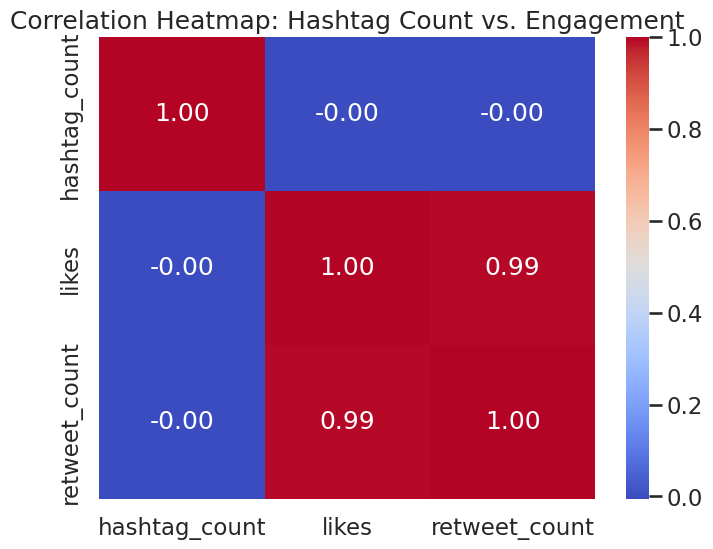

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# This block uses 'df_cluster_ds3' from Block 2
if 'df_cluster_ds3' in locals():
    print("--- Block 4 (Dataset 3): Correlation Analysis ---")
    
    # We correlate hashtag count, likes, and retweet count
    correlation_data = df_cluster_ds3[['hashtag_count', 'likes', 'retweet_count']]
    
    # 1. Calculate the correlation matrix
    correlation_matrix = correlation_data.corr()
    
    print("Correlation Matrix (Hashtag Count vs. Engagement):")
    print(correlation_matrix)
    print("\n")

    # 2. Plot the correlation matrix as a heatmap
    plt.figure(figsize=(8, 6))
    # annot=True shows the numerical correlation value
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Heatmap: Hashtag Count vs. Engagement')
    plt.show()

else:
    print("DataFrame 'df_cluster_ds3' is not found. Please re-run Block 2 first.")

In [47]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
import numpy as np

# This block uses 'df_cluster_ds3' from Block 2
if 'df_cluster_ds3' in locals():
    print("--- Block 5 (Dataset 3): TF-IDF & SVD ---")
    
    # --- 1. TF-IDF Vectorization ---
    
    # Join the list of hashtags into a single space-separated string
    df_cluster_ds3['hashtags_str'] = df_cluster_ds3['hashtags_list'].apply(lambda x: ' '.join(x))

    # Initialize the TF-IDF Vectorizer (max_features=500 for a large political dataset)
    tfidf_vectorizer_ds3 = TfidfVectorizer(max_features=500, min_df=2)

    print("Vectorizing hashtags with TF-IDF...")
    X_tfidf_ds3 = tfidf_vectorizer_ds3.fit_transform(df_cluster_ds3['hashtags_str'])
    
    print(f"TF-IDF matrix shape: {X_tfidf_ds3.shape}")

    # --- 2. Dimensionality Reduction (SVD) ---
    
    # We reduce dimensions to 30 components for fast clustering
    n_components = min(30, X_tfidf_ds3.shape[1] - 1)
    
    # Initialize TruncatedSVD
    svd_ds3 = TruncatedSVD(n_components=n_components, random_state=42)

    print(f"Reducing dimensions to {n_components} components...")
    # This creates our final input matrix for all clustering
    X_reduced_ds3 = svd_ds3.fit_transform(X_tfidf_ds3)

    print("Reduction complete!")
    print(f"New reduced matrix shape: {X_reduced_ds3.shape}")

else:
    print("DataFrame 'df_cluster_ds3' is not found. Please run Block 2 first.")

--- Block 5 (Dataset 3): TF-IDF & SVD ---
Vectorizing hashtags with TF-IDF...
TF-IDF matrix shape: (7386, 500)
Reducing dimensions to 30 components...
Reduction complete!
New reduced matrix shape: (7386, 30)


## K MEANS

--- Block 6 (Dataset 3): K-Means++ Elbow Method ---
Calculating inertia for k=2 to k=15 to find the new elbow...
Completed for k=2
Completed for k=3
Completed for k=4
Completed for k=5
Completed for k=6
Completed for k=7
Completed for k=8
Completed for k=9
Completed for k=10
Completed for k=11
Completed for k=12
Completed for k=13
Completed for k=14
Completed for k=15
Calculation complete.



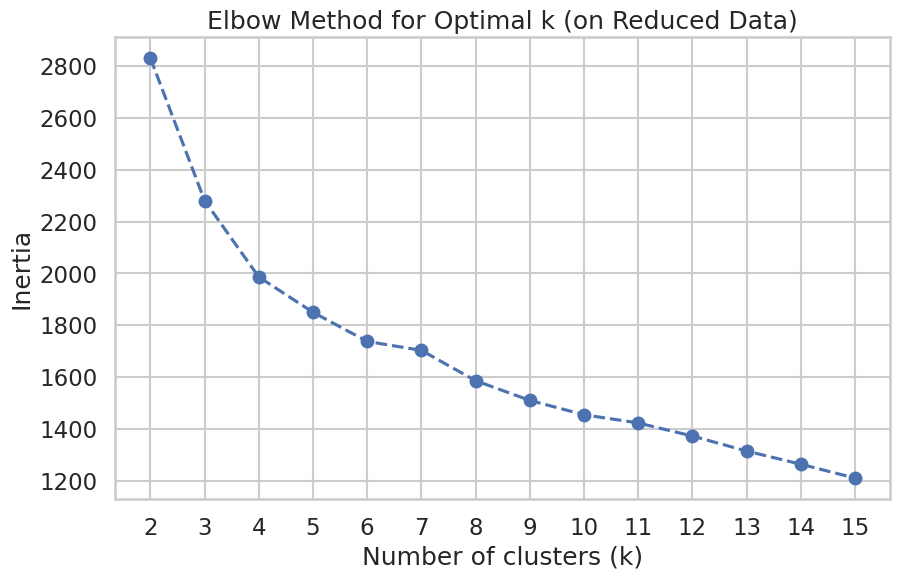

In [48]:
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# This block uses 'X_reduced_ds3' from Block 5
if 'X_reduced_ds3' in locals():
    print("--- Block 6 (Dataset 3): K-Means++ Elbow Method ---")
    
    # --- Part 1: Find the Elbow ---
    print("Calculating inertia for k=2 to k=15 to find the new elbow...")
    inertia_list = []
    k_range = range(2, 16) 

    for k in k_range:
        # 'k-means++' is the default 'init' method
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        
        # We fit on our new reduced matrix
        kmeans.fit(X_reduced_ds3)
        
        inertia_list.append(kmeans.inertia_)
        print(f"Completed for k={k}")

    print("Calculation complete.\n")

    # --- Part 2: Plot the Elbow Method Graph ---
    plt.figure(figsize=(10, 6))
    plt.plot(k_range, inertia_list, marker='o', linestyle='--')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for Optimal k (on Reduced Data)')
    plt.xticks(k_range)
    plt.grid(True)
    plt.show()

else:
    print("Matrix 'X_reduced_ds3' is not found. Please run Block 5 first.")

--- Block 7 (Dataset 3): Running final K-Means model with k=7 ---
Successfully added 'hashtag_group_kmeans' column to df_cluster_ds3.

Cluster distribution (How many posts in each group):
hashtag_group_kmeans
0     292
1    4125
2     743
3     505
4    1060
5     457
6     204
Name: count, dtype: int64

--- Visualizing K-Means Cluster Topics (Top Hashtags) ---


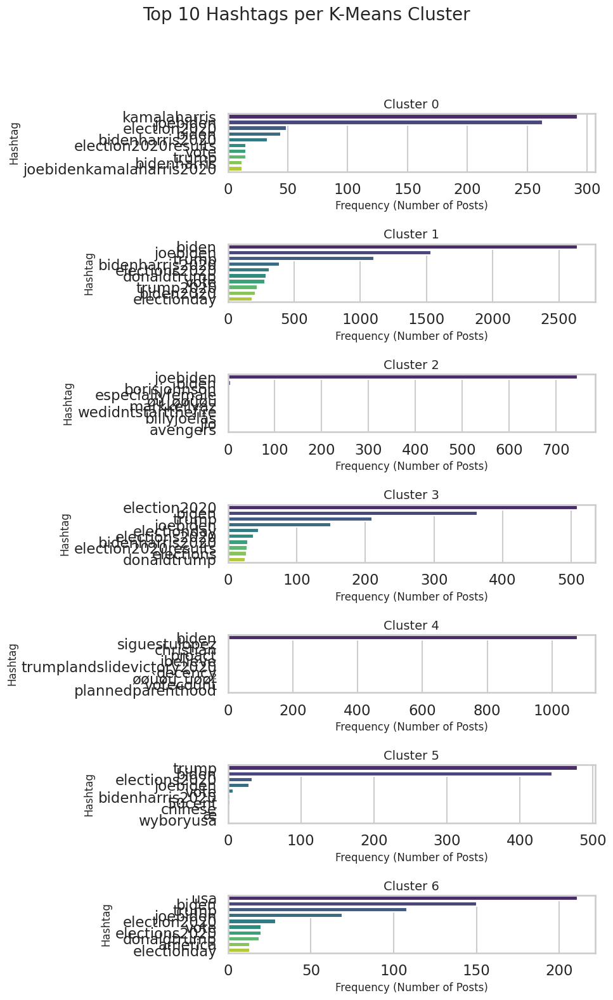

In [49]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# This block uses 'X_reduced_ds3' and 'df_cluster_ds3' from Block 5
if 'X_reduced_ds3' in locals() and 'df_cluster_ds3' in locals():
    
    # --- Part 1: Run Final Model ---
    
    # We are using the k=4 you selected
    optimal_k = 7

    print(f"--- Block 7 (Dataset 3): Running final K-Means model with k={optimal_k} ---")
    
    # 1. Initialize and fit the final model
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    kmeans.fit(X_reduced_ds3)

    # 2. Get the cluster labels and add them to our DataFrame
    cluster_labels_kmeans = kmeans.labels_
    df_cluster_ds3['hashtag_group_kmeans'] = cluster_labels_kmeans

    print(f"Successfully added 'hashtag_group_kmeans' column to df_cluster_ds3.")
    print("\nCluster distribution (How many posts in each group):")
    print(df_cluster_ds3['hashtag_group_kmeans'].value_counts().sort_index())

    # --- Part 2: VISUALIZATION (The "Good Depiction") ---
    print("\n--- Visualizing K-Means Cluster Topics (Top Hashtags) ---")
    
    cluster_labels = np.sort(df_cluster_ds3['hashtag_group_kmeans'].unique())

    # Create a figure to hold all 4 plots
    fig, axes = plt.subplots(len(cluster_labels), 1, figsize=(10, 16)) 
    fig.suptitle('Top 10 Hashtags per K-Means Cluster', fontsize=20, y=1.02)

    for i, cluster_id in enumerate(cluster_labels):
        
        # 1. Filter our DataFrame to *only* posts in this cluster
        cluster_df = df_cluster_ds3[df_cluster_ds3['hashtag_group_kmeans'] == cluster_id]
        
        # 2. Flatten the list of hashtags
        all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
        
        # 3. Get the Top 10 most common hashtags
        top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)
        
        # 4. Create a bar plot for this cluster
        sns.barplot(
            x=top_10_hashtags.values, 
            y=top_10_hashtags.index, 
            ax=axes[i], 
            palette='viridis'
        )
        axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
        axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
        axes[i].set_ylabel('Hashtag', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()

else:
    print("Matrix 'X_reduced_ds3' or 'df_cluster_ds3' is not found. Please re-run Block 2 and Block 5 first.")

## DBSCAN

--- Block 8 (Dataset 3): Finding optimal epsilon (ε) for DBSCAN ---
Calculating distance to the 60-th nearest neighbor...
Calculation complete. Generating graph.


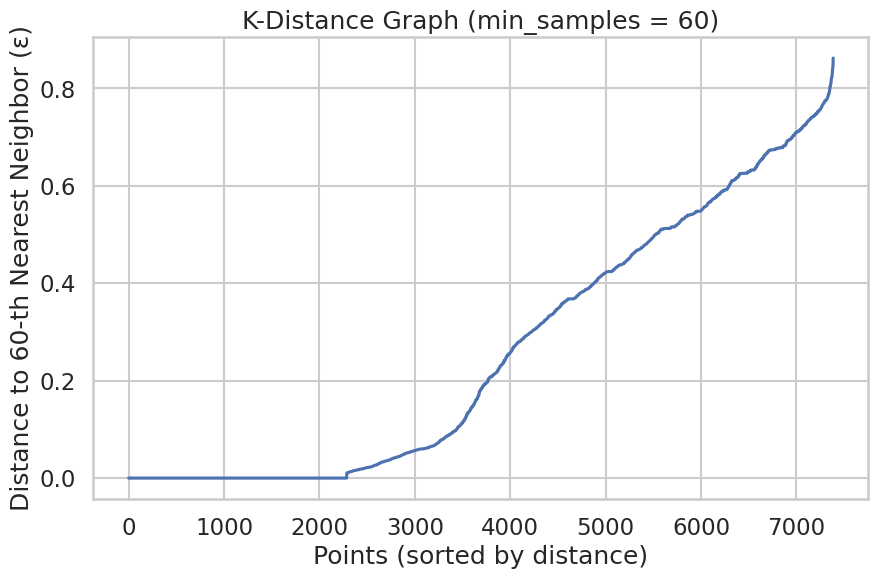

--- How to Read This Plot ---
Identify the 'knee' of the graph where the line sharply curves upwards. This Y-value is the optimal epsilon (ε).


In [50]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# This block uses 'X_reduced_ds3' from Block 5
if 'X_reduced_ds3' in locals():
    print("--- Block 8 (Dataset 3): Finding optimal epsilon (ε) for DBSCAN ---")
    
    # 1. Define 'min_samples' (2 * D = 2 * 30 = 60)
    min_samples = 60
    
    print(f"Calculating distance to the {min_samples}-th nearest neighbor...")

    # 2. Find the distance to the 'min_samples' nearest neighbor for each point
    nn = NearestNeighbors(n_neighbors=min_samples)
    nn.fit(X_reduced_ds3)
    distances, indices = nn.kneighbors(X_reduced_ds3)
    
    # 3. Get the distance to the k-th neighbor and sort them
    kth_distances = np.sort(distances[:, min_samples-1])
    
    print("Calculation complete. Generating graph.")

    # 4. Plot the k-distance graph
    plt.figure(figsize=(10, 6))
    plt.plot(kth_distances)
    plt.title(f'K-Distance Graph (min_samples = {min_samples})')
    plt.xlabel('Points (sorted by distance)')
    plt.ylabel(f'Distance to {min_samples}-th Nearest Neighbor (ε)')
    plt.grid(True)
    plt.show()

    print("--- How to Read This Plot ---")
    print("Identify the 'knee' of the graph where the line sharply curves upwards. This Y-value is the optimal epsilon (ε).")

else:
    print("Matrix 'X_reduced_ds3' is not found. Please run Block 5 first.")

**Taking the epsilon value to be 0.1**

--- Block 9 (Dataset 3): Running DBSCAN with eps=0.2 & min_samples=60 ---
Successfully added 'hashtag_group_dbscan' column to df_cluster_ds3.

--- DBSCAN Summary ---
Total clusters found: 7
Total noise points found: 3377 (labeled as -1)

Cluster distribution (How many posts in each group):
hashtag_group_dbscan
-1    3377
 0    1661
 1    1059
 2     736
 3     365
 4      63
 5      63
 6      62
Name: count, dtype: int64

--- Visualizing DBSCAN Cluster Topics (Top Hashtags) ---


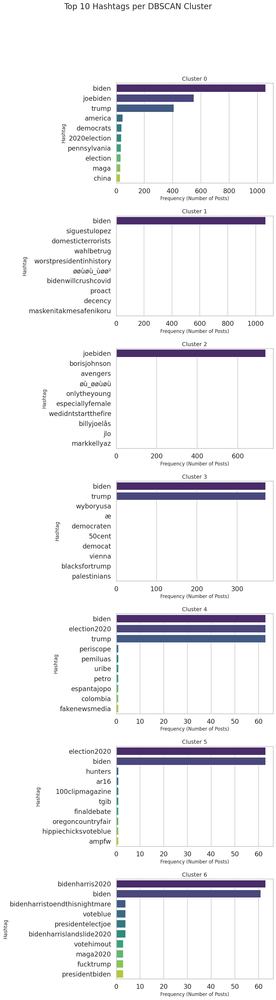

In [51]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
import pandas as pd

# This block uses 'X_reduced_ds3' and 'df_cluster_ds3'
if 'X_reduced_ds3' in locals() and 'df_cluster_ds3' in locals():
    
    # --- Part 1: Run Final Model ---
    
    # We are using the eps=0.2 you selected from the "knee"
    eps_val = 0.2
    min_samples_val = 60 # From our previous block (2 * 30 dimensions)

    print(f"--- Block 9 (Dataset 3): Running DBSCAN with eps={eps_val} & min_samples={min_samples_val} ---")
    
    # 1. Initialize and fit the final model
    dbscan = DBSCAN(eps=eps_val, min_samples=min_samples_val)
    
    # Fit the model to our 30-column reduced data
    cluster_labels_dbscan = dbscan.fit_predict(X_reduced_ds3)

    # 2. Get the cluster labels and add them to our main DataFrame
    df_cluster_ds3['hashtag_group_dbscan'] = cluster_labels_dbscan

    print(f"Successfully added 'hashtag_group_dbscan' column to df_cluster_ds3.")
    
    # --- Part 2: Cluster Summary ---
    unique_labels = set(cluster_labels_dbscan)
    n_clusters_dbscan = len(unique_labels) - (1 if -1 in unique_labels else 0)
    n_noise_points = list(cluster_labels_dbscan).count(-1)

    print("\n--- DBSCAN Summary ---")
    print(f"Total clusters found: {n_clusters_dbscan}")
    print(f"Total noise points found: {n_noise_points} (labeled as -1)")
    print("\nCluster distribution (How many posts in each group):")
    print(df_cluster_ds3['hashtag_group_dbscan'].value_counts())

    # --- Part 3: VISUALIZATION (The "Good Depiction") ---
    print("\n--- Visualizing DBSCAN Cluster Topics (Top Hashtags) ---")
    
    # Get all unique cluster labels, but ignore the -1 (noise) label
    cluster_ids_to_plot = [label for label in unique_labels if label != -1]
    cluster_ids_to_plot.sort()
    
    if not cluster_ids_to_plot:
        print("DBSCAN found 0 clusters (only noise). No topic plots to generate.")
    else:
        # Create a figure to hold all plots
        fig, axes = plt.subplots(len(cluster_ids_to_plot), 1, 
                                 figsize=(10, 5 * len(cluster_ids_to_plot)))
        fig.suptitle('Top 10 Hashtags per DBSCAN Cluster', fontsize=20, y=1.03)
        
        # Handle case if it only finds 1 cluster
        if len(cluster_ids_to_plot) == 1:
            axes = [axes] 

        for i, cluster_id in enumerate(cluster_ids_to_plot):
            
            # 1. Filter for this cluster
            cluster_df = df_cluster_ds3[df_cluster_ds3['hashtag_group_dbscan'] == cluster_id]
            
            # 2. Flatten the list of hashtags
            all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
            
            # 3. Get the Top 10 most common hashtags
            top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)
            
            # 4. Create a bar plot for this cluster
            sns.barplot(
                x=top_10_hashtags.values, 
                y=top_10_hashtags.index, 
                ax=axes[i], 
                palette='viridis'
            )
            axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
            axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
            axes[i].set_ylabel('Hashtag', fontsize=12)

        plt.tight_layout(rect=[0, 0.03, 1, 0.98])
        plt.show()

else:
    print("Matrix 'X_reduced_ds3' or 'df_cluster_ds3' is not found. Please re-run Block 2 and Block 5 first.")

## Agglomerative Clustering

--- Block 10 (Dataset 3): Running Agglomerative Clustering with n_clusters=7 ---
Agglomerative Clustering model fitting complete.
Successfully added 'hashtag_group_agglo' column to df_cluster_ds3.

Cluster distribution (How many posts in each group):
hashtag_group_agglo
0    4162
1     182
2     643
3    1060
4     378
5     742
6     219
Name: count, dtype: int64

--- Visualizing Agglomerative Cluster Topics (Top Hashtags) ---


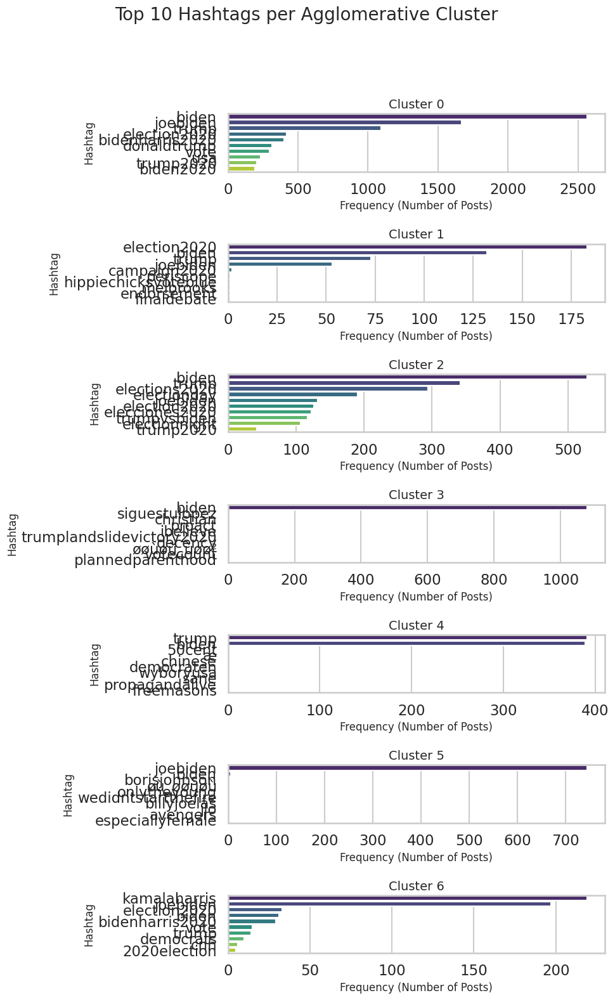

In [52]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
import pandas as pd

# This block uses 'X_reduced_ds3' and 'df_cluster_ds3'
if 'X_reduced_ds3' in locals() and 'df_cluster_ds3' in locals():
    
    # --- Part 1: Run Final Model ---
    
    # We are using n_clusters=7 (the same as K-Means) for a fair comparison
    n_clusters_agglo = 7

    print(f"--- Block 10 (Dataset 3): Running Agglomerative Clustering with n_clusters={n_clusters_agglo} ---")
    
    # 1. Initialize and fit the final model
    # 'ward' linkage is a good default that minimizes variance
    agglomerative = AgglomerativeClustering(n_clusters=n_clusters_agglo, linkage='ward')
    
    # We use 'fit_predict' which fits and returns the labels
    cluster_labels_agglo = agglomerative.fit_predict(X_reduced_ds3)

    print("Agglomerative Clustering model fitting complete.")

    # 2. Get the cluster labels and add them to our main DataFrame
    df_cluster_ds3['hashtag_group_agglo'] = cluster_labels_agglo

    print(f"Successfully added 'hashtag_group_agglo' column to df_cluster_ds3.")
    print("\nCluster distribution (How many posts in each group):")
    print(df_cluster_ds3['hashtag_group_agglo'].value_counts().sort_index())

    # --- Part 2: VISUALIZATION (The "Good Depiction") ---
    print("\n--- Visualizing Agglomerative Cluster Topics (Top Hashtags) ---")
    
    cluster_labels = np.sort(df_cluster_ds3['hashtag_group_agglo'].unique())

    # Create a tall figure to hold all 4 plots
    fig, axes = plt.subplots(len(cluster_labels), 1, figsize=(10, 16)) # 4 plots
    fig.suptitle('Top 10 Hashtags per Agglomerative Cluster', fontsize=20, y=1.02)

    for i, cluster_id in enumerate(cluster_labels):
        
        # 1. Filter for this cluster
        cluster_df = df_cluster_ds3[df_cluster_ds3['hashtag_group_agglo'] == cluster_id]
        
        # 2. Flatten the list of hashtags
        all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
        
        # 3. Get the Top 10 most common hashtags
        top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)
        
        # 4. Create a bar plot for this cluster
        sns.barplot(
            x=top_10_hashtags.values, 
            y=top_10_hashtags.index, 
            ax=axes[i], 
            palette='viridis'
        )
        axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
        axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
        axes[i].set_ylabel('Hashtag', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()

else:
    print("Matrix 'X_reduced_ds3' or 'df_cluster_ds3' is not found. Please re-run Block 2 and Block 5 first.")

## HDBSCAN

--- Block 11 (Dataset 3): Running HDBSCAN with min_cluster_size=50 ---
HDBSCAN model fitting complete.
Successfully added 'hashtag_group_hdbscan' column to df_cluster_ds3.

--- HDBSCAN Summary ---
Total clusters found: 18
Total noise points found: 3285 (labeled as -1)

Cluster distribution (How many posts in each group):
hashtag_group_hdbscan
-1     3285
 0     1060
 1      736
 16     499
 5      375
 15     366
 14     259
 12      93
 13      91
 8       75
 17      73
 4       65
 7       64
 3       63
 9       61
 6       59
 10      56
 11      54
 2       52
Name: count, dtype: int64

--- Visualizing HDBSCAN Cluster Topics (Top Hashtags) ---


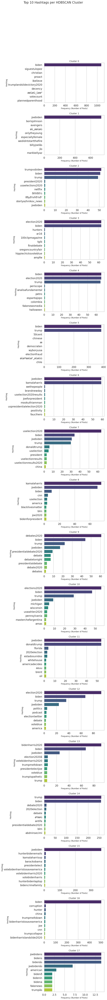

In [53]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import hdbscan  # Make sure you have run "!pip install hdbscan" first
import pandas as pd

# This block uses 'X_reduced_ds3' and 'df_cluster_ds3'
if 'X_reduced_ds3' in locals() and 'df_cluster_ds3' in locals():
    
    # --- Part 1: Run Final Model ---
    
    # We just need to give it a 'min_cluster_size'.
    # Since our dataset is small (10k sample), let's set a small value.
    min_size = 50 # It will only find clusters with 50 or more posts
        
    print(f"--- Block 11 (Dataset 3): Running HDBSCAN with min_cluster_size={min_size} ---")
    
    # 1. Initialize and fit the final model
    hdbscan_clusterer = hdbscan.HDBSCAN(
        min_cluster_size=min_size,
        min_samples=10 # A good value to smooth out noise
    )
    
    # We use 'fit_predict' which fits and returns the labels
    cluster_labels_hdbscan = hdbscan_clusterer.fit_predict(X_reduced_ds3)

    print("HDBSCAN model fitting complete.")

    # 2. Get the cluster labels and add them to our main DataFrame
    df_cluster_ds3['hashtag_group_hdbscan'] = cluster_labels_hdbscan

    print(f"Successfully added 'hashtag_group_hdbscan' column to df_cluster_ds3.")
    
    # --- Part 2: Cluster Summary ---
    unique_labels = set(cluster_labels_hdbscan)
    n_clusters_hdbscan = len(unique_labels) - (1 if -1 in unique_labels else 0)
    n_noise_points = list(cluster_labels_hdbscan).count(-1)

    print("\n--- HDBSCAN Summary ---")
    print(f"Total clusters found: {n_clusters_hdbscan}")
    print(f"Total noise points found: {n_noise_points} (labeled as -1)")
    print("\nCluster distribution (How many posts in each group):")
    print(df_cluster_ds3['hashtag_group_hdbscan'].value_counts())

    # --- Part 3: VISUALIZATION (The "Good Depiction") ---
    print("\n--- Visualizing HDBSCAN Cluster Topics (Top Hashtags) ---")
    
    # Get all unique cluster labels, but ignore the -1 (noise) label
    cluster_ids_to_plot = [label for label in unique_labels if label != -1]
    cluster_ids_to_plot.sort()
    
    if not cluster_ids_to_plot:
        print("HDBSCAN found 0 clusters (only noise). No topic plots to generate.")
    else:
        # Create a figure to hold all plots
        fig, axes = plt.subplots(len(cluster_ids_to_plot), 1, 
                                 figsize=(10, 5 * len(cluster_ids_to_plot)))
        fig.suptitle('Top 10 Hashtags per HDBSCAN Cluster', fontsize=20, y=1.03)
        
        # Handle case if it only finds 1 cluster
        if len(cluster_ids_to_plot) == 1:
            axes = [axes] 

        for i, cluster_id in enumerate(cluster_ids_to_plot):
            
            # 1. Filter for this cluster
            cluster_df = df_cluster_ds3[df_cluster_ds3['hashtag_group_hdbscan'] == cluster_id]
            
            # 2. Flatten the list of hashtags
            all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
            
            # 3. Get the Top 10 most common hashtags
            top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)
            
            # 4. Create a bar plot for this cluster
            sns.barplot(
                x=top_10_hashtags.values, 
                y=top_10_hashtags.index, 
                ax=axes[i], 
                palette='viridis'
            )
            axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
            axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
            axes[i].set_ylabel('Hashtag', fontsize=12)

        plt.tight_layout(rect=[0, 0.03, 1, 0.98])
        plt.show()

else:
    print("Matrix 'X_reduced_ds3' or 'df_cluster_ds3' is not found. Please re-run Blocks 2 and 5 first.")

## BIRCH

--- Block 12 (Dataset 3): Running BIRCH Clustering with n_clusters=4 ---
BIRCH model fitting complete.
Successfully added 'hashtag_group_birch' column to df_cluster_ds3.

Cluster distribution (How many posts in each group):
hashtag_group_birch
0     626
1    1473
2    5059
3     228
Name: count, dtype: int64

--- Visualizing BIRCH Cluster Topics (Top Hashtags) ---


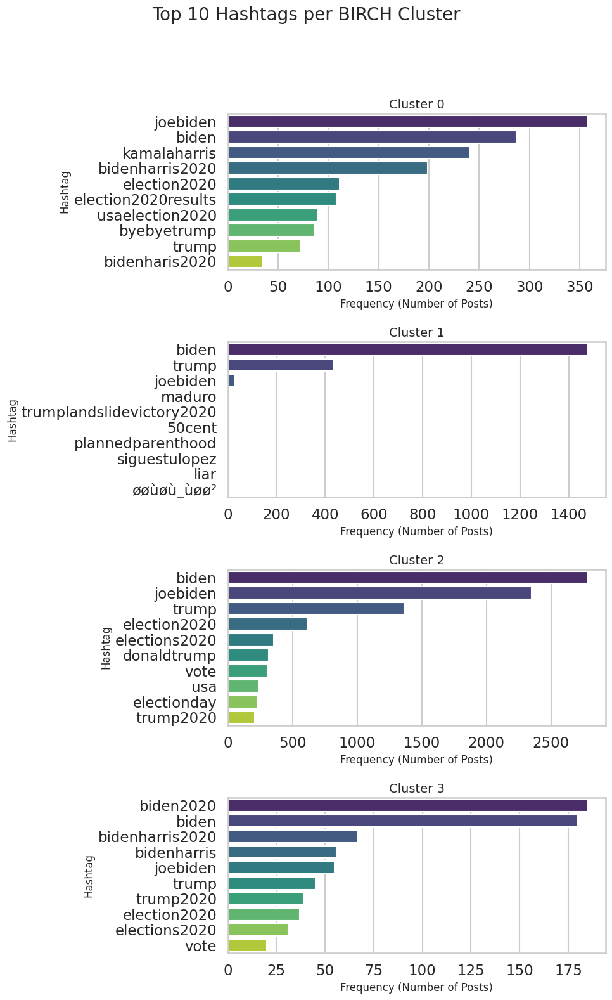

In [54]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import Birch
import pandas as pd

# This block uses 'X_reduced_ds3' and 'df_cluster_ds3'
if 'X_reduced_ds3' in locals() and 'df_cluster_ds3' in locals():
    
    # --- Part 1: Run Final Model ---
    
    # We are using n_clusters=4 (the same as K-Means) for a fair comparison
    n_clusters_birch = 4

    print(f"--- Block 12 (Dataset 3): Running BIRCH Clustering with n_clusters={n_clusters_birch} ---")
    
    # 1. Initialize and fit the final model
    birch = Birch(n_clusters=n_clusters_birch)
    
    # We use 'fit_predict' which fits and returns the labels
    cluster_labels_birch = birch.fit_predict(X_reduced_ds3)

    print("BIRCH model fitting complete.")

    # 2. Get the cluster labels and add them to our main DataFrame
    df_cluster_ds3['hashtag_group_birch'] = cluster_labels_birch

    print(f"Successfully added 'hashtag_group_birch' column to df_cluster_ds3.")
    print("\nCluster distribution (How many posts in each group):")
    print(df_cluster_ds3['hashtag_group_birch'].value_counts().sort_index())

    # --- Part 2: VISUALIZATION (The "Good Depiction") ---
    print("\n--- Visualizing BIRCH Cluster Topics (Top Hashtags) ---")
    
    cluster_labels = np.sort(df_cluster_ds3['hashtag_group_birch'].unique())

    # Create a tall figure to hold all 4 plots
    fig, axes = plt.subplots(len(cluster_labels), 1, figsize=(10, 16)) # 4 plots
    fig.suptitle('Top 10 Hashtags per BIRCH Cluster', fontsize=20, y=1.02)

    for i, cluster_id in enumerate(cluster_labels):
        
        # 1. Filter for this cluster
        cluster_df = df_cluster_ds3[df_cluster_ds3['hashtag_group_birch'] == cluster_id]
        
        # 2. Flatten the list of hashtags
        all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
        
        # 3. Get the Top 10 most common hashtags
        top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)
        
        # 4. Create a bar plot for this cluster
        sns.barplot(
            x=top_10_hashtags.values, 
            y=top_10_hashtags.index, 
            ax=axes[i], 
            palette='viridis'
        )
        axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
        axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
        axes[i].set_ylabel('Hashtag', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()

else:
    print("Matrix 'X_reduced_ds3' or 'df_cluster_ds3' is not found. Please re-run Block 2 and Block 5 first.")

## Internal Evaluation

In [55]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import pandas as pd
import numpy as np

# This block uses 'X_reduced_ds3' (from Block 5) and 'df_cluster_ds3' (from Blocks 7-12)
if 'X_reduced_ds3' in locals() and 'df_cluster_ds3' in locals():
    print("--- Block 13 (Dataset 3): Internal Cluster Evaluation ---")
    
    # Our list of 5 algorithm results
    cluster_columns = {
        'K-Means': 'hashtag_group_kmeans',
        'DBSCAN': 'hashtag_group_dbscan',
        'Agglomerative': 'hashtag_group_agglo',
        'HDBSCAN': 'hashtag_group_hdbscan',
        'BIRCH': 'hashtag_group_birch'
    }
    
    # A list to store our results
    internal_results_list = []

    # Loop through each algorithm's results
    for algo_name, col_name in cluster_columns.items():
        print(f"Evaluating: {algo_name}...")
        
        # Get the labels from our DataFrame
        labels = df_cluster_ds3[col_name]
        
        # --- Important: Handle Noise (-1) ---
        # These metrics cannot handle a "-1" label from DBSCAN/HDBSCAN
        # We must only score the "core" points, not the noise
        if -1 in labels.unique():
            print("  Found noise (-1). Evaluating only non-noise points.")
            
            # Get the indices of all non-noise points
            valid_indices = labels[labels != -1].index
            
            # Filter X_reduced_ds3 to only the non-noise points
            # We must use .loc to match the original index from df_cluster_ds3
            X_filtered = X_reduced_ds3[df_cluster_ds3.index.isin(valid_indices)]
            labels_filtered = labels.loc[valid_indices]
            
            # Check if we still have clusters left
            if len(labels_filtered.unique()) < 2:
                print(f"  Skipping {algo_name}: Not enough clusters ( < 2) after removing noise.")
                continue
        else:
            X_filtered = X_reduced_ds3
            labels_filtered = labels

        # --- Calculate the 3 Metrics ---
        # 1. Silhouette Coefficient (Higher is better)
        sil_score = silhouette_score(X_filtered, labels_filtered)
        
        # 2. Calinski-Harabasz Index (Higher is better)
        ch_score = calinski_harabasz_score(X_filtered, labels_filtered)
        
        # 3. Davies-Bouldin Index (Lower is better)
        db_score = davies_bouldin_score(X_filtered, labels_filtered)
        
        internal_results_list.append({
            'Algorithm': algo_name,
            'Silhouette Score': sil_score,
            'Calinski-Harabasz Score': ch_score,
            'Davies-Bouldin Score': db_score
        })
        
        print(f"  > Silhouette: {sil_score:.4f}")
        print(f"  > Calinski-Harabasz: {ch_score:.2f}")
        print(f"  > Davies-Bouldin: {db_score:.4f}")

    print("\n--- Internal Evaluation Complete ---")
    
    # --- Final Results Table ---
    results_internal_df_ds3 = pd.DataFrame(internal_results_list)
    print("Final Internal Metrics Comparison Table (Dataset 3):")
    print(results_internal_df_ds3.to_string())

else:
    print("Matrix 'X_reduced_ds3' or 'df_cluster_ds3' is not found. Please re-run Blocks 2 and 5 first.")

--- Block 13 (Dataset 3): Internal Cluster Evaluation ---
Evaluating: K-Means...
  > Silhouette: 0.4020
  > Calinski-Harabasz: 1378.62
  > Davies-Bouldin: 1.2963
Evaluating: DBSCAN...
  Found noise (-1). Evaluating only non-noise points.
  > Silhouette: 0.7445
  > Calinski-Harabasz: 12156.48
  > Davies-Bouldin: 0.3892
Evaluating: Agglomerative...
  > Silhouette: 0.3935
  > Calinski-Harabasz: 1325.20
  > Davies-Bouldin: 1.6091
Evaluating: HDBSCAN...
  Found noise (-1). Evaluating only non-noise points.
  > Silhouette: 0.8112
  > Calinski-Harabasz: 13272.31
  > Davies-Bouldin: 0.5147
Evaluating: BIRCH...
  > Silhouette: 0.2162
  > Calinski-Harabasz: 781.33
  > Davies-Bouldin: 2.7675

--- Internal Evaluation Complete ---
Final Internal Metrics Comparison Table (Dataset 3):
       Algorithm  Silhouette Score  Calinski-Harabasz Score  Davies-Bouldin Score
0        K-Means          0.401983              1378.616758              1.296342
1         DBSCAN          0.744510             12156.47

--- Block 14 (Dataset 3): Horizontal Internal Evaluation Visualization ---


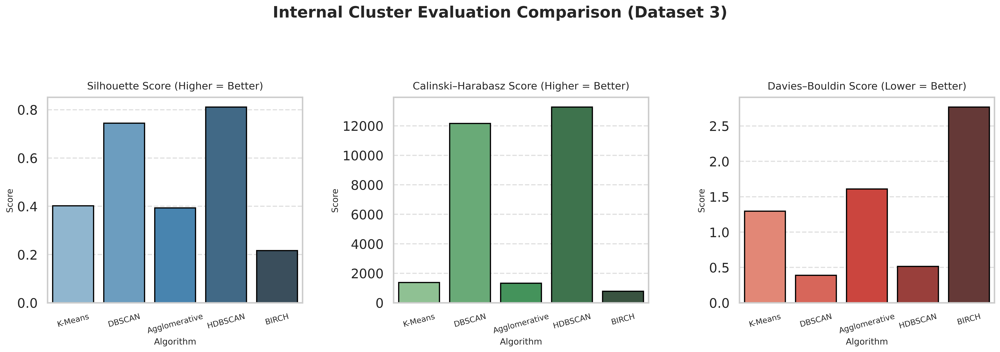

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Apply a clean, consistent theme for presentation
sns.set(style='whitegrid', context='talk')

if 'results_internal_df_ds3' in locals():
    print("--- Block 14 (Dataset 3): Horizontal Internal Evaluation Visualization ---")

    # Create 3 subplots side by side
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), dpi=400)
    fig.suptitle('Internal Cluster Evaluation Comparison (Dataset 3)', fontsize=20, weight='bold', y=1.05)

    # --- Plot 1: Silhouette Score (Higher = Better) ---
    sns.barplot(
        x='Algorithm',
        y='Silhouette Score',
        data=results_internal_df_ds3,
        ax=axes[0],
        palette='Blues_d',
        edgecolor='black'
    )
    axes[0].set_title('Silhouette Score (Higher = Better)', fontsize=13, pad=10)
    axes[0].set_xlabel('Algorithm', fontsize=11)
    axes[0].set_ylabel('Score', fontsize=11)
    axes[0].tick_params(axis='x', rotation=15, labelsize=10)
    axes[0].grid(axis='y', linestyle='--', alpha=0.6)

    # --- Plot 2: Calinski–Harabasz Score (Higher = Better) ---
    sns.barplot(
        x='Algorithm',
        y='Calinski-Harabasz Score',
        data=results_internal_df_ds3,
        ax=axes[1],
        palette='Greens_d',
        edgecolor='black'
    )
    axes[1].set_title('Calinski–Harabasz Score (Higher = Better)', fontsize=13, pad=10)
    axes[1].set_xlabel('Algorithm', fontsize=11)
    axes[1].set_ylabel('Score', fontsize=11)
    axes[1].tick_params(axis='x', rotation=15, labelsize=10)
    axes[1].grid(axis='y', linestyle='--', alpha=0.6)

    # --- Plot 3: Davies–Bouldin Score (Lower = Better) ---
    sns.barplot(
        x='Algorithm',
        y='Davies-Bouldin Score',
        data=results_internal_df_ds3,
        ax=axes[2],
        palette='Reds_d',
        edgecolor='black'
    )
    axes[2].set_title('Davies–Bouldin Score (Lower = Better)', fontsize=13, pad=10)
    axes[2].set_xlabel('Algorithm', fontsize=11)
    axes[2].set_ylabel('Score', fontsize=11)
    axes[2].tick_params(axis='x', rotation=15, labelsize=10)
    axes[2].grid(axis='y', linestyle='--', alpha=0.6)

    # Adjust layout for clean alignment and export
    plt.tight_layout(rect=[0, 0, 1, 0.96], w_pad=2)
    plt.savefig('internal_metrics_dataset3_horizontal.png', dpi=450, bbox_inches='tight')
    plt.show()

else:
    print("DataFrame 'results_internal_df_ds3' not found. Please run Block 13 first.")


## External Evaluation

In [57]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.preprocessing import LabelBinarizer
import warnings

# This block uses 'df_cluster_ds3' from our previous work
if 'df_cluster_ds3' in locals():
    print("--- Block 15 (Dataset 3): Supervised Proxy Task (Evaluating Clusters) ---")
    
    # Suppress warnings for cleaner output
    warnings.filterwarnings('ignore')
    
    # --- Part 1: Setup ---
    
    # The 5 cluster columns you requested
    cluster_columns = [
        'hashtag_group_kmeans',
        'hashtag_group_dbscan',
        'hashtag_group_agglo',
        'hashtag_group_hdbscan',
        'hashtag_group_birch'
    ]
    
    # The classifiers we will use as "variants"
    classifiers = {
        'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
        'Random Forest': RandomForestClassifier(random_state=42, n_jobs=-1)
    }
    
    # The train/test splits you requested
    test_splits = [0.5, 0.4, 0.3, 0.2] # (for 50/50, 60/40, 70/30, 80/20)
    
    # A list to store all our results
    results_list_ds3 = []

    # --- Part 2: Vectorize the Tweet Text (Our 'X') ---
    # We use the text to predict the cluster group
    print("Vectorizing tweet text ('cleaned_text') for the proxy task...")
    text_vectorizer_ds3 = TfidfVectorizer(max_features=2000, stop_words='english')
    # We use .copy() on the relevant subset to be safe
    X_text_df = df_cluster_ds3['cleaned_text'].copy()
    
    # --- Part 3: The Evaluation Loop ---
    
    # Loop 1: For each of our 5 clustering algorithms...
    for col_name in cluster_columns:
        print(f"\n--- Evaluating Algorithm: {col_name} ---")
        
        y_labels_series = df_cluster_ds3[col_name].copy()
        
        # --- Data Prep for this loop ---
        # IMPORTANT: We must remove "noise" rows (label -1)
        # Classifiers cannot be trained on a label of -1
        if -1 in y_labels_series.values:
            print(f"  Found noise points (-1). Removing them for this evaluation.")
            # Get the indices of valid (non-noise) rows
            valid_indices = y_labels_series[y_labels_series != -1].index
            
            # Filter both X and y to only these valid rows
            X_eval_text = X_text_df.loc[valid_indices]
            y_eval = y_labels_series.loc[valid_indices]
        else:
            X_eval_text = X_text_df
            y_eval = y_labels_series
            
        # Check if we have more than 1 class
        if y_eval.nunique() < 2:
            print(f"  Skipping {col_name}: It has fewer than 2 clusters.")
            continue
            
        # Vectorize our text X *after* filtering
        X_eval = text_vectorizer_ds3.fit_transform(X_eval_text)
            
        # Loop 2: For each of our 4 train/test splits...
        for split_size in test_splits:
            train_size_percent = int((1 - split_size) * 100)
            test_size_percent = int(split_size * 100)
            split_name = f"{train_size_percent}/{test_size_percent}"
            print(f"  Running Split: {split_name}")
            
            # Split the data
            try:
                X_train, X_test, y_train, y_test = train_test_split(
                    X_eval, y_eval, test_size=split_size, random_state=42, stratify=y_eval
                )
            except ValueError:
                print(f"    Skipping split: Not enough samples to stratify.")
                continue
            
            # Loop 3: For each of our 2 classifiers...
            for clf_name, classifier in classifiers.items():
                
                # Fit the classifier
                classifier.fit(X_train, y_train)
                
                # Make predictions
                y_pred = classifier.predict(X_test)
                y_pred_proba = classifier.predict_proba(X_test)
                
                # --- Part 4: Calculate All 5 Metrics ---
                accuracy = accuracy_score(y_test, y_pred)
                precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
                recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
                f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)
                
                # ROC-AUC requires "binarizing" labels
                lb = LabelBinarizer()
                lb.fit(y_eval)
                y_test_bin = lb.transform(y_test)
                
                if y_test_bin.shape[1] == 1: # Binary case
                    roc_auc = roc_auc_score(y_test_bin, y_pred_proba[:, 1], average='weighted')
                else: # Multi-class case
                    roc_auc = roc_auc_score(y_test_bin, y_pred_proba, average='weighted', multi_class='ovr')
                
                # Store the results
                results_list_ds3.append({
                    'Cluster Algorithm': col_name.replace('hashtag_group_', ''),
                    'Split': split_name,
                    'Classifier': clf_name,
                    'Accuracy': accuracy,
                    'Precision': precision,
                    'Recall': recall,
                    'F1-Score': f1,
                    'ROC-AUC': roc_auc
                })

    print("\n--- Evaluation Complete ---")
    
    # --- Part 5: Final Results Table ---
    # Convert our list of results into a clean DataFrame
    results_df_ds3 = pd.DataFrame(results_list_ds3)
    
    print("Final Supervised Evaluation Table (Dataset 3):")
    print(results_df_ds3.to_string()) # .to_string() prints the full table

else:
    print("DataFrame 'df_cluster_ds3' is not found. Please re-run Blocks 2 and 5 first.")

--- Block 15 (Dataset 3): Supervised Proxy Task (Evaluating Clusters) ---
Vectorizing tweet text ('cleaned_text') for the proxy task...

--- Evaluating Algorithm: hashtag_group_kmeans ---
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluating Algorithm: hashtag_group_dbscan ---
  Found noise points (-1). Removing them for this evaluation.
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluating Algorithm: hashtag_group_agglo ---
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluating Algorithm: hashtag_group_hdbscan ---
  Found noise points (-1). Removing them for this evaluation.
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluating Algorithm: hashtag_group_birch ---
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluation Compl

--- Block 16 (Dataset 3): Horizontal Supervised Metrics Visualization ---
✅ Averaged results across all splits successfully.


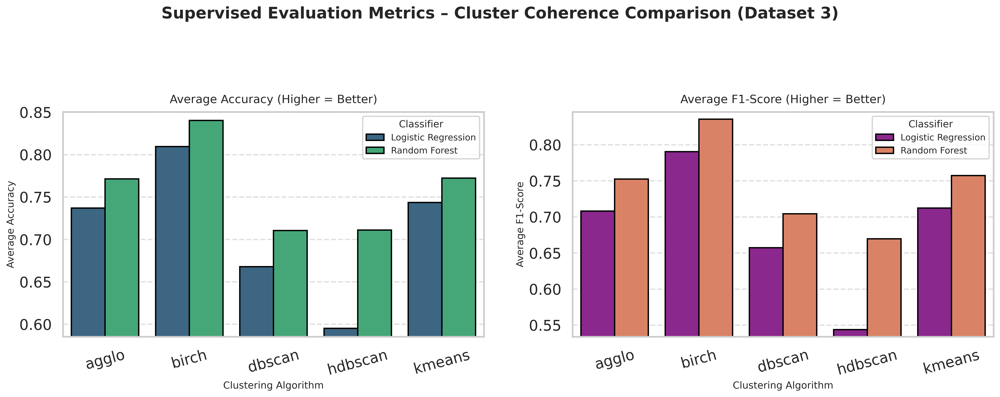

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Presentation theme for consistency
sns.set(style='whitegrid', context='talk')

if 'results_df_ds3' in locals():
    print("--- Block 16 (Dataset 3): Horizontal Supervised Metrics Visualization ---")

    # --- 1. Aggregate Results (Average across splits) ---
    avg_results_df_ds3 = results_df_ds3.groupby(['Cluster Algorithm', 'Classifier'])[
        ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC']
    ].mean().reset_index()
    print("✅ Averaged results across all splits successfully.")

    # --- 2. Create a single horizontal layout ---
    fig, axes = plt.subplots(1, 2, figsize=(16, 6), dpi=400)
    fig.suptitle('Supervised Evaluation Metrics – Cluster Coherence Comparison (Dataset 3)',
                 fontsize=18, weight='bold', y=1.05)

    # --- Plot 1: Accuracy ---
    sns.barplot(
        data=avg_results_df_ds3,
        x='Cluster Algorithm',
        y='Accuracy',
        hue='Classifier',
        errorbar=None,
        palette='viridis',
        edgecolor='black',
        ax=axes[0]
    )
    axes[0].set_title('Average Accuracy (Higher = Better)', fontsize=13, pad=10)
    axes[0].set_xlabel('Clustering Algorithm', fontsize=11)
    axes[0].set_ylabel('Average Accuracy', fontsize=11)
    axes[0].tick_params(axis='x', rotation=15)
    axes[0].legend(title='Classifier', fontsize=10, title_fontsize=11)
    axes[0].grid(axis='y', linestyle='--', alpha=0.6)
    axes[0].set_ylim(avg_results_df_ds3['Accuracy'].min() - 0.01,
                     avg_results_df_ds3['Accuracy'].max() + 0.01)

    # --- Plot 2: F1-Score ---
    sns.barplot(
        data=avg_results_df_ds3,
        x='Cluster Algorithm',
        y='F1-Score',
        hue='Classifier',
        errorbar=None,
        palette='plasma',
        edgecolor='black',
        ax=axes[1]
    )
    axes[1].set_title('Average F1-Score (Higher = Better)', fontsize=13, pad=10)
    axes[1].set_xlabel('Clustering Algorithm', fontsize=11)
    axes[1].set_ylabel('Average F1-Score', fontsize=11)
    axes[1].tick_params(axis='x', rotation=15)
    axes[1].legend(title='Classifier', fontsize=10, title_fontsize=11)
    axes[1].grid(axis='y', linestyle='--', alpha=0.6)
    axes[1].set_ylim(avg_results_df_ds3['F1-Score'].min() - 0.01,
                     avg_results_df_ds3['F1-Score'].max() + 0.01)

    # --- Final layout adjustments ---
    plt.tight_layout(rect=[0, 0, 1, 0.95], w_pad=2)
    plt.savefig('supervised_metrics_dataset3_horizontal.png', dpi=450, bbox_inches='tight')
    plt.show()

else:
    print("DataFrame 'results_df_ds3' is not found. Please run Block 15 first.")


## Trend Discovery

--- Unified Cluster-Level Trend Visualization for All Algorithms (Dataset 3) ---
Resampling tweets by W (weekly trends)...
Processing KMEANS...
Processing DBSCAN...
Processing AGGLO...
Processing HDBSCAN...
Processing BIRCH...


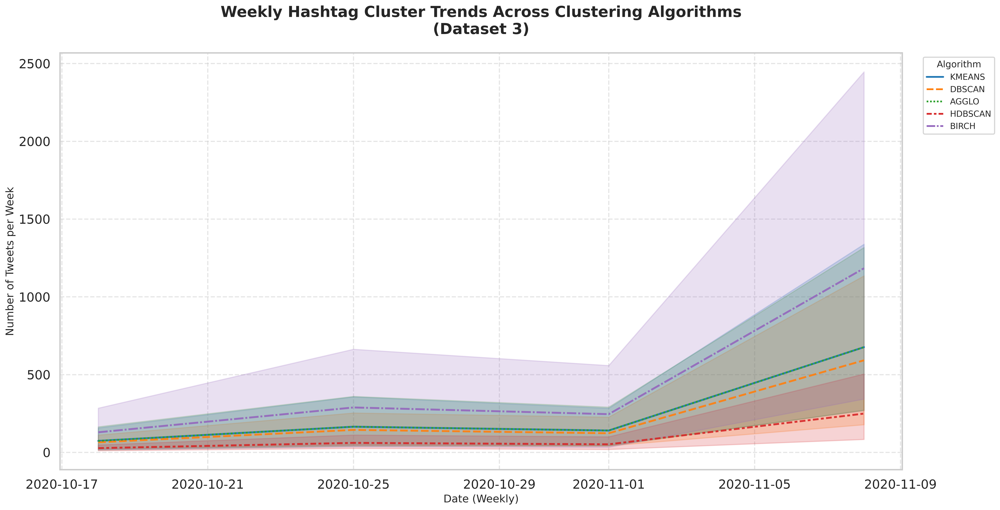

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Clean, slide-friendly style
sns.set(style='whitegrid', context='talk')

if 'df_cluster_ds3' in locals():
    print("--- Unified Cluster-Level Trend Visualization for All Algorithms (Dataset 3) ---")

    cluster_columns = [
        'hashtag_group_kmeans',
        'hashtag_group_dbscan',
        'hashtag_group_agglo',
        'hashtag_group_hdbscan',
        'hashtag_group_birch'
    ]

    resample_period = 'W'  # Weekly trends
    print(f"Resampling tweets by {resample_period} (weekly trends)...")

    combined_long = []  # To store per-algorithm dataframes

    # --- Step 1: Loop through each clustering algorithm ---
    for col_name in cluster_columns:
        algo_name = col_name.replace('hashtag_group_', '').upper()
        print(f"Processing {algo_name}...")

        # Extract relevant columns
        trend_df = df_cluster_ds3[['date', col_name]].copy()

        # Ensure proper datetime conversion
        try:
            trend_df['date'] = pd.to_datetime(trend_df['date'])
        except Exception:
            trend_df['date'] = pd.to_datetime(trend_df['Timestamp'], errors='coerce')

        trend_df.set_index('date', inplace=True)

        # One-hot encode cluster assignments
        cluster_dummies = pd.get_dummies(trend_df[col_name], prefix='Cluster')

        # Aggregate by week
        trends = cluster_dummies.resample(resample_period).sum().reset_index()

        # Convert to long format
        melted = trends.melt(id_vars='date', var_name='Cluster', value_name='Tweet Count')
        melted['Algorithm'] = algo_name
        combined_long.append(melted)

    # --- Step 2: Combine all algorithms into a single dataframe ---
    final_df = pd.concat(combined_long, ignore_index=True)

    # Rename noise cluster for clarity
    final_df['Cluster'] = final_df['Cluster'].replace({'Cluster_-1': 'Noise (-1)'})

    # --- Step 3: Visualization ---
    plt.figure(figsize=(22, 10), dpi=450)
    sns.lineplot(
        data=final_df,
        x='date',
        y='Tweet Count',
        hue='Algorithm',
        style='Algorithm',
        linewidth=2.5,
        alpha=0.9,
        palette='tab10'
    )

    # --- Step 4: Formatting and labels ---
    plt.title('Weekly Hashtag Cluster Trends Across Clustering Algorithms\n(Dataset 3)',
              fontsize=20, weight='bold', pad=25)
    plt.xlabel('Date (Weekly)', fontsize=14)
    plt.ylabel('Number of Tweets per Week', fontsize=14)
    plt.legend(title='Algorithm', fontsize=11, title_fontsize=12, loc='upper left', bbox_to_anchor=(1.02, 1))
    plt.grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout(rect=[0, 0, 0.85, 0.97])

    # --- Step 5: Save for presentation ---
    plt.savefig('cluster_trends_all_algorithms_dataset3_high_quality.png', dpi=450, bbox_inches='tight')
    plt.show()

else:
    print("DataFrame 'df_cluster_ds3' is not found. Please re-run preprocessing blocks for Dataset 3 first.")


# WORKING ON DATASET 4 => COVID 19 

In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set a style for all our plots
sns.set_style('darkgrid')

print("--- Phase 1 (Dataset 4): Load and Inspect ---")

# --- 1. IMPORTANT ---
# Please change this path to match your new dataset's location in Kaggle
filepath_ds4 = '/kaggle/input/covid19-tweets/covid19_tweets.csv' # <-- CHANGE THIS

# --- 2. Load the new dataset ---
try:
    # We'll use 'ISO-8859-1' encoding as it's common for tweet datasets
    df4 = pd.read_csv(
        filepath_ds4, 
        encoding='ISO-8859-1',
        on_bad_lines='skip',
        # --- We are loading a 100k sample for speed ---
        # --- Remove 'nrows' to run on the full (likely multi-million) dataset ---
        nrows=100000 
    )
    print(f"Dataset 4 loaded successfully!")

    # --- 3. Inspect the Data (as per your assignment) ---
    print("\n--- Adequacy of Data (Shape) ---")
    print(f"Dataset shape: {df4.shape}")
    print(f"We've loaded {df4.shape[0]} rows for our analysis.")

    print("\n--- Data Quality (Info) ---")
    print("This shows all column names and their data types:")
    df4.info()

    print("\n--- First 5 Lines ---")
    print(df4.head())
    
except FileNotFoundError:
    print(f"ERROR: File not found at {filepath_ds4}")
    print("Please double-check the path in your Kaggle input panel and try again.")
except Exception as e:
    print(f"An error occurred while loading: {e}")

--- Phase 1 (Dataset 4): Load and Inspect ---
Dataset 4 loaded successfully!

--- Adequacy of Data (Shape) ---
Dataset shape: (100000, 13)
We've loaded 100000 rows for our analysis.

--- Data Quality (Info) ---
This shows all column names and their data types:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   user_name         100000 non-null  object
 1   user_location     79720 non-null   object
 2   user_description  94354 non-null   object
 3   user_created      100000 non-null  object
 4   user_followers    100000 non-null  int64 
 5   user_friends      100000 non-null  int64 
 6   user_favourites   100000 non-null  int64 
 7   user_verified     100000 non-null  bool  
 8   date              100000 non-null  object
 9   text              100000 non-null  object
 10  hashtags          71268 non-null   object
 11  source       

## Feature Engineering and Cleaning

In [61]:
import pandas as pd
import re
import numpy as np

# This block uses 'df4' from Block 1
if 'df4' in locals():
    print("--- Block 2 (Dataset 4, FINAL v2): Feature Engineering with 30k SAMPLE ---")
    
    # --- 1. SAMPLING (THE CRITICAL FIX) ---
    # We will sample 30,000 random rows. This will be very fast
    # and prevent all memory errors.
    print(f"Original size: {len(df4)} rows. Sampling 30,000 rows...")
    df_analysis_ds4 = df4.sample(n=30000, random_state=42).copy()
    print("Sampling complete.")

    # --- 2. Data Cleaning and Imputation ---
    print("Handling data types and missing values...")
    
    # 2.1. Date Conversion
    df_analysis_ds4['date'] = pd.to_datetime(df_analysis_ds4['date'], errors='coerce')
    
    # 2.2. Clean 'tweet' column (Fixed to remove FutureWarning)
    df_analysis_ds4['text'] = df_analysis_ds4['text'].fillna('') 

    # 2.3. Numeric Cleaning (Fixed to remove FutureWarning)
    df_analysis_ds4['user_followers'] = pd.to_numeric(df_analysis_ds4['user_followers'], errors='coerce')
    df_analysis_ds4['user_friends'] = pd.to_numeric(df_analysis_ds4['user_friends'], errors='coerce')
    df_analysis_ds4['user_favourites'] = pd.to_numeric(df_analysis_ds4['user_favourites'], errors='coerce')
    
    for col in ['user_followers', 'user_friends', 'user_favourites']:
        mean_val = df_analysis_ds4[col].mean()
        df_analysis_ds4[col] = df_analysis_ds4[col].fillna(mean_val)
    
    # --- 3. Hashtag Extraction ---
    
    def extract_and_clean_text(text):
        if not isinstance(text, str):
             return ""
        text = re.sub(r'httpsS?://[A-Za-z0-9./]+', '', text)
        text = re.sub(r'@[A-Za-z0-9_]+', '', text)
        text = re.sub(r'[^\w\s#]', '', text) 
        return text.lower()

    def extract_hashtags(text):
        return re.findall(r'#(\w+)', text)

    df_analysis_ds4['cleaned_text'] = df_analysis_ds4['text'].apply(extract_and_clean_text)
    df_analysis_ds4['hashtags_list'] = df_analysis_ds4['cleaned_text'].apply(extract_hashtags)
    df_analysis_ds4['hashtag_count'] = df_analysis_ds4['hashtags_list'].apply(len)
    
    # --- 4. Final Filtering ---
    df_analysis_ds4.dropna(subset=['date'], inplace=True)
    df_cluster_ds4 = df_analysis_ds4[df_analysis_ds4['hashtag_count'] > 0].copy()

    print(f"Total posts for clustering (with hashtags and valid date): {len(df_cluster_ds4)}")
    
    print("\n--- Final DataFrame Head (for verification) ---")
    print(df_cluster_ds4[['date', 'text', 'hashtags_list', 'hashtag_count', 'user_followers']].head())

else:
    print("DataFrame 'df4' is not found. Please run Block 1 (Dataset 4) first.")

--- Block 2 (Dataset 4, FINAL v2): Feature Engineering with 30k SAMPLE ---
Original size: 100000 rows. Sampling 30,000 rows...
Sampling complete.
Handling data types and missing values...
Total posts for clustering (with hashtags and valid date): 21351

--- Final DataFrame Head (for verification) ---
                     date                                               text  \
75721 2020-08-06 16:19:06  CoVid dining done right. âChowâ @Alexandri...   
80184 2020-08-06 15:09:38  Congrats fam ð¸ð\nWe move DM to start you...   
19864 2020-07-26 07:11:20  @SecAzar @WhiteHouse @realDonaldTrump does wha...   
76699 2020-08-06 16:03:41  What's the latest on the Congressional #COVID1...   
92991 2020-08-09 07:21:50  Death toll rises to 10 in the fire that broke ...   

                                       hashtags_list  hashtag_count  \
75721                              [travel, covid19]              2   
80184  [forex, bbnaijalockdown2020, betwayfreedataâ]              3   
1986

## Descriptive Statistics

--- Block 3 (Dataset 4): Descriptive Statistics, Imbalance & Outlier Analysis ---

Total usable posts for clustering: 21351

--- Descriptive Statistics (Hashtag Count and User Engagement) ---
       hashtag_count  user_followers   user_friends  user_favourites
count   21351.000000    2.135100e+04   21351.000000     2.135100e+04
mean        2.061215    1.253217e+05    2082.928106     1.547834e+04
std         1.476482    8.974581e+05    7432.001955     4.960141e+04
min         1.000000    0.000000e+00       0.000000     0.000000e+00
25%         1.000000    1.870000e+02     157.000000     2.440000e+02
50%         2.000000    1.071000e+03     552.000000     1.895000e+03
75%         3.000000    5.803000e+03    1757.500000     9.843000e+03
max        14.000000    1.389221e+07  272369.000000     2.047197e+06

--- Distribution and Imbalance Visualization ---


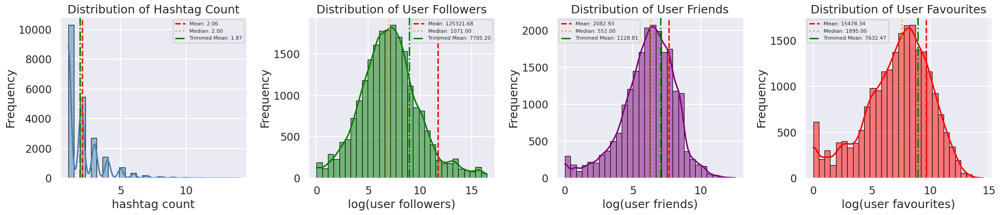


--- Outlier Visualization (Log Scale for Clarity) ---


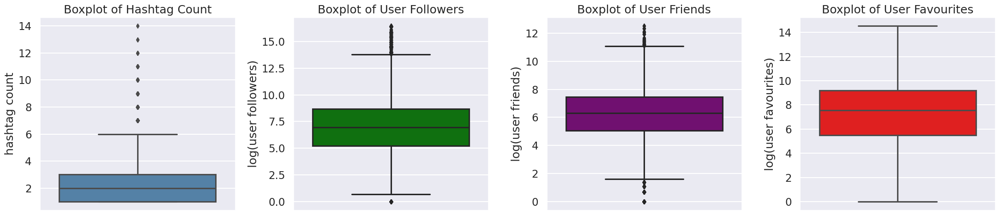


--- Trimmed Statistics (10%) ---
Hashtag Count:
   Original Mean = 2.06, Trimmed Mean = 1.87
   Original Std  = 1.48, Trimmed Std = 1.10

User Followers:
   Original Mean = 125321.68, Trimmed Mean = 7705.20
   Original Std  = 897458.06, Trimmed Std = 19471.39

User Friends:
   Original Mean = 2082.93, Trimmed Mean = 1128.81
   Original Std  = 7432.00, Trimmed Std = 1371.79

User Favourites:
   Original Mean = 15478.34, Trimmed Mean = 7632.47
   Original Std  = 49601.41, Trimmed Std = 13169.06


--- Imbalance Analysis ---
                 Imbalance Ratio (max/median)  Variability Ratio (std/mean)  \
hashtag_count                           7.000                         0.716   
user_followers                      12971.253                         7.161   
user_friends                          493.422                         3.568   
user_favourites                      1080.315                         3.205   

                 Skewness  
hashtag_count       2.067  
user_followers     1

In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# --- Block 3 (Dataset 4): Enhanced Descriptive, Imbalance & Outlier Analysis ---
if 'df_cluster_ds4' in locals():
    print("--- Block 3 (Dataset 4): Descriptive Statistics, Imbalance & Outlier Analysis ---")

    # ========== 1. Descriptive Statistics ==========
    print(f"\nTotal usable posts for clustering: {len(df_cluster_ds4)}")
    print("\n--- Descriptive Statistics (Hashtag Count and User Engagement) ---")
    stats_cols = ['hashtag_count', 'user_followers', 'user_friends', 'user_favourites']
    stats_df = df_cluster_ds4[stats_cols]
    print(stats_df.describe())

    colors = ['steelblue', 'green', 'purple', 'red']

    # ========== 2. Distribution Visualization ==========
    print("\n--- Distribution and Imbalance Visualization ---")
    fig, axes = plt.subplots(1, 4, figsize=(22, 5))

    for i, col in enumerate(stats_cols):
        data = df_cluster_ds4[col].dropna()

        # Use log1p for skewed distributions except hashtag_count
        if col != 'hashtag_count':
            data_plot = np.log1p(data)
            xlabel = f"log({col.replace('_', ' ')})"
        else:
            data_plot = data
            xlabel = col.replace('_', ' ')

        sns.histplot(data_plot, kde=True, bins=30, ax=axes[i], color=colors[i], edgecolor='black')
        axes[i].set_title(f"Distribution of {col.replace('_', ' ').title()}")
        axes[i].set_xlabel(xlabel)
        axes[i].set_ylabel('Frequency')

        # Add visual markers for mean, median, trimmed mean
        mean_val = data.mean()
        median_val = data.median()
        trimmed_mean_val = stats.trim_mean(data, 0.05)
        axes[i].axvline(np.log1p(mean_val) if col != 'hashtag_count' else mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.2f}')
        axes[i].axvline(np.log1p(median_val) if col != 'hashtag_count' else median_val, color='orange', linestyle=':', label=f'Median: {median_val:.2f}')
        axes[i].axvline(np.log1p(trimmed_mean_val) if col != 'hashtag_count' else trimmed_mean_val, color='green', linestyle='-.', label=f'Trimmed Mean: {trimmed_mean_val:.2f}')
        axes[i].legend(fontsize=8)

    plt.tight_layout()
    plt.show()

    # ========== 3. Outlier Visualization (Boxplots) ==========
    print("\n--- Outlier Visualization (Log Scale for Clarity) ---")
    plt.figure(figsize=(22, 5))

    for i, col in enumerate(stats_cols):
        plt.subplot(1, 4, i+1)
        data = df_cluster_ds4[col]
        if col != 'hashtag_count':
            sns.boxplot(y=np.log1p(data), color=colors[i])
            plt.ylabel(f"log({col.replace('_', ' ')})")
        else:
            sns.boxplot(y=data, color=colors[i])
            plt.ylabel(col.replace('_', ' '))
        plt.title(f"Boxplot of {col.replace('_', ' ').title()}")

    plt.tight_layout()
    plt.show()

    # ========== 4. Trimmed Statistics (Mean + Std) ==========
    print("\n--- Trimmed Statistics (10%) ---")
    trim_fraction = 0.05
    for col in stats_cols:
        data = df_cluster_ds4[col].dropna()
        trimmed_mean = stats.trim_mean(data, trim_fraction)
        lower, upper = np.percentile(data, [trim_fraction * 100, 100 - trim_fraction * 100])
        trimmed_data = data[(data >= lower) & (data <= upper)]
        trimmed_std = trimmed_data.std()

        print(f"{col.replace('_', ' ').title()}:")
        print(f"   Original Mean = {data.mean():.2f}, Trimmed Mean = {trimmed_mean:.2f}")
        print(f"   Original Std  = {data.std():.2f}, Trimmed Std = {trimmed_std:.2f}\n")

    # ========== 5. Imbalance Analysis ==========
    print("\n--- Imbalance Analysis ---")
    imbalance_report = {}
    for col in stats_cols:
        data = df_cluster_ds4[col].dropna()
        imbalance_ratio = data.max() / data.median() if data.median() != 0 else np.nan
        variability_ratio = data.std() / data.mean() if data.mean() != 0 else np.nan
        skewness = data.skew()
        imbalance_report[col] = {
            'Imbalance Ratio (max/median)': imbalance_ratio,
            'Variability Ratio (std/mean)': variability_ratio,
            'Skewness': skewness
        }

    imbalance_df = pd.DataFrame(imbalance_report).T
    print(imbalance_df.round(3))

    # ========== 6. Automated Observations ==========
    print("\n--- Automated Observations ---")
    for col in stats_cols:
        row = imbalance_df.loc[col]
        print(f"\n➡ {col.replace('_', ' ').title()}:")
        if row['Imbalance Ratio (max/median)'] > 10:
            print("   ⚠️ Strong imbalance — a few users dominate this metric.")
        elif row['Imbalance Ratio (max/median)'] > 5:
            print("   ℹ️ Moderate imbalance detected.")
        else:
            print("   ✅ Relatively balanced distribution.")

        if row['Variability Ratio (std/mean)'] > 1:
            print("   ⚠️ High variability — large fluctuations between users.")
        else:
            print("   ✅ Variability is within acceptable limits.")

        if abs(row['Skewness']) > 1:
            print(f"   ⚠️ Strong {'right' if row['Skewness'] > 0 else 'left'} skew — data not symmetric.")
        elif abs(row['Skewness']) > 0.5:
            print(f"   ℹ️ Mild {'right' if row['Skewness'] > 0 else 'left'} skew present.")
        else:
            print("   ✅ Distribution is approximately symmetric.")

else:
    print("DataFrame 'df_cluster_ds4' is not found. Please run Block 2 (Dataset 4) first.")


## Correlation Analysis

--- Block 4 (Dataset 4): Correlation Analysis ---
Correlation Matrix (Hashtag Count vs. Engagement):
                 hashtag_count  user_followers  user_friends  user_favourites
hashtag_count         1.000000       -0.058828     -0.002189        -0.030517
user_followers       -0.058828        1.000000     -0.010812        -0.029996
user_friends         -0.002189       -0.010812      1.000000         0.276259
user_favourites      -0.030517       -0.029996      0.276259         1.000000




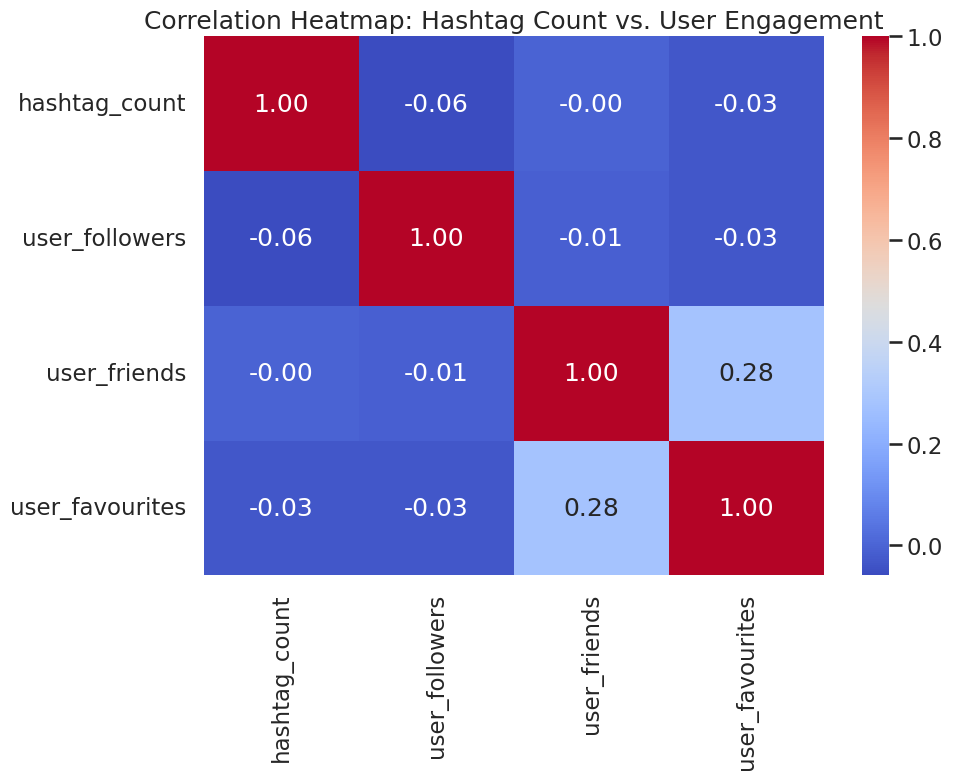

In [63]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# This block uses 'df_cluster_ds4' from Block 2
if 'df_cluster_ds4' in locals():
    print("--- Block 4 (Dataset 4): Correlation Analysis ---")
    
    # We correlate hashtag count with the user engagement metrics
    correlation_data = df_cluster_ds4[['hashtag_count', 'user_followers', 'user_friends', 'user_favourites']]
    
    # 1. Calculate the correlation matrix
    correlation_matrix = correlation_data.corr()
    
    print("Correlation Matrix (Hashtag Count vs. Engagement):")
    print(correlation_matrix)
    print("\n")

    # 2. Plot the correlation matrix as a heatmap
    plt.figure(figsize=(10, 7))
    # annot=True shows the numerical correlation value
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Heatmap: Hashtag Count vs. User Engagement')
    plt.show()

else:
    print("DataFrame 'df_cluster_ds4' is not found. Please re-run Block 2 (Dataset 4) first.")

## TF-IDF & SVD (Clustering Prep)

In [64]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
import numpy as np

# This block uses 'df_cluster_ds4' from Block 2
if 'df_cluster_ds4' in locals():
    print("--- Block 5 (Dataset 4): TF-IDF & SVD (Clustering Prep) ---")
    
    # --- 1. TF-IDF Vectorization ---
    
    # Join the list of hashtags into a single space-separated string
    # e.g., ['covid19', 'staysafe'] becomes "covid19 staysafe"
    df_cluster_ds4['hashtags_str'] = df_cluster_ds4['hashtags_list'].apply(lambda x: ' '.join(x))

    # Initialize the TF-IDF Vectorizer
    # We use conservative features to ensure it runs fast and prevents crashes
    tfidf_vectorizer_ds4 = TfidfVectorizer(
        max_features=2000,  # Only keep the top 2000 hashtags
        min_df=5            # Ignore hashtags that appear in fewer than 5 tweets (removes noise)
    )

    print("Vectorizing hashtags with TF-IDF...")
    # This creates our numerical matrix
    X_tfidf_ds4 = tfidf_vectorizer_ds4.fit_transform(df_cluster_ds4['hashtags_str'])
    
    print(f"TF-IDF matrix shape: {X_tfidf_ds4.shape}")

    # --- 2. Dimensionality Reduction (SVD) ---
    
    # We reduce dimensions to 50 components for fast, stable clustering
    n_components = 50
    
    # We must ensure n_components is less than the number of features
    if n_components >= X_tfidf_ds4.shape[1]:
        n_components = X_tfidf_ds4.shape[1] - 1 # Adjust to be safe
        print(f"Warning: max_features is low. Adjusting n_components to {n_components}.")

    # Initialize TruncatedSVD
    svd_ds4 = TruncatedSVD(n_components=n_components, random_state=42)

    print(f"Reducing dimensions to {n_components} components...")
    # This creates our final input matrix for all clustering
    X_reduced_ds4 = svd_ds4.fit_transform(X_tfidf_ds4)

    print("Reduction complete!")
    print(f"New reduced matrix shape: {X_reduced_ds4.shape}")

else:
    print("DataFrame 'df_cluster_ds4' is not found. Please re-run Block 2 (Dataset 4) first.")

--- Block 5 (Dataset 4): TF-IDF & SVD (Clustering Prep) ---
Vectorizing hashtags with TF-IDF...
TF-IDF matrix shape: (21351, 790)
Reducing dimensions to 50 components...
Reduction complete!
New reduced matrix shape: (21351, 50)


## K means

--- Block 6 (Dataset 4): K-Means++ Elbow Method ---
Calculating inertia for k=2 to k=15 to find the new elbow...
Completed for k=2
Completed for k=3
Completed for k=4
Completed for k=5
Completed for k=6
Completed for k=7
Completed for k=8
Completed for k=9
Completed for k=10
Completed for k=11
Completed for k=12
Completed for k=13
Completed for k=14
Completed for k=15
Calculation complete.



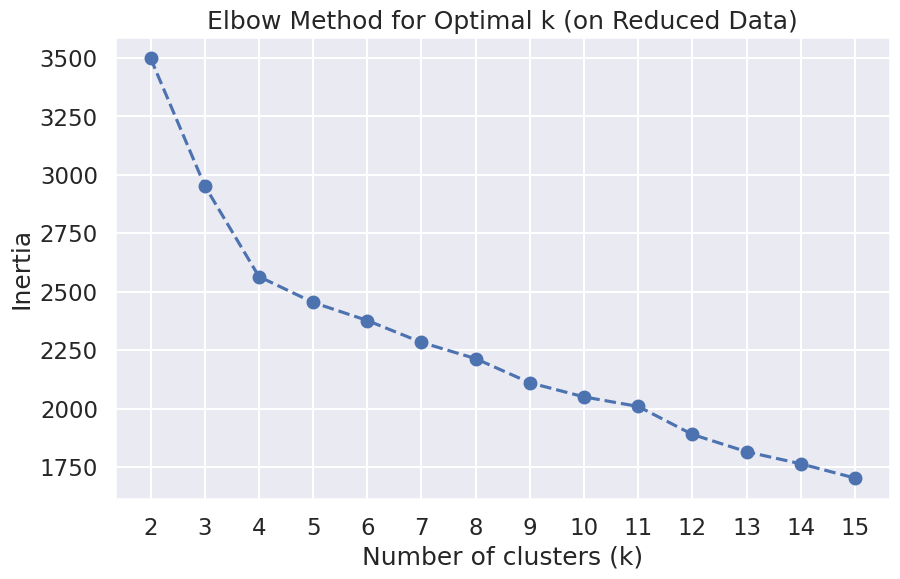

In [65]:
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# This block uses 'X_reduced_ds4' from Block 5
if 'X_reduced_ds4' in locals():
    print("--- Block 6 (Dataset 4): K-Means++ Elbow Method ---")
    
    # --- Part 1: Find the Elbow ---
    print("Calculating inertia for k=2 to k=15 to find the new elbow...")
    inertia_list = []
    
    # We test k from 2 to 15
    k_range = range(2, 16) 

    for k in k_range:
        # 'k-means++' is the default 'init' method
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        
        # We fit on our new 50-column matrix
        kmeans.fit(X_reduced_ds4)
        
        inertia_list.append(kmeans.inertia_)
        print(f"Completed for k={k}")

    print("Calculation complete.\n")

    # --- Part 2: Plot the Elbow Method Graph ---
    plt.figure(figsize=(10, 6))
    plt.plot(k_range, inertia_list, marker='o', linestyle='--')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for Optimal k (on Reduced Data)')
    plt.xticks(k_range)
    plt.grid(True)
    plt.show()

else:
    print("Matrix 'X_reduced_ds4' is not found. Please run Block 5 (Dataset 4) first.")

**Taking k=4**

--- Block 7 (Dataset 4): Running final K-Means model with k=4 ---
Successfully added 'hashtag_group_kmeans' column to df_cluster_ds4.

Cluster distribution (How many posts in each group):
hashtag_group_kmeans
0     9708
1    10192
2      838
3      613
Name: count, dtype: int64

--- Visualizing K-Means Cluster Topics (Top Hashtags) ---


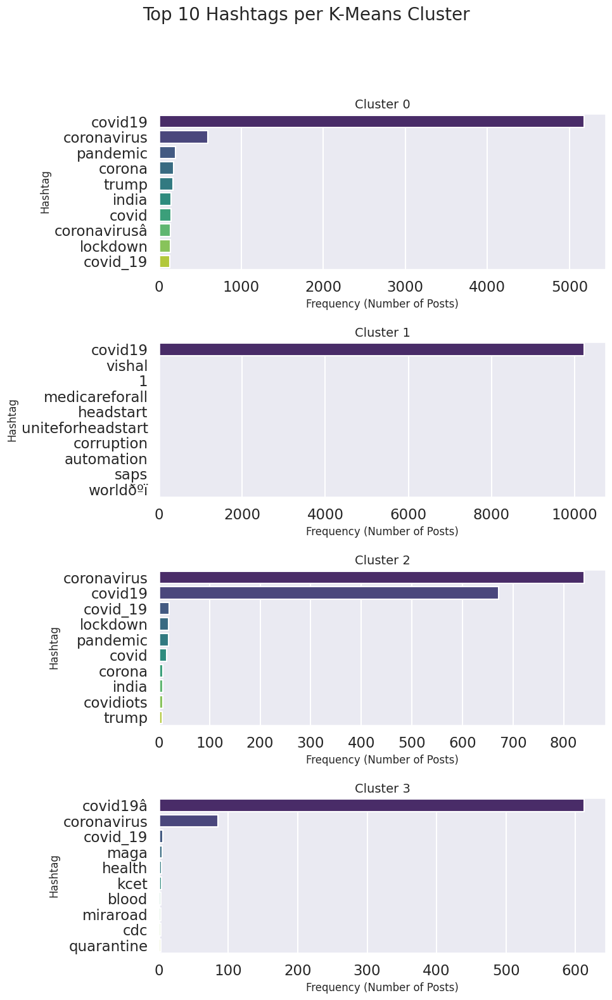

In [66]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# This block uses 'X_reduced_ds4' and 'df_cluster_ds4' from Block 5
if 'X_reduced_ds4' in locals() and 'df_cluster_ds4' in locals():
    
    # --- Part 1: Run Final Model ---
    
    # We are using the k=4 you selected
    optimal_k = 4

    print(f"--- Block 7 (Dataset 4): Running final K-Means model with k={optimal_k} ---")
    
    # 1. Initialize and fit the final model
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    kmeans.fit(X_reduced_ds4)

    # 2. Get the cluster labels and add them to our DataFrame
    cluster_labels_kmeans = kmeans.labels_
    # We add the new labels to our DataFrame 
    df_cluster_ds4['hashtag_group_kmeans'] = cluster_labels_kmeans

    print(f"Successfully added 'hashtag_group_kmeans' column to df_cluster_ds4.")
    print("\nCluster distribution (How many posts in each group):")
    print(df_cluster_ds4['hashtag_group_kmeans'].value_counts().sort_index())

    # --- Part 2: VISUALIZATION (The "Good Depiction") ---
    print("\n--- Visualizing K-Means Cluster Topics (Top Hashtags) ---")
    
    cluster_labels = np.sort(df_cluster_ds4['hashtag_group_kmeans'].unique())

    # Create a tall figure to hold all 4 plots
    fig, axes = plt.subplots(len(cluster_labels), 1, figsize=(10, 16)) # 4 plots
    fig.suptitle('Top 10 Hashtags per K-Means Cluster', fontsize=20, y=1.02)

    for i, cluster_id in enumerate(cluster_labels):
        
        # 1. Filter our DataFrame to *only* posts in this cluster
        cluster_df = df_cluster_ds4[df_cluster_ds4['hashtag_group_kmeans'] == cluster_id]
        
        # 2. Flatten the list of hashtags
        all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
        
        # 3. Get the Top 10 most common hashtags
        top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)
        
        # 4. Create a bar plot for this cluster
        sns.barplot(
            x=top_10_hashtags.values, 
            y=top_10_hashtags.index, 
            ax=axes[i], 
            palette='viridis'
        )
        axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
        axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
        axes[i].set_ylabel('Hashtag', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()

else:
    print("Matrix 'X_reduced_ds4' or 'df_cluster_ds4' is not found. Please re-run Blocks 2 and 5 (for Dataset 4) first.")

## DBSCAN

--- Block 8 (Dataset 4): Finding optimal 'eps' for DBSCAN ---
Calculating nearest neighbors with min_samples = 100...
This may take a few minutes as we are processing 71,000+ data points...
Calculation complete.



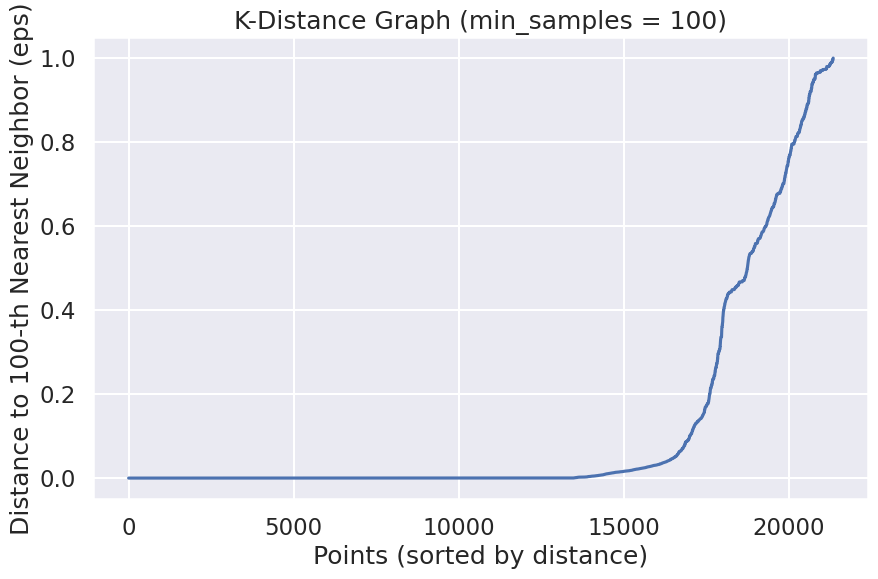

--- How to Read This Plot ---
Look for the 'knee' or 'elbow' of this graph.
It's the point where the line suddenly curves upwards sharply.
A good 'eps' value is the y-axis value right at this sharp bend.


In [67]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# This block uses 'X_reduced_ds4' from Block 5
if 'X_reduced_ds4' in locals():
    print("--- Block 8 (Dataset 4): Finding optimal 'eps' for DBSCAN ---")
    
    # 1. Define 'min_samples'.
    # A good rule of thumb for data with D dimensions is 2*D.
    # Our D = 50 (from X_reduced_ds4), so min_samples = 100
    min_samples = 100
    
    print(f"Calculating nearest neighbors with min_samples = {min_samples}...")
    print("This may take a few minutes as we are processing 71,000+ data points...")

    # 2. Find the distance to the 'min_samples' nearest neighbor for each point
    nn = NearestNeighbors(n_neighbors=min_samples)
    nn.fit(X_reduced_ds4)
    distances, indices = nn.kneighbors(X_reduced_ds4)
    
    # 3. Get the distance to the k-th neighbor (our min_samples value)
    # We sort these distances to plot them
    # We select the last column (min_samples-1 index)
    kth_distances = np.sort(distances[:, min_samples-1])
    
    print("Calculation complete.\n")

    # 4. Plot the k-distance graph
    plt.figure(figsize=(10, 6))
    plt.plot(kth_distances)
    plt.title(f'K-Distance Graph (min_samples = {min_samples})')
    plt.xlabel('Points (sorted by distance)')
    plt.ylabel(f'Distance to {min_samples}-th Nearest Neighbor (eps)')
    plt.grid(True)
    plt.show()

    print("--- How to Read This Plot ---")
    print("Look for the 'knee' or 'elbow' of this graph.")
    print("It's the point where the line suddenly curves upwards sharply.")
    print("A good 'eps' value is the y-axis value right at this sharp bend.")

else:
    print("Matrix 'X_reduced_ds4' is not found. Please re-run Blocks 2 and 5 (for Dataset 4) first.")

**Taking epsilon=0.1**

--- Block 9 (Dataset 4): Running DBSCAN with eps=0.1 & min_samples=100 ---
Successfully added 'hashtag_group_dbscan' column to df_cluster_ds4.

--- DBSCAN Summary ---
Total clusters found: 6
Total noise points found: 4103 (labeled as -1)

Cluster distribution (How many posts in each group):
hashtag_group_dbscan
 1    10192
 0     5818
-1     4103
 3      456
 5      382
 4      239
 2      161
Name: count, dtype: int64

--- Visualizing DBSCAN Cluster Topics (Top Hashtags) ---


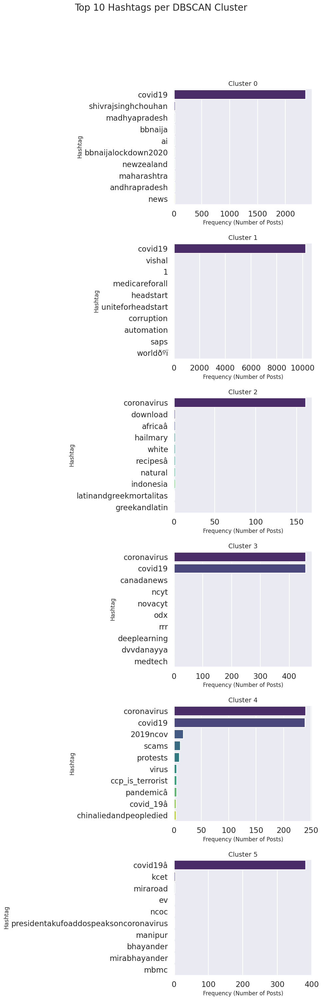

In [68]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
import pandas as pd

# This block uses 'X_reduced_ds4' and 'df_cluster_ds4'
if 'X_reduced_ds4' in locals() and 'df_cluster_ds4' in locals():
    
    # --- Part 1: Run Final Model ---
    
    # We are using the eps=0.1 you selected
    eps_val = 0.1
    min_samples_val = 100 # From our previous block (Block 8)

    print(f"--- Block 9 (Dataset 4): Running DBSCAN with eps={eps_val} & min_samples={min_samples_val} ---")
    
    # 1. Initialize and fit the final model
    dbscan = DBSCAN(eps=eps_val, min_samples=min_samples_val)
    
    # Fit the model to our 50-column reduced data
    cluster_labels_dbscan = dbscan.fit_predict(X_reduced_ds4)

    # 2. Get the cluster labels and add them to our main DataFrame
    df_cluster_ds4['hashtag_group_dbscan'] = cluster_labels_dbscan

    print(f"Successfully added 'hashtag_group_dbscan' column to df_cluster_ds4.")
    
    # --- Part 2: Cluster Summary ---
    unique_labels = set(cluster_labels_dbscan)
    n_clusters_dbscan = len(unique_labels) - (1 if -1 in unique_labels else 0)
    n_noise_points = list(cluster_labels_dbscan).count(-1)

    print("\n--- DBSCAN Summary ---")
    print(f"Total clusters found: {n_clusters_dbscan}")
    print(f"Total noise points found: {n_noise_points} (labeled as -1)")
    print("\nCluster distribution (How many posts in each group):")
    print(df_cluster_ds4['hashtag_group_dbscan'].value_counts())

    # --- Part 3: VISUALIZATION (The "Good Depiction") ---
    print("\n--- Visualizing DBSCAN Cluster Topics (Top Hashtags) ---")
    
    # Get all unique cluster labels, but ignore the -1 (noise) label
    cluster_ids_to_plot = [label for label in unique_labels if label != -1]
    cluster_ids_to_plot.sort()
    
    if not cluster_ids_to_plot:
        print("DBSCAN found 0 clusters (only noise). No topic plots to generate.")
    else:
        # Create a figure to hold all plots
        fig, axes = plt.subplots(len(cluster_ids_to_plot), 1, 
                                 figsize=(10, 5 * len(cluster_ids_to_plot)))
        fig.suptitle('Top 10 Hashtags per DBSCAN Cluster', fontsize=20, y=1.03)
        
        # Handle case if it only finds 1 cluster
        if len(cluster_ids_to_plot) == 1:
            axes = [axes] 

        for i, cluster_id in enumerate(cluster_ids_to_plot):
            
            # 1. Filter for this cluster
            cluster_df = df_cluster_ds4[df_cluster_ds4['hashtag_group_dbscan'] == cluster_id]
            
            # 2. Flatten the list of hashtags
            all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
            
            # 3. Get the Top 10 most common hashtags
            top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)
            
            # 4. Create a bar plot for this cluster
            sns.barplot(
                x=top_10_hashtags.values, 
                y=top_10_hashtags.index, 
                ax=axes[i], 
                palette='viridis'
            )
            axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
            axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
            axes[i].set_ylabel('Hashtag', fontsize=12)

        plt.tight_layout(rect=[0, 0.03, 1, 0.98])
        plt.show()

else:
    print("Matrix 'X_reduced_ds4' or 'df_cluster_ds4' is not found. Please re-run Blocks 2 and 5 (for Dataset 4) first.")

## Agglomerative Clustering

--- Block 10 (Dataset 4): Running Agglomerative Clustering with n_clusters=4 ---
Agglomerative Clustering model fitting complete.
Successfully added 'hashtag_group_agglo' column to df_cluster_ds4.

Cluster distribution (How many posts in each group):
hashtag_group_agglo
0     9926
1      615
2      618
3    10192
Name: count, dtype: int64

--- Visualizing Agglomerative Cluster Topics (Top Hashtags) ---


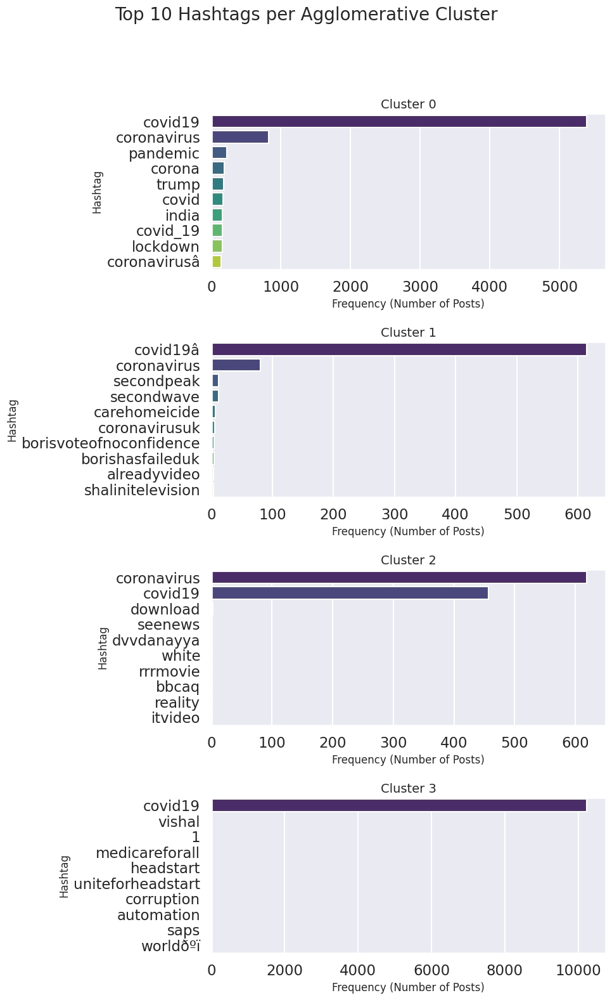

In [69]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
import pandas as pd

# This block uses 'X_reduced_ds4' and 'df_cluster_ds4'
if 'X_reduced_ds4' in locals() and 'df_cluster_ds4' in locals():
    
    # --- Part 1: Run Final Model ---
    
    # We are using n_clusters=4 (the same as K-Means) for a fair comparison
    n_clusters_agglo = 4

    print(f"--- Block 10 (Dataset 4): Running Agglomerative Clustering with n_clusters={n_clusters_agglo} ---")
    
    # 1. Initialize and fit the final model
    # 'ward' linkage is a good default that minimizes variance
    agglomerative = AgglomerativeClustering(n_clusters=n_clusters_agglo, linkage='ward')
    
    # We use 'fit_predict' which fits and returns the labels
    cluster_labels_agglo = agglomerative.fit_predict(X_reduced_ds4)

    print("Agglomerative Clustering model fitting complete.")

    # 2. Get the cluster labels and add them to our main DataFrame
    df_cluster_ds4['hashtag_group_agglo'] = cluster_labels_agglo

    print(f"Successfully added 'hashtag_group_agglo' column to df_cluster_ds4.")
    print("\nCluster distribution (How many posts in each group):")
    print(df_cluster_ds4['hashtag_group_agglo'].value_counts().sort_index())

    # --- Part 2: VISUALIZATION (The "Good Depiction") ---
    print("\n--- Visualizing Agglomerative Cluster Topics (Top Hashtags) ---")
    
    cluster_labels = np.sort(df_cluster_ds4['hashtag_group_agglo'].unique())

    # Create a tall figure to hold all 4 plots
    fig, axes = plt.subplots(len(cluster_labels), 1, figsize=(10, 16)) # 4 plots
    fig.suptitle('Top 10 Hashtags per Agglomerative Cluster', fontsize=20, y=1.02)

    for i, cluster_id in enumerate(cluster_labels):
        
        # 1. Filter for this cluster
        cluster_df = df_cluster_ds4[df_cluster_ds4['hashtag_group_agglo'] == cluster_id]
        
        # 2. Flatten the list of hashtags
        all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
        
        # 3. Get the Top 10 most common hashtags
        top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)
        
        # 4. Create a bar plot for this cluster
        sns.barplot(
            x=top_10_hashtags.values, 
            y=top_10_hashtags.index, 
            ax=axes[i], 
            palette='viridis'
        )
        axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
        axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
        axes[i].set_ylabel('Hashtag', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()

else:
    print("Matrix 'X_reduced_ds4' or 'df_cluster_ds4' is not found. Please re-run Blocks 2 and 5 (for Dataset 4) first.")

## HDBSCAN

--- Block 11 (Dataset 4): Running HDBSCAN with min_cluster_size=50 ---
HDBSCAN model fitting complete.
Successfully added 'hashtag_group_hdbscan' column to df_cluster_ds4.

--- HDBSCAN Summary ---
Total clusters found: 26
Total noise points found: 3277 (labeled as -1)

Cluster distribution (How many posts in each group):
hashtag_group_hdbscan
 0     10192
 23     3369
-1      3277
 25     1424
 17      457
 3       382
 22      319
 24      287
 16      161
 21      161
 19      132
 13      124
 8       112
 15      105
 11       83
 12       81
 10       75
 7        75
 4        67
 20       65
 1        63
 2        62
 6        62
 9        62
 5        53
 14       51
 18       50
Name: count, dtype: int64

--- Visualizing HDBSCAN Cluster Topics (Top Hashtags) ---


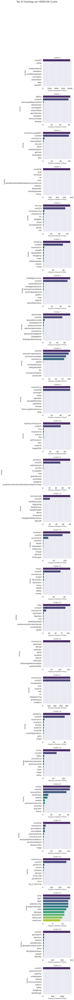

In [70]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import hdbscan  # Make sure you have run "!pip install hdbscan" first
import pandas as pd

# This block uses 'X_reduced_ds4' and 'df_cluster_ds4' from our 30k sample
if 'X_reduced_ds4' in locals() and 'df_cluster_ds4' in locals():
    
    # --- Part 1: Run Final Model ---
    
    # We just need to give it a 'min_cluster_size'.
    # Since our dataset is small (30k sample), let's set a small value.
    min_size = 50 # It will only find clusters with 50 or more posts
        
    print(f"--- Block 11 (Dataset 4): Running HDBSCAN with min_cluster_size={min_size} ---")
    
    # 1. Initialize and fit the final model
    hdbscan_clusterer = hdbscan.HDBSCAN(
        min_cluster_size=min_size,
        min_samples=10 # A good value to smooth out noise
    )
    
    # We use 'fit_predict' which fits and returns the labels
    cluster_labels_hdbscan = hdbscan_clusterer.fit_predict(X_reduced_ds4)

    print("HDBSCAN model fitting complete.")

    # 2. Get the cluster labels and add them to our main DataFrame
    df_cluster_ds4['hashtag_group_hdbscan'] = cluster_labels_hdbscan

    print(f"Successfully added 'hashtag_group_hdbscan' column to df_cluster_ds4.")
    
    # --- Part 2: Cluster Summary ---
    unique_labels = set(cluster_labels_hdbscan)
    n_clusters_hdbscan = len(unique_labels) - (1 if -1 in unique_labels else 0)
    n_noise_points = list(cluster_labels_hdbscan).count(-1)

    print("\n--- HDBSCAN Summary ---")
    print(f"Total clusters found: {n_clusters_hdbscan}")
    print(f"Total noise points found: {n_noise_points} (labeled as -1)")
    print("\nCluster distribution (How many posts in each group):")
    print(df_cluster_ds4['hashtag_group_hdbscan'].value_counts())

    # --- Part 3: VISUALIZATION (The "Good Depiction") ---
    print("\n--- Visualizing HDBSCAN Cluster Topics (Top Hashtags) ---")
    
    # Get all unique cluster labels, but ignore the -1 (noise) label
    cluster_ids_to_plot = [label for label in unique_labels if label != -1]
    cluster_ids_to_plot.sort()
    
    if not cluster_ids_to_plot:
        print("HDBSCAN found 0 clusters (only noise). No topic plots to generate.")
    else:
        # Create a figure to hold all plots
        fig, axes = plt.subplots(len(cluster_ids_to_plot), 1, 
                                 figsize=(10, 5 * len(cluster_ids_to_plot)))
        fig.suptitle('Top 10 Hashtags per HDBSCAN Cluster', fontsize=20, y=1.03)
        
        # Handle case if it only finds 1 cluster
        if len(cluster_ids_to_plot) == 1:
            axes = [axes] 

        for i, cluster_id in enumerate(cluster_ids_to_plot):
            
            # 1. Filter for this cluster
            cluster_df = df_cluster_ds4[df_cluster_ds4['hashtag_group_hdbscan'] == cluster_id]
            
            # 2. Flatten the list of hashtags
            all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
            
            # 3. Get the Top 10 most common hashtags
            top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)
            
            # 4. Create a bar plot for this cluster
            sns.barplot(
                x=top_10_hashtags.values, 
                y=top_10_hashtags.index, 
                ax=axes[i], 
                palette='viridis'
            )
            axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
            axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
            axes[i].set_ylabel('Hashtag', fontsize=12)

        plt.tight_layout(rect=[0, 0.03, 1, 0.98])
        plt.show()

else:
    print("Matrix 'X_reduced_ds4' or 'df_cluster_ds4' is not found. Please re-run Blocks 2 and 5 (for Dataset 4) first.")

## BIRCH

--- Block 12 (Dataset 4): Running BIRCH Clustering with n_clusters=4 ---
BIRCH model fitting complete.
Successfully added 'hashtag_group_birch' column to df_cluster_ds4.

Cluster distribution (How many posts in each group):
hashtag_group_birch
0     9765
1      805
2    10192
3      589
Name: count, dtype: int64

--- Visualizing BIRCH Cluster Topics (Top Hashtags) ---


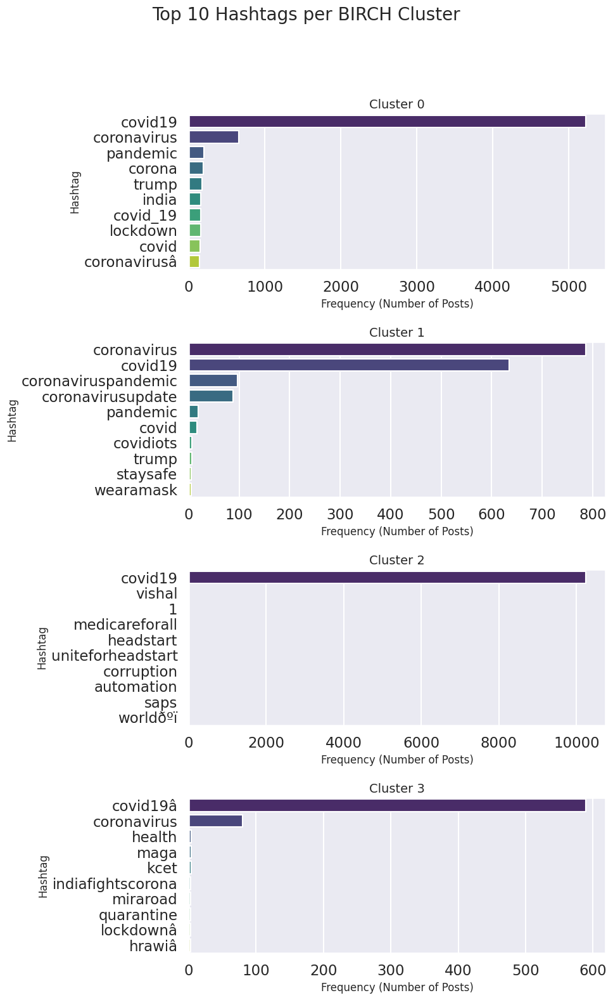

In [71]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import Birch
import pandas as pd

# This block uses 'X_reduced_ds4' and 'df_cluster_ds4' from our 30k sample
if 'X_reduced_ds4' in locals() and 'df_cluster_ds4' in locals():
    
    # --- Part 1: Run Final Model ---
    
    # We are using n_clusters=4 (the same as K-Means) for a fair comparison
    n_clusters_birch = 4

    print(f"--- Block 12 (Dataset 4): Running BIRCH Clustering with n_clusters={n_clusters_birch} ---")
    
    # 1. Initialize and fit the final model
    birch = Birch(n_clusters=n_clusters_birch)
    
    # We use 'fit_predict' which fits and returns the labels
    cluster_labels_birch = birch.fit_predict(X_reduced_ds4)

    print("BIRCH model fitting complete.")

    # 2. Get the cluster labels and add them to our main DataFrame
    df_cluster_ds4['hashtag_group_birch'] = cluster_labels_birch

    print(f"Successfully added 'hashtag_group_birch' column to df_cluster_ds4.")
    print("\nCluster distribution (How many posts in each group):")
    print(df_cluster_ds4['hashtag_group_birch'].value_counts().sort_index())

    # --- Part 2: VISUALIZATION (The "Good Depiction") ---
    print("\n--- Visualizing BIRCH Cluster Topics (Top Hashtags) ---")
    
    cluster_labels = np.sort(df_cluster_ds4['hashtag_group_birch'].unique())

    # Create a tall figure to hold all 4 plots
    fig, axes = plt.subplots(len(cluster_labels), 1, figsize=(10, 16)) # 4 plots
    fig.suptitle('Top 10 Hashtags per BIRCH Cluster', fontsize=20, y=1.02)

    for i, cluster_id in enumerate(cluster_labels):
        
        # 1. Filter for this cluster
        cluster_df = df_cluster_ds4[df_cluster_ds4['hashtag_group_birch'] == cluster_id]
        
        # 2. Flatten the list of hashtags
        all_hashtags_in_cluster = cluster_df['hashtags_list'].explode()
        
        # 3. Get the Top 10 most common hashtags
        top_10_hashtags = all_hashtags_in_cluster.value_counts().head(10)
        
        # 4. Create a bar plot for this cluster
        sns.barplot(
            x=top_10_hashtags.values, 
            y=top_10_hashtags.index, 
            ax=axes[i], 
            palette='viridis'
        )
        axes[i].set_title(f'Cluster {cluster_id}', fontsize=14)
        axes[i].set_xlabel('Frequency (Number of Posts)', fontsize=12)
        axes[i].set_ylabel('Hashtag', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()

else:
    print("Matrix 'X_reduced_ds4' or 'df_cluster_ds4' is not found. Please re-run Blocks 2 and 5 (for Dataset 4) first.")

## Internal Evaluation (Silhouette, CH, DB Metrics)

In [72]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import pandas as pd
import numpy as np

# This block uses 'X_reduced_ds4' (from Block 5) and 'df_cluster_ds4' (from Blocks 7-12)
if 'X_reduced_ds4' in locals() and 'df_cluster_ds4' in locals():
    print("--- Block 13 (Dataset 4): Internal Cluster Evaluation ---")
    
    # Our list of 5 algorithm results
    cluster_columns = {
        'K-Means': 'hashtag_group_kmeans',
        'DBSCAN': 'hashtag_group_dbscan',
        'Agglomerative': 'hashtag_group_agglo',
        'HDBSCAN': 'hashtag_group_hdbscan',
        'BIRCH': 'hashtag_group_birch'
    }
    
    # A list to store our results
    internal_results_list = []

    # Loop through each algorithm's results
    for algo_name, col_name in cluster_columns.items():
        print(f"Evaluating: {algo_name}...")
        
        # Get the labels from our DataFrame
        labels = df_cluster_ds4[col_name]
        
        # --- Important: Handle Noise (-1) ---
        # These metrics cannot handle a "-1" label from DBSCAN/HDBSCAN
        # We must only score the "core" points, not the noise
        if -1 in labels.unique():
            print("  Found noise (-1). Evaluating only non-noise points.")
            
            # Get the indices of all non-noise points
            valid_indices = labels[labels != -1].index
            
            # Filter X_reduced_ds4 to only the non-noise points
            X_filtered = X_reduced_ds4[df_cluster_ds4.index.isin(valid_indices)]
            labels_filtered = labels.loc[valid_indices]
            
            # Check if we still have clusters left
            if len(labels_filtered.unique()) < 2:
                print(f"  Skipping {algo_name}: Not enough clusters ( < 2) after removing noise.")
                continue
        else:
            X_filtered = X_reduced_ds4
            labels_filtered = labels

        # --- Calculate the 3 Metrics ---
        # 1. Silhouette Coefficient (Higher is better) [cite: 705]
        sil_score = silhouette_score(X_filtered, labels_filtered)
        
        # 2. Calinski-Harabasz Index (Higher is better) [cite: 748]
        ch_score = calinski_harabasz_score(X_filtered, labels_filtered)
        
        # 3. Davies-Bouldin Index (Lower is better) [cite: 800]
        db_score = davies_bouldin_score(X_filtered, labels_filtered)
        
        internal_results_list.append({
            'Algorithm': algo_name,
            'Silhouette Score': sil_score,
            'Calinski-Harabasz Score': ch_score,
            'Davies-Bouldin Score': db_score
        })
        
        print(f"  > Silhouette: {sil_score:.4f}")
        print(f"  > Calinski-Harabasz: {ch_score:.2f}")
        print(f"  > Davies-Bouldin: {db_score:.4f}")

    print("\n--- Internal Evaluation Complete ---")
    
    # --- Final Results Table ---
    global results_internal_df_ds4
    results_internal_df_ds4 = pd.DataFrame(internal_results_list)
    print("Final Internal Metrics Comparison Table (Dataset 4):")
    print(results_internal_df_ds4.to_string())

else:
    print("Matrix 'X_reduced_ds4' or 'df_cluster_ds4' is not found. Please re-run Blocks 2 and 5 (Dataset 4) first.")

--- Block 13 (Dataset 4): Internal Cluster Evaluation ---
Evaluating: K-Means...
  > Silhouette: 0.7242
  > Calinski-Harabasz: 15132.47
  > Davies-Bouldin: 0.7091
Evaluating: DBSCAN...
  Found noise (-1). Evaluating only non-noise points.
  > Silhouette: 0.9206
  > Calinski-Harabasz: 423020.17
  > Davies-Bouldin: 0.1677
Evaluating: Agglomerative...
  > Silhouette: 0.7147
  > Calinski-Harabasz: 14873.34
  > Davies-Bouldin: 0.6278
Evaluating: HDBSCAN...
  Found noise (-1). Evaluating only non-noise points.
  > Silhouette: 0.9070
  > Calinski-Harabasz: 65334.88
  > Davies-Bouldin: 0.3866
Evaluating: BIRCH...
  > Silhouette: 0.7238
  > Calinski-Harabasz: 14897.33
  > Davies-Bouldin: 0.7237

--- Internal Evaluation Complete ---
Final Internal Metrics Comparison Table (Dataset 4):
       Algorithm  Silhouette Score  Calinski-Harabasz Score  Davies-Bouldin Score
0        K-Means          0.724164             15132.468577              0.709135
1         DBSCAN          0.920616            4230

--- Block 14 (Dataset 4): Horizontal Internal Evaluation Metrics Visualization (Improved) ---


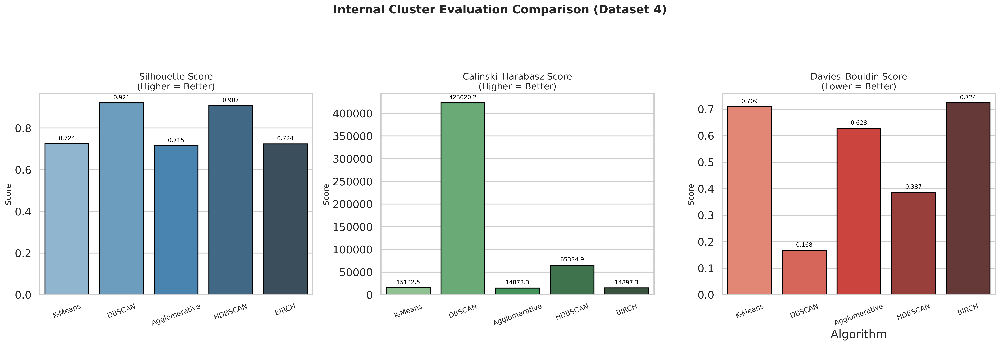

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Presentation style
sns.set(style='whitegrid', context='talk')

if 'results_internal_df_ds4' in locals():
    print("--- Block 14 (Dataset 4): Horizontal Internal Evaluation Metrics Visualization (Improved) ---")
    
    # Create a single row of subplots with more width
    fig, axes = plt.subplots(1, 3, figsize=(22, 7), dpi=450)
    fig.suptitle('Internal Cluster Evaluation Comparison (Dataset 4)', fontsize=18, weight='bold', y=1.05)

    # Common rotation and font size settings
    x_rotation = 20
    x_fontsize = 11
    y_fontsize = 12
    title_fontsize = 14

    # --- Plot 1: Silhouette Score (Higher = Better) ---
    sns.barplot(
        x='Algorithm',
        y='Silhouette Score',
        data=results_internal_df_ds4,
        ax=axes[0],
        palette='Blues_d',
        edgecolor='black'
    )
    axes[0].set_title('Silhouette Score\n(Higher = Better)', fontsize=title_fontsize)
    axes[0].set_ylabel('Score', fontsize=y_fontsize)
    axes[0].set_xlabel('')
    axes[0].tick_params(axis='x', rotation=x_rotation, labelsize=x_fontsize)
    for p in axes[0].patches:
        axes[0].annotate(f'{p.get_height():.3f}',
                         (p.get_x() + p.get_width()/2., p.get_height()),
                         ha='center', va='bottom', fontsize=9, color='black', xytext=(0, 4),
                         textcoords='offset points')

    # --- Plot 2: Calinski–Harabasz Score (Higher = Better) ---
    sns.barplot(
        x='Algorithm',
        y='Calinski-Harabasz Score',
        data=results_internal_df_ds4,
        ax=axes[1],
        palette='Greens_d',
        edgecolor='black'
    )
    axes[1].set_title('Calinski–Harabasz Score\n(Higher = Better)', fontsize=title_fontsize)
    axes[1].set_ylabel('Score', fontsize=y_fontsize)
    axes[1].set_xlabel('')
    axes[1].tick_params(axis='x', rotation=x_rotation, labelsize=x_fontsize)
    for p in axes[1].patches:
        axes[1].annotate(f'{p.get_height():.1f}',
                         (p.get_x() + p.get_width()/2., p.get_height()),
                         ha='center', va='bottom', fontsize=9, color='black', xytext=(0, 4),
                         textcoords='offset points')

    # --- Plot 3: Davies–Bouldin Score (Lower = Better) ---
    sns.barplot(
        x='Algorithm',
        y='Davies-Bouldin Score',
        data=results_internal_df_ds4,
        ax=axes[2],
        palette='Reds_d',
        edgecolor='black'
    )
    axes[2].set_title('Davies–Bouldin Score\n(Lower = Better)', fontsize=title_fontsize)
    axes[2].set_ylabel('Score', fontsize=y_fontsize)
    axes[2].tick_params(axis='x', rotation=x_rotation, labelsize=x_fontsize)
    for p in axes[2].patches:
        axes[2].annotate(f'{p.get_height():.3f}',
                         (p.get_x() + p.get_width()/2., p.get_height()),
                         ha='center', va='bottom', fontsize=9, color='black', xytext=(0, 4),
                         textcoords='offset points')

    # Adjust layout to prevent label clipping
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.subplots_adjust(wspace=0.25, bottom=0.15)  # Added extra bottom space

    # Save high-quality figure for slides
    plt.savefig('internal_metrics_dataset4_horizontal_fixed.png', dpi=450, bbox_inches='tight')
    plt.show()

else:
    print("DataFrame 'results_internal_df_ds4' not found. Please run the previous block for Dataset 4 first.")


## External Evaluation

In [74]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.preprocessing import LabelBinarizer
import warnings

# This block uses 'df_cluster_ds4' from your previous processing
if 'df_cluster_ds4' in locals():
    print("--- Block 15 (Dataset 4): Supervised Proxy Task (Evaluating Clusters) ---")
    
    warnings.filterwarnings('ignore')

    # --- Part 1: Setup ---
    cluster_columns = [
        'hashtag_group_kmeans',
        'hashtag_group_dbscan',
        'hashtag_group_agglo',
        'hashtag_group_hdbscan',
        'hashtag_group_birch'
    ]
    
    classifiers = {
        'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
        'Random Forest': RandomForestClassifier(random_state=42, n_jobs=-1)
    }
    
    test_splits = [0.5, 0.4, 0.3, 0.2]  # 50/50, 60/40, 70/30, 80/20
    results_list_ds4 = []

    # --- Part 2: Vectorize Text ---
    print("Vectorizing tweet text ('cleaned_text') for proxy task...")
    text_vectorizer_ds4 = TfidfVectorizer(max_features=2000, stop_words='english')
    X_text_df = df_cluster_ds4['cleaned_text'].copy()

    # --- Part 3: Evaluation Loop ---
    for col_name in cluster_columns:
        print(f"\n--- Evaluating Algorithm: {col_name} ---")
        y_labels_series = df_cluster_ds4[col_name].copy()

        # Remove noise labels (-1)
        if -1 in y_labels_series.values:
            print("  Found noise points (-1). Removing them for this evaluation.")
            valid_indices = y_labels_series[y_labels_series != -1].index
            X_eval_text = X_text_df.loc[valid_indices]
            y_eval = y_labels_series.loc[valid_indices]
        else:
            X_eval_text = X_text_df
            y_eval = y_labels_series

        if y_eval.nunique() < 2:
            print(f"  Skipping {col_name}: It has fewer than 2 clusters.")
            continue

        X_eval = text_vectorizer_ds4.fit_transform(X_eval_text)

        # Loop through train/test splits
        for split_size in test_splits:
            train_size_percent = int((1 - split_size) * 100)
            test_size_percent = int(split_size * 100)
            split_name = f"{train_size_percent}/{test_size_percent}"
            print(f"  Running Split: {split_name}")

            try:
                X_train, X_test, y_train, y_test = train_test_split(
                    X_eval, y_eval, test_size=split_size, random_state=42, stratify=y_eval
                )
            except ValueError:
                print("    Skipping split: Not enough samples to stratify.")
                continue

            # Loop through classifiers
            for clf_name, classifier in classifiers.items():
                classifier.fit(X_train, y_train)
                y_pred = classifier.predict(X_test)
                y_pred_proba = classifier.predict_proba(X_test)

                # Compute metrics
                accuracy = accuracy_score(y_test, y_pred)
                precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
                recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
                f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)

                lb = LabelBinarizer()
                lb.fit(y_eval)
                y_test_bin = lb.transform(y_test)

                if y_test_bin.shape[1] == 1:  # binary
                    roc_auc = roc_auc_score(y_test_bin, y_pred_proba[:, 1], average='weighted')
                else:  # multiclass
                    roc_auc = roc_auc_score(y_test_bin, y_pred_proba, average='weighted', multi_class='ovr')

                # Store results
                results_list_ds4.append({
                    'Cluster Algorithm': col_name.replace('hashtag_group_', ''),
                    'Split': split_name,
                    'Classifier': clf_name,
                    'Accuracy': accuracy,
                    'Precision': precision,
                    'Recall': recall,
                    'F1-Score': f1,
                    'ROC-AUC': roc_auc
                })

    print("\n--- Evaluation Complete ---")
    results_df_ds4 = pd.DataFrame(results_list_ds4)
    
    print("Final Supervised Evaluation Table (Dataset 4):")
    print(results_df_ds4.to_string())

else:
    print("DataFrame 'df_cluster_ds4' is not found. Please run Blocks 2 and 5 first.")


--- Block 15 (Dataset 4): Supervised Proxy Task (Evaluating Clusters) ---
Vectorizing tweet text ('cleaned_text') for proxy task...

--- Evaluating Algorithm: hashtag_group_kmeans ---
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluating Algorithm: hashtag_group_dbscan ---
  Found noise points (-1). Removing them for this evaluation.
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluating Algorithm: hashtag_group_agglo ---
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluating Algorithm: hashtag_group_hdbscan ---
  Found noise points (-1). Removing them for this evaluation.
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluating Algorithm: hashtag_group_birch ---
  Running Split: 50/50
  Running Split: 60/40
  Running Split: 70/30
  Running Split: 80/20

--- Evaluation Complete 

--- Block 16 (Dataset 4): Horizontal Supervised Metrics Visualization ---
✅ Averaged results across all splits successfully.


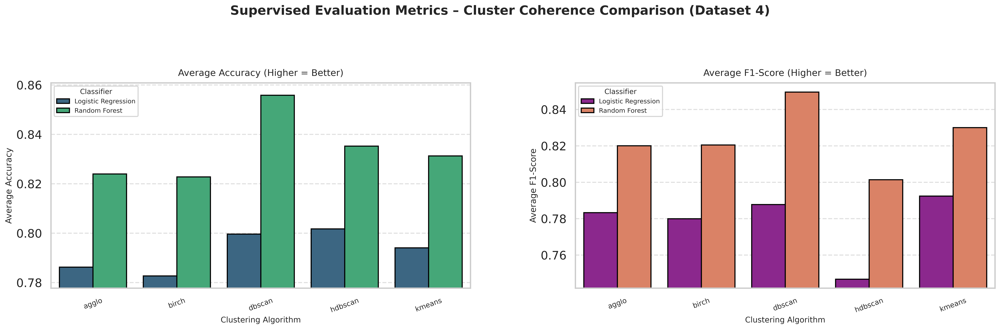

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Presentation style
sns.set(style='whitegrid', context='talk')

if 'results_df_ds4' in locals():
    print("--- Block 16 (Dataset 4): Horizontal Supervised Metrics Visualization ---")

    # --- Step 1: Aggregate Results ---
    avg_results_df_ds4 = results_df_ds4.groupby(['Cluster Algorithm', 'Classifier'])[
        ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC']
    ].mean().reset_index()
    print("✅ Averaged results across all splits successfully.")

    # --- Step 2: Create a horizontal layout for both metrics ---
    fig, axes = plt.subplots(1, 2, figsize=(20, 6), dpi=450)
    fig.suptitle('Supervised Evaluation Metrics – Cluster Coherence Comparison (Dataset 4)',
                 fontsize=18, weight='bold', y=1.05)

    # Common label and font settings
    x_rotation = 20
    label_fontsize = 11
    title_fontsize = 13
    y_fontsize = 12

    # --- Plot 1: Average Accuracy ---
    sns.barplot(
        data=avg_results_df_ds4,
        x='Cluster Algorithm',
        y='Accuracy',
        hue='Classifier',
        errorbar=None,
        palette='viridis',
        edgecolor='black',
        ax=axes[0]
    )
    axes[0].set_title('Average Accuracy (Higher = Better)', fontsize=title_fontsize, pad=10)
    axes[0].set_xlabel('Clustering Algorithm', fontsize=label_fontsize)
    axes[0].set_ylabel('Average Accuracy', fontsize=y_fontsize)
    axes[0].tick_params(axis='x', rotation=x_rotation, labelsize=10)
    axes[0].legend(title='Classifier', fontsize=9, title_fontsize=10, loc='upper left')
    axes[0].grid(axis='y', linestyle='--', alpha=0.6)
    axes[0].set_ylim(avg_results_df_ds4['Accuracy'].min() - 0.005,
                     avg_results_df_ds4['Accuracy'].max() + 0.005)

    # --- Plot 2: Average F1-Score ---
    sns.barplot(
        data=avg_results_df_ds4,
        x='Cluster Algorithm',
        y='F1-Score',
        hue='Classifier',
        errorbar=None,
        palette='plasma',
        edgecolor='black',
        ax=axes[1]
    )
    axes[1].set_title('Average F1-Score (Higher = Better)', fontsize=title_fontsize, pad=10)
    axes[1].set_xlabel('Clustering Algorithm', fontsize=label_fontsize)
    axes[1].set_ylabel('Average F1-Score', fontsize=y_fontsize)
    axes[1].tick_params(axis='x', rotation=x_rotation, labelsize=10)
    axes[1].legend(title='Classifier', fontsize=9, title_fontsize=10, loc='upper left')
    axes[1].grid(axis='y', linestyle='--', alpha=0.6)
    axes[1].set_ylim(avg_results_df_ds4['F1-Score'].min() - 0.005,
                     avg_results_df_ds4['F1-Score'].max() + 0.005)

    # --- Step 3: Layout optimization ---
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.subplots_adjust(wspace=0.25, bottom=0.12)

    # Save high-quality figure for slides
    plt.savefig('supervised_metrics_dataset4_horizontal.png', dpi=450, bbox_inches='tight')
    plt.show()

else:
    print("DataFrame 'results_df_ds4' not found. Please run Block 15 first.")


## Trend Discovery

--- Unified Cluster-Level Trend Visualization for All Algorithms (Dataset 4) ---
Resampling tweets by W (weekly trends)...
Processing KMEANS...
Processing DBSCAN...
Processing AGGLO...
Processing HDBSCAN...
Processing BIRCH...


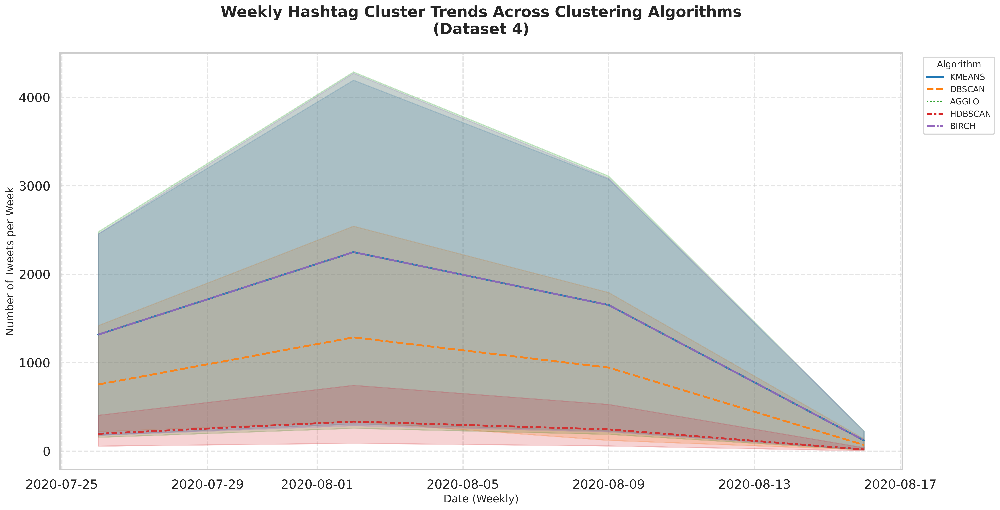

In [76]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Clean, slide-friendly theme
sns.set(style='whitegrid', context='talk')

# This block uses 'df_cluster_ds4' from your previous work
if 'df_cluster_ds4' in locals():
    print("--- Unified Cluster-Level Trend Visualization for All Algorithms (Dataset 4) ---")

    # --- Step 1: Define clustering columns ---
    cluster_columns = [
        'hashtag_group_kmeans',
        'hashtag_group_dbscan',
        'hashtag_group_agglo',
        'hashtag_group_hdbscan',
        'hashtag_group_birch'
    ]

    resample_period = 'W'  # Weekly aggregation for smooth trends
    print(f"Resampling tweets by {resample_period} (weekly trends)...")

    combined_long = []  # List to hold per-algorithm trend DataFrames

    # --- Step 2: Loop through all algorithms and prepare trend data ---
    for col_name in cluster_columns:
        algo_name = col_name.replace('hashtag_group_', '').upper()
        print(f"Processing {algo_name}...")

        # Prepare dataframe with dates and cluster assignments
        trend_df = df_cluster_ds4[['date', col_name]].copy()

        # Ensure proper datetime conversion
        try:
            trend_df['date'] = pd.to_datetime(trend_df['date'])
        except Exception:
            trend_df['date'] = pd.to_datetime(trend_df['Timestamp'], errors='coerce')

        trend_df.set_index('date', inplace=True)

        # One-hot encode cluster IDs
        cluster_dummies = pd.get_dummies(trend_df[col_name], prefix='Cluster')

        # Resample weekly and sum counts
        trends = cluster_dummies.resample(resample_period).sum().reset_index()

        # Melt into long format for Seaborn plotting
        melted = trends.melt(id_vars='date', var_name='Cluster', value_name='Tweet Count')
        melted['Algorithm'] = algo_name
        combined_long.append(melted)

    # --- Step 3: Merge all algorithms into one DataFrame ---
    final_df = pd.concat(combined_long, ignore_index=True)

    # Rename noise cluster for clarity
    final_df['Cluster'] = final_df['Cluster'].replace({'Cluster_-1': 'Noise (-1)'})

    # --- Step 4: Visualization ---
    plt.figure(figsize=(22, 10), dpi=450)
    sns.lineplot(
        data=final_df,
        x='date',
        y='Tweet Count',
        hue='Algorithm',
        style='Algorithm',
        linewidth=2.5,
        alpha=0.9,
        palette='tab10'
    )

    # --- Step 5: Aesthetics for presentation ---
    plt.title('Weekly Hashtag Cluster Trends Across Clustering Algorithms\n(Dataset 4)',
              fontsize=20, weight='bold', pad=25)
    plt.xlabel('Date (Weekly)', fontsize=14)
    plt.ylabel('Number of Tweets per Week', fontsize=14)
    plt.legend(title='Algorithm', fontsize=11, title_fontsize=12, loc='upper left', bbox_to_anchor=(1.02, 1))
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout(rect=[0, 0, 0.85, 0.97])

    # --- Step 6: Export high-quality figure ---
    plt.savefig('cluster_trends_all_algorithms_dataset4_high_quality.png', dpi=450, bbox_inches='tight')
    plt.show()

else:
    print("DataFrame 'df_cluster_ds4' is not found. Please re-run previous preprocessing blocks for Dataset 4.")
